<a href="https://colab.research.google.com/github/shanberochka/DLSchool/blob/master/SRGAN_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SRGAN

SRGAN, представляет собой генерирующую состязательную сеть (GAN), которая может генерировать изображения сверхвысокого разрешения из изображений с низким разрешением с более мелкими деталями и более высоким качеством.

Как и любой другой GAN, SRGAN содержит сеть генератора и сеть дискриминатора. 
Обе сети глубокие. Функциональные возможности обеих этих сетей указаны следующим образом:


1.   Генератор:  принимает изображение с низким разрешением размером 
64x64x3 и после серии слоев свертки и повышающей дискретизации генерирует изображение со сверхвысоким разрешением в форме 256x256x3.
2.   Дискриминатор: принимает изображение с высоким разрешением и пытается определить, является ли данное изображение реальным (из реальных образцов данных) или поддельным (сгенерированным генератором).

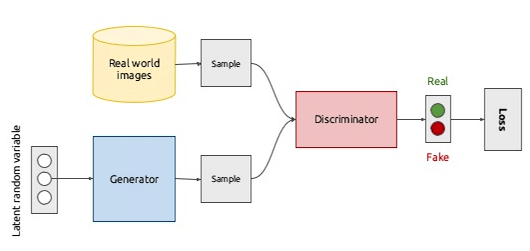

Рассмотрим детальнее архитектуру сети, точнее составляющих её моделей.


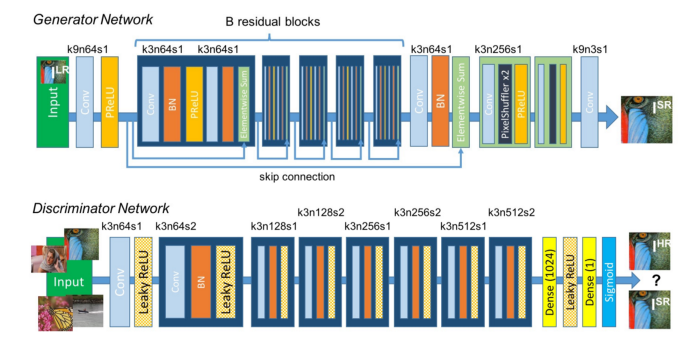

# Архитектура генератора:
*   pre-residual block
*   residual block
*   post-residual block
*   upsampling block
*   last convolution layer

Pre-residual block содержит свёрточный слой и нелинейный слой с функцией активацией ReLU.

Residual block содержит два свёрточных слоя, за каждым следует слой нормализации с momentum=0.8. В конце вычисляется сумма входного в блок тензора и выход последнего batch-norm слоя. Всего 16 residual block-ов.

Post-residual block содержит слой свёртки и слой нормализации с momentum=0.8.

Upsampling block состоит из одного upsampling слоя и одного свёрточного, с функцией активацией ReLU. Всего два upsampling block-ов.

Last convolution layer - свёрточный слой с функцией активацией tanh.



# Архитектура дискриминатора
Дискриминатор тоже глубокая свёрточная нейросеть. Содержит восемь свёрточных слоёв, следующих после двух полносвязных слоёв. После каждого блока свёртки - слой нормализации. В конце - два полносвязных слоя, работающих как классификатор. На выходе - вероятность принадлежности изображения, поданного на вход, к реальному датасету. Детальная конфигурация дискриминатора:



Теперь разберёмся с целевыми функциями.


# Целевая функция
Целевая функция для SRGAN называется **perceptual loss**, которая есть сумма двух лоссов:

*   Content loss
*   Adversarial loss




## Content loss
Есть два типа контент-лосса:

*   Pixel-wise MSE loss
*   VGG loss



### Pixel-wise MSE loss
Данный лосс показывает среднеквадратичную ошибку между каждым пикселем реального изображения и пикселем сгенерированного:

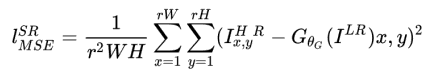

где G(I(LR)) - результат работы генератора - ожидаемое изображение высокого разрешения, I(HR) - образец из датасета изображений с высоким разрешением. 

### VGG loss
Промежуточные слои преобученной сети VGG19 извлекают признаки и поэтому могут быть использованиы для извлечения карт признаков сгенерированных и реальных изображений. VGG loss вычисляет Евклидово расстояние между этими картами признаков:

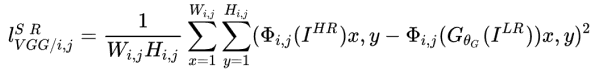

где Ф - символизирует карту признаков, созданных VGG19, Ф(I(HR)) - извлечённая карта признаков реального изображения, Ф(G(I(LR)))  - извлечённая карта признаков сгенерированного изображения.

Для реализации выбираем VGG loss.

## Adversarial loss
Adversarial loss(состязательный лосс) вычисляется дискриминатором по вероятностям правдободобия изображений генератора:


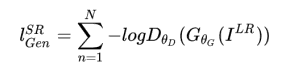

## Perceptual loss
Целевая функция - perceptual loss - взвешенная сумма content loss и adversarial loss:

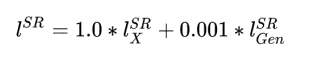

Минимизацией perceptual loss генератор пытается обмануть генератор. Когда величина perceptual loss уменьшается - значит, генератор начал генерировать правдоподобные изображения.

# Подготовка данных
Для обучения модели используем датасет CelebFaces Attributes (CelebA). В нём содержится 202 599 лиц знаменитостей.
Скачиваем и распакуем 

In [1]:
!cp "/content/drive/My Drive/Datasets/img_align_celeba.zip" "dataset.zip"
!unzip -q  dataset.zip

### Подключаем необходимые модули.

In [2]:
!pip install -r requirements.txt

     |████████████████████████████████| 235kB 18.0MB/s 
     |████████████████████████████████| 412.3MB 42kB/s 
     |████████████████████████████████| 26.6MB 121kB/s 
     |████████████████████████████████| 51kB 8.5MB/s 
     |████████████████████████████████| 3.8MB 57.0MB/s 
     |████████████████████████████████| 512kB 58.1MB/s 
  Created wheel for keras: filename=Keras-2.0.6-cp36-none-any.whl size=266418 sha256=175fdd8ee6e8dc0042597b04f54dc4e23b0bf87f36fa9a9eb62890d0d3f2eb05
  Stored in directory: /root/.cache/pip/wheels/d1/70/83/9be5aef9c4c863ea21adacd0be83139b20d3d819401a2b07d3
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=62d8972dc572ecd2f5eff561cb5f73f2d968727ed8eeb7cd778705acae76a6e7
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built keras gast
ERROR: textgenrnn 1.4.1 has requirement keras>=2.1.5, but you'll have keras 2.0.6 which is incompatible.
ERROR: tensorflow-pro

# Реализация модели SRGAN
SRGAN состоит из трёх нейросетей - генератора, дискриминатора и предобученной VGG19.


In [3]:
!python /content/model.py

Using TensorFlow backend.


In [4]:
from model import SRGAN

Using TensorFlow backend.


Epoch:0
d_loss: [0.3138288  0.42773438]
g_loss: [88.67303, 0.9208821, 88.672104]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1
d_loss: [0.32007045 0.45898438]
g_loss: [57.473404, 1.0288972, 57.472374]
Epoch:2
d_loss: [0.27889666 0.5097656 ]
g_loss: [52.252003, 1.3235431, 52.25068]
Epoch:3
d_loss: [0.22628443 0.69140625]
g_loss: [48.89602, 1.8489027, 48.89417]
Epoch:4
d_loss: [0.19564745 0.66015625]
g_loss: [49.67977, 1.8222349, 49.677948]
Epoch:5
d_loss: [0.22884136 0.6074219 ]
g_loss: [51.70019, 1.5630522, 51.698627]
Epoch:6
d_loss: [0.13341948 0.8222656 ]
g_loss: [48.71467, 1.3043419, 48.713364]
Epoch:7
d_loss: [0.11857349 0.84765625]
g_loss: [43.994564, 1.5728606, 43.992992]
Epoch:8
d_loss: [0.02836733 0.984375  ]
g_loss: [37.582222, 1.9661361, 37.580257]
Epoch:9
d_loss: [0.01153006 0.9941406 ]
g_loss: [38.469734, 2.6915722, 38.46704]
Epoch:10
d_loss: [0.01039142 1.        ]
g_loss: [39.487617, 2.24514, 39.48537]
Epoch:11
d_loss: [0.01968222 0.9941406 ]
g_loss: [33.09063, 2.3063924, 33.08832]
Epoch:12
d_loss: [0.02369295 0.9902344 ]
g_loss: [32.990578, 2.5520008, 32.988026]
Epoch:13
d_loss: [0.02148

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:101
d_loss: [0.39940175 0.5136719 ]
g_loss: [15.572451, 1.2267783, 15.571224]
Epoch:102
d_loss: [0.3136808  0.60546875]
g_loss: [14.9235115, 1.9134402, 14.921598]
Epoch:103
d_loss: [0.07264384 0.9238281 ]
g_loss: [8.935694, 3.391993, 8.9323015]
Epoch:104
d_loss: [0.01397262 0.9902344 ]
g_loss: [13.1580715, 4.6627536, 13.153409]
Epoch:105
d_loss: [0.19885358 0.73828125]
g_loss: [11.635028, 4.8731623, 11.630155]
Epoch:106
d_loss: [0.05900323 0.9140625 ]
g_loss: [12.71937, 4.6283937, 12.714742]
Epoch:107
d_loss: [0.30226445 0.5527344 ]
g_loss: [17.356901, 2.6587522, 17.354242]
Epoch:108
d_loss: [0.01291956 0.99609375]
g_loss: [16.056128, 3.155747, 16.05297]
Epoch:109
d_loss: [0.06010675 0.9199219 ]
g_loss: [12.065921, 4.3842516, 12.061537]
Epoch:110
d_loss: [0.18850788 0.7402344 ]
g_loss: [7.6046057, 2.7551327, 7.6018505]
Epoch:111
d_loss: [0.0183425 0.9863281]
g_loss: [14.22008, 3.4375494, 14.216642]
Epoch:112
d_loss: [0.09097662 0.8769531 ]
g_loss: [14.349096, 3.2004528, 14.345896

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:201
d_loss: [0.05484071 0.9160156 ]
g_loss: [8.414564, 3.9118109, 8.410652]
Epoch:202
d_loss: [0.07174702 0.8964844 ]
g_loss: [11.310112, 2.5467093, 11.307566]
Epoch:203
d_loss: [0.21605204 0.6933594 ]
g_loss: [5.824001, 4.859179, 5.819142]
Epoch:204
d_loss: [0.08930524 0.87890625]
g_loss: [7.667268, 5.053751, 7.6622143]
Epoch:205
d_loss: [0.43011454 0.36328125]
g_loss: [6.8725696, 3.1963384, 6.8693733]
Epoch:206
d_loss: [0.07033601 0.9160156 ]
g_loss: [14.516538, 5.2991467, 14.511238]
Epoch:207
d_loss: [0.05999983 0.9296875 ]
g_loss: [9.314652, 5.57587, 9.309076]
Epoch:208
d_loss: [0.3784625 0.5390625]
g_loss: [13.128272, 2.2694445, 13.126002]
Epoch:209
d_loss: [0.11295479 0.8378906 ]
g_loss: [8.5494585, 1.9541326, 8.547504]
Epoch:210
d_loss: [0.06392033 0.91015625]
g_loss: [6.8989716, 4.805268, 6.8941665]
Epoch:211
d_loss: [0.02313246 0.9921875 ]
g_loss: [9.351291, 5.15675, 9.346134]
Epoch:212
d_loss: [0.08321168 0.8847656 ]
g_loss: [9.516032, 4.0941615, 9.511938]
Epoch:213
d_l

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:301
d_loss: [0.14875008 0.8046875 ]
g_loss: [6.176415, 3.6003873, 6.1728144]
Epoch:302
d_loss: [0.04025503 0.9511719 ]
g_loss: [9.417852, 1.4170189, 9.416435]
Epoch:303
d_loss: [0.02576886 0.984375  ]
g_loss: [16.002277, 3.8363614, 15.998441]
Epoch:304
d_loss: [0.3171911  0.55078125]
g_loss: [5.5184684, 2.998918, 5.5154696]
Epoch:305
d_loss: [0.03877492 0.9628906 ]
g_loss: [8.685237, 5.773174, 8.679463]
Epoch:306
d_loss: [0.00871496 0.99609375]
g_loss: [9.192588, 5.608472, 9.186979]
Epoch:307
d_loss: [0.07837347 0.91015625]
g_loss: [7.348166, 4.246591, 7.3439193]
Epoch:308
d_loss: [0.45436302 0.5       ]
g_loss: [7.387845, 2.4413786, 7.3854036]
Epoch:309
d_loss: [0.16117036 0.72265625]
g_loss: [8.439679, 5.030039, 8.434649]
Epoch:310
d_loss: [0.01163256 0.99609375]
g_loss: [7.368997, 3.6127956, 7.365384]
Epoch:311
d_loss: [0.01761217 0.9902344 ]
g_loss: [14.287527, 3.9587612, 14.283568]
Epoch:312
d_loss: [0.00232141 1.        ]
g_loss: [6.845205, 4.239262, 6.8409657]
Epoch:313
d_

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:401
d_loss: [0.18477528 0.69921875]
g_loss: [6.2401166, 7.22462, 6.232892]
Epoch:402
d_loss: [0.0015912 1.       ]
g_loss: [10.3328705, 6.6495295, 10.3262205]
Epoch:403
d_loss: [0.45724598 0.5       ]
g_loss: [8.637218, 7.4165115, 8.629802]
Epoch:404
d_loss: [0.02246039 0.9765625 ]
g_loss: [8.301163, 7.01906, 8.294144]
Epoch:405
d_loss: [0.38480246 0.5332031 ]
g_loss: [9.633624, 4.87265, 9.628752]
Epoch:406
d_loss: [0.30915   0.5371094]
g_loss: [15.358635, 0.9751453, 15.357659]
Epoch:407
d_loss: [0.02189199 0.9863281 ]
g_loss: [9.48844, 5.6934605, 9.482746]
Epoch:408
d_loss: [0.253954  0.5644531]
g_loss: [6.19074, 6.2148404, 6.1845255]
Epoch:409
d_loss: [0.00671783 1.        ]
g_loss: [7.603162, 6.3220825, 7.59684]
Epoch:410
d_loss: [0.03249093 0.96875   ]
g_loss: [12.762637, 6.245634, 12.756392]
Epoch:411
d_loss: [0.2776812  0.61328125]
g_loss: [11.937091, 4.0765715, 11.933014]
Epoch:412
d_loss: [0.25468764 0.6074219 ]
g_loss: [4.846111, 5.2484655, 4.8408623]
Epoch:413
d_loss: [

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:501
d_loss: [0.07541122 0.9082031 ]
g_loss: [5.599405, 5.4158344, 5.593989]
Epoch:502
d_loss: [0.04403798 0.9453125 ]
g_loss: [8.605503, 5.5437603, 8.599959]
Epoch:503
d_loss: [0.19466203 0.75      ]
g_loss: [10.522563, 6.131083, 10.516432]
Epoch:504
d_loss: [0.00417239 0.9980469 ]
g_loss: [8.65984, 6.2158823, 8.653624]
Epoch:505
d_loss: [0.08711524 0.8496094 ]
g_loss: [8.96133, 4.177671, 8.957152]
Epoch:506
d_loss: [0.00168988 1.        ]
g_loss: [7.3213015, 2.7108626, 7.3185906]
Epoch:507
d_loss: [0.03922438 0.9824219 ]
g_loss: [6.6611466, 3.0684023, 6.658078]
Epoch:508
d_loss: [8.4395363e-04 1.0000000e+00]
g_loss: [6.409363, 5.2431026, 6.4041195]
Epoch:509
d_loss: [0.00709394 0.9980469 ]
g_loss: [6.1479664, 5.8200173, 6.1421466]
Epoch:510
d_loss: [9.966379e-04 1.000000e+00]
g_loss: [12.445458, 3.3719149, 12.442086]
Epoch:511
d_loss: [0.13589568 0.7988281 ]
g_loss: [9.112423, 2.1019013, 9.110321]
Epoch:512
d_loss: [0.01796599 0.9921875 ]
g_loss: [9.355794, 4.036517, 9.351757]
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:601
d_loss: [0.28118038 0.55859375]
g_loss: [9.998554, 5.092475, 9.993462]
Epoch:602
d_loss: [5.0011487e-04 1.0000000e+00]
g_loss: [5.9159107, 3.6900349, 5.9122205]
Epoch:603
d_loss: [0.00587488 1.        ]
g_loss: [5.8153133, 4.357615, 5.8109555]
Epoch:604
d_loss: [0.02527323 0.9785156 ]
g_loss: [6.414287, 4.5289984, 6.409758]
Epoch:605
d_loss: [0.07471532 0.9375    ]
g_loss: [7.425701, 5.8897495, 7.4198112]
Epoch:606
d_loss: [0.00494485 0.99609375]
g_loss: [4.5282764, 6.978947, 4.5212975]
Epoch:607
d_loss: [0.27886534 0.5605469 ]
g_loss: [5.557932, 3.8210168, 5.554111]
Epoch:608
d_loss: [0.00471305 1.        ]
g_loss: [5.724973, 6.964048, 5.718009]
Epoch:609
d_loss: [0.27484465 0.6035156 ]
g_loss: [9.267343, 4.6039433, 9.262738]
Epoch:610
d_loss: [0.02667145 0.96484375]
g_loss: [11.146551, 2.7077003, 11.143844]
Epoch:611
d_loss: [0.00775238 0.9980469 ]
g_loss: [5.4587317, 1.9716017, 5.45676]
Epoch:612
d_loss: [0.26135468 0.5410156 ]
g_loss: [6.5587206, 4.437368, 6.554283]
Epoch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:701
d_loss: [9.4960677e-04 1.0000000e+00]
g_loss: [4.096032, 5.686226, 4.090346]
Epoch:702
d_loss: [2.9723215e-04 1.0000000e+00]
g_loss: [4.3203692, 5.323209, 4.315046]
Epoch:703
d_loss: [0.01416122 0.984375  ]
g_loss: [6.270565, 4.9695807, 6.2655954]
Epoch:704
d_loss: [0.00600089 0.99609375]
g_loss: [3.3812542, 3.6873157, 3.3775668]
Epoch:705
d_loss: [8.1535114e-04 1.0000000e+00]
g_loss: [5.0798793, 4.075004, 5.075804]
Epoch:706
d_loss: [0.01473129 0.9902344 ]
g_loss: [3.7350774, 5.7170753, 3.7293603]
Epoch:707
d_loss: [0.00110661 1.        ]
g_loss: [8.469983, 4.567831, 8.465415]
Epoch:708
d_loss: [6.3753943e-04 1.0000000e+00]
g_loss: [8.284974, 3.7041597, 8.28127]
Epoch:709
d_loss: [2.4634297e-04 1.0000000e+00]
g_loss: [7.500024, 6.4745603, 7.4935493]
Epoch:710
d_loss: [2.5009562e-04 1.0000000e+00]
g_loss: [2.8761673, 5.07564, 2.8710916]
Epoch:711
d_loss: [0.0019269 1.       ]
g_loss: [10.003018, 2.5643306, 10.000454]
Epoch:712
d_loss: [0.00100427 1.        ]
g_loss: [7.881037

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:801
d_loss: [7.805866e-04 1.000000e+00]
g_loss: [15.783922, 2.7913892, 15.781131]
Epoch:802
d_loss: [5.1778404e-04 1.0000000e+00]
g_loss: [9.082125, 4.0464244, 9.078078]
Epoch:803
d_loss: [0.00913823 0.9941406 ]
g_loss: [5.766208, 5.0457067, 5.7611623]
Epoch:804
d_loss: [7.740407e-04 1.000000e+00]
g_loss: [3.752269, 4.1499557, 3.748119]
Epoch:805
d_loss: [6.71686e-04 1.00000e+00]
g_loss: [4.3748455, 5.747646, 4.3690977]
Epoch:806
d_loss: [0.02295462 0.984375  ]
g_loss: [6.704841, 2.8625622, 6.7019787]
Epoch:807
d_loss: [0.00103065 1.        ]
g_loss: [6.9851313, 3.4525752, 6.9816785]
Epoch:808
d_loss: [0.00131847 1.        ]
g_loss: [8.875986, 4.6912365, 8.871295]
Epoch:809
d_loss: [0.0131124 0.9941406]
g_loss: [6.170439, 4.35809, 6.1660805]
Epoch:810
d_loss: [0.00308561 1.        ]
g_loss: [5.3801527, 5.3072824, 5.3748455]
Epoch:811
d_loss: [3.9822885e-04 1.0000000e+00]
g_loss: [6.426159, 5.9883633, 6.4201703]
Epoch:812
d_loss: [0.0584811  0.93359375]
g_loss: [4.6063957, 4.96573

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:901
d_loss: [3.878673e-04 1.000000e+00]
g_loss: [4.957888, 6.400069, 4.951488]
Epoch:902
d_loss: [8.852307e-04 1.000000e+00]
g_loss: [8.667342, 5.5648804, 8.6617775]
Epoch:903
d_loss: [7.413005e-04 1.000000e+00]
g_loss: [7.605063, 4.4772935, 7.6005855]
Epoch:904
d_loss: [0.00345433 1.        ]
g_loss: [7.86225, 4.811513, 7.8574386]
Epoch:905
d_loss: [7.328773e-04 1.000000e+00]
g_loss: [6.767643, 4.652632, 6.7629905]
Epoch:906
d_loss: [0.00649949 0.9980469 ]
g_loss: [4.142134, 6.3775244, 4.1357565]
Epoch:907
d_loss: [5.1416643e-04 1.0000000e+00]
g_loss: [5.281738, 3.1284733, 5.2786093]
Epoch:908
d_loss: [0.0032927 1.       ]
g_loss: [2.385112, 6.2916594, 2.3788204]
Epoch:909
d_loss: [8.772819e-04 1.000000e+00]
g_loss: [4.2866397, 7.1141224, 4.2795258]
Epoch:910
d_loss: [5.035026e-04 1.000000e+00]
g_loss: [5.442889, 6.824863, 5.4360642]
Epoch:911
d_loss: [0.00119231 1.        ]
g_loss: [5.088742, 7.0998955, 5.0816417]
Epoch:912
d_loss: [0.00175353 1.        ]
g_loss: [4.3214445, 6.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1001
d_loss: [0.08371992 0.9199219 ]
g_loss: [5.918141, 1.1310625, 5.91701]
Epoch:1002
d_loss: [8.846867e-04 1.000000e+00]
g_loss: [4.2701273, 4.441425, 4.265686]
Epoch:1003
d_loss: [0.00124183 1.        ]
g_loss: [5.1248775, 0.47901613, 5.124398]
Epoch:1004
d_loss: [0.00374036 1.        ]
g_loss: [6.06824, 3.6267123, 6.0646133]
Epoch:1005
d_loss: [0.0015876 1.       ]
g_loss: [5.708282, 3.9613283, 5.7043204]
Epoch:1006
d_loss: [0.02605388 0.98828125]
g_loss: [3.7033544, 4.437711, 3.6989167]
Epoch:1007
d_loss: [0.00189424 1.        ]
g_loss: [7.1545506, 5.5694227, 7.148981]
Epoch:1008
d_loss: [0.00156324 1.        ]
g_loss: [4.4927416, 6.8731465, 4.4858685]
Epoch:1009
d_loss: [0.00201227 1.        ]
g_loss: [4.8566537, 5.4180717, 4.8512354]
Epoch:1010
d_loss: [0.00321569 1.        ]
g_loss: [3.2099745, 3.8631988, 3.2061114]
Epoch:1011
d_loss: [0.00294528 1.        ]
g_loss: [5.46644, 3.1259742, 5.463314]
Epoch:1012
d_loss: [8.7900204e-04 1.0000000e+00]
g_loss: [7.6137705, 6.22515

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1101
d_loss: [0.00248447 1.        ]
g_loss: [4.333458, 5.180315, 4.3282776]
Epoch:1102
d_loss: [6.3065754e-04 1.0000000e+00]
g_loss: [7.2324023, 6.398448, 7.2260036]
Epoch:1103
d_loss: [0.02633571 0.9921875 ]
g_loss: [4.9898095, 5.0250373, 4.9847846]
Epoch:1104
d_loss: [0.01010998 1.        ]
g_loss: [8.052034, 0.14201955, 8.051892]
Epoch:1105
d_loss: [0.19068108 0.6308594 ]
g_loss: [9.77244, 5.7916603, 9.766648]
Epoch:1106
d_loss: [7.2316604e-04 1.0000000e+00]
g_loss: [6.097411, 4.32311, 6.093088]
Epoch:1107
d_loss: [0.31824782 0.546875  ]
g_loss: [10.660281, 5.1502047, 10.655131]
Epoch:1108
d_loss: [0.00507358 1.        ]
g_loss: [4.3917766, 0.41585004, 4.3913608]
Epoch:1109
d_loss: [0.12550126 0.7285156 ]
g_loss: [5.030891, 4.9163423, 5.0259748]
Epoch:1110
d_loss: [0.00425375 1.        ]
g_loss: [5.006712, 6.7538953, 4.999958]
Epoch:1111
d_loss: [0.13489695 0.78515625]
g_loss: [6.435824, 5.3297276, 6.4304943]
Epoch:1112
d_loss: [0.00170167 1.        ]
g_loss: [8.060542, 2.395

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1201
d_loss: [0.00849083 0.99609375]
g_loss: [5.9296775, 6.0614147, 5.923616]
Epoch:1202
d_loss: [0.00151015 1.        ]
g_loss: [6.700341, 4.927151, 6.695414]
Epoch:1203
d_loss: [0.00721013 1.        ]
g_loss: [5.571858, 5.602452, 5.5662556]
Epoch:1204
d_loss: [0.04102267 0.9863281 ]
g_loss: [8.330394, 6.1495123, 8.3242445]
Epoch:1205
d_loss: [0.0222136 0.9921875]
g_loss: [4.713555, 3.429797, 4.710125]
Epoch:1206
d_loss: [0.00341496 1.        ]
g_loss: [8.435078, 0.9720059, 8.434106]
Epoch:1207
d_loss: [0.02670068 0.9863281 ]
g_loss: [6.244142, 2.9355018, 6.2412066]
Epoch:1208
d_loss: [1.5159347e-04 1.0000000e+00]
g_loss: [6.1377454, 6.9385924, 6.130807]
Epoch:1209
d_loss: [0.01432816 0.99609375]
g_loss: [3.2261133, 4.001201, 3.2221122]
Epoch:1210
d_loss: [9.1979885e-04 1.0000000e+00]
g_loss: [8.399747, 5.3310637, 8.394416]
Epoch:1211
d_loss: [0.39435697 0.5019531 ]
g_loss: [7.6888666, 6.138902, 7.682728]
Epoch:1212
d_loss: [0.00210972 1.        ]
g_loss: [4.2898626, 8.167344, 4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1301
d_loss: [0.02238702 0.9902344 ]
g_loss: [2.276056, 4.158946, 2.271897]
Epoch:1302
d_loss: [0.0040271 1.       ]
g_loss: [3.5740047, 4.5995545, 3.569405]
Epoch:1303
d_loss: [0.48589975 0.48828125]
g_loss: [5.3009124, 1.7697959, 5.2991424]
Epoch:1304
d_loss: [0.04331574 0.94921875]
g_loss: [5.515313, 0.6391392, 5.514674]
Epoch:1305
d_loss: [0.49453488 0.5       ]
g_loss: [2.9931836, 0.34789863, 2.9928358]
Epoch:1306
d_loss: [0.22902833 0.6113281 ]
g_loss: [6.245126, 5.7630615, 6.2393627]
Epoch:1307
d_loss: [0.4052209 0.5253906]
g_loss: [4.852154, 5.3299074, 4.8468237]
Epoch:1308
d_loss: [0.06577353 0.9121094 ]
g_loss: [6.4396944, 3.9046512, 6.4357896]
Epoch:1309
d_loss: [0.7202306  0.07617188]
g_loss: [4.2515197, 2.5037775, 4.249016]
Epoch:1310
d_loss: [0.00753912 0.99609375]
g_loss: [5.6479616, 0.85112536, 5.6471105]
Epoch:1311
d_loss: [0.00746954 0.9980469 ]
g_loss: [6.6538, 4.4092846, 6.6493907]
Epoch:1312
d_loss: [0.00699511 1.        ]
g_loss: [6.588943, 0.05861609, 6.588

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1401
d_loss: [0.10412653 0.89453125]
g_loss: [7.486143, 0.89427775, 7.485249]
Epoch:1402
d_loss: [0.35199714 0.5       ]
g_loss: [5.4222116, 5.3184404, 5.416893]
Epoch:1403
d_loss: [0.03371917 0.9785156 ]
g_loss: [8.754285, 4.380541, 8.749905]
Epoch:1404
d_loss: [0.02405862 0.9785156 ]
g_loss: [8.322852, 4.3850975, 8.318467]
Epoch:1405
d_loss: [0.1992522 0.6855469]
g_loss: [5.7462835, 7.1222315, 5.7391615]
Epoch:1406
d_loss: [0.002948 1.      ]
g_loss: [9.339506, 3.416798, 9.336089]
Epoch:1407
d_loss: [0.00168694 1.        ]
g_loss: [5.050097, 6.414114, 5.043683]
Epoch:1408
d_loss: [0.012984 1.      ]
g_loss: [3.3449683, 4.6573825, 3.340311]
Epoch:1409
d_loss: [0.00286511 1.        ]
g_loss: [6.9662147, 6.1522694, 6.9600625]
Epoch:1410
d_loss: [0.0986385  0.86328125]
g_loss: [11.444347, 5.686888, 11.438661]
Epoch:1411
d_loss: [0.01337758 0.9902344 ]
g_loss: [10.404943, 4.606784, 10.400336]
Epoch:1412
d_loss: [4.5100332e-04 1.0000000e+00]
g_loss: [6.543255, 2.7823808, 6.5404725]
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1501
d_loss: [0.13031282 0.80859375]
g_loss: [3.8487241, 0.8770026, 3.8478472]
Epoch:1502
d_loss: [0.05385362 0.9667969 ]
g_loss: [8.765034, 1.3426026, 8.763691]
Epoch:1503
d_loss: [0.17486262 0.7421875 ]
g_loss: [5.0999875, 2.544928, 5.0974426]
Epoch:1504
d_loss: [0.18944794 0.6152344 ]
g_loss: [5.1801367, 0.03917927, 5.1800976]
Epoch:1505
d_loss: [0.18296771 0.6953125 ]
g_loss: [5.9791374, 0.38696522, 5.97875]
Epoch:1506
d_loss: [0.37718663 0.5078125 ]
g_loss: [4.5439897, 2.1988192, 4.541791]
Epoch:1507
d_loss: [0.16703834 0.7832031 ]
g_loss: [11.915641, 3.681726, 11.911959]
Epoch:1508
d_loss: [0.02201123 1.        ]
g_loss: [4.130103, 2.1737745, 4.127929]
Epoch:1509
d_loss: [0.15401132 0.77734375]
g_loss: [3.8125627, 2.1466696, 3.810416]
Epoch:1510
d_loss: [0.26485005 0.5371094 ]
g_loss: [3.5730488, 4.289983, 3.568759]
Epoch:1511
d_loss: [0.2807753 0.5839844]
g_loss: [10.406759, 4.530444, 10.402228]
Epoch:1512
d_loss: [0.02858366 0.9863281 ]
g_loss: [5.591385, 1.6413833, 5.589

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1601
d_loss: [0.4369858  0.30859375]
g_loss: [3.3889146, 1.021244, 3.3878934]
Epoch:1602
d_loss: [0.11249974 0.9042969 ]
g_loss: [6.1754727, 1.082785, 6.17439]
Epoch:1603
d_loss: [0.07236295 0.98046875]
g_loss: [3.198858, 2.3645735, 3.1964934]
Epoch:1604
d_loss: [0.0454732 0.9980469]
g_loss: [3.007811, 2.5058122, 3.0053053]
Epoch:1605
d_loss: [0.08525827 0.9238281 ]
g_loss: [10.18716, 0.6424618, 10.186517]
Epoch:1606
d_loss: [0.05118096 0.9863281 ]
g_loss: [4.0131106, 2.0100365, 4.011101]
Epoch:1607
d_loss: [0.02197901 0.9980469 ]
g_loss: [4.3920236, 2.3766923, 4.389647]
Epoch:1608
d_loss: [0.09348656 0.92578125]
g_loss: [3.2209823, 1.3807571, 3.2196016]
Epoch:1609
d_loss: [0.25679344 0.55859375]
g_loss: [2.5316277, 4.195185, 2.5274324]
Epoch:1610
d_loss: [0.18951754 0.6875    ]
g_loss: [8.813289, 3.9663851, 8.809322]
Epoch:1611
d_loss: [0.03553623 0.96875   ]
g_loss: [3.6417415, 0.5717747, 3.6411698]
Epoch:1612
d_loss: [0.2091228  0.70703125]
g_loss: [6.0412507, 2.823617, 6.0384

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1701
d_loss: [0.25861818 0.546875  ]
g_loss: [4.253207, 1.2174615, 4.25199]
Epoch:1702
d_loss: [0.02608808 0.9921875 ]
g_loss: [4.9056, 0.13192286, 4.905468]
Epoch:1703
d_loss: [0.0114754 1.       ]
g_loss: [5.9997587, 0.47797996, 5.999281]
Epoch:1704
d_loss: [0.08783802 0.8730469 ]
g_loss: [5.5307927, 0.56978065, 5.530223]
Epoch:1705
d_loss: [0.18850565 0.65234375]
g_loss: [5.7838373, 2.2979915, 5.7815394]
Epoch:1706
d_loss: [0.05808898 0.92578125]
g_loss: [6.2611594, 3.2259674, 6.2579336]
Epoch:1707
d_loss: [0.12121817 0.85546875]
g_loss: [4.6588416, 2.9645772, 4.655877]
Epoch:1708
d_loss: [0.18788627 0.6816406 ]
g_loss: [5.1015177, 2.7598138, 5.0987577]
Epoch:1709
d_loss: [0.07215903 0.9433594 ]
g_loss: [3.9700787, 6.3393383, 3.9637394]
Epoch:1710
d_loss: [0.06168561 0.9433594 ]
g_loss: [5.5686207, 4.48329, 5.5641375]
Epoch:1711
d_loss: [0.18145467 0.62109375]
g_loss: [6.1114163, 2.4264328, 6.1089897]
Epoch:1712
d_loss: [0.05655374 0.9628906 ]
g_loss: [3.88401, 4.1665835, 3.87

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1801
d_loss: [0.08732913 0.91015625]
g_loss: [4.5287256, 4.6087575, 4.524117]
Epoch:1802
d_loss: [0.08831526 0.9746094 ]
g_loss: [2.7278516, 0.60348356, 2.7272482]
Epoch:1803
d_loss: [0.08620305 0.921875  ]
g_loss: [8.207292, 0.9157517, 8.206376]
Epoch:1804
d_loss: [0.23488474 0.5839844 ]
g_loss: [6.8833117, 4.192747, 6.879119]
Epoch:1805
d_loss: [0.00838852 1.        ]
g_loss: [4.4837646, 2.9698606, 4.480795]
Epoch:1806
d_loss: [0.4033622 0.515625 ]
g_loss: [6.2475343, 3.7502508, 6.243784]
Epoch:1807
d_loss: [0.42526948 0.48046875]
g_loss: [4.194376, 1.3262988, 4.19305]
Epoch:1808
d_loss: [0.40241033 0.48242188]
g_loss: [4.648294, 1.1297209, 4.6471643]
Epoch:1809
d_loss: [0.3173669 0.5019531]
g_loss: [3.635293, 3.2053065, 3.6320877]
Epoch:1810
d_loss: [0.45492497 0.29882812]
g_loss: [4.507671, 1.5504986, 4.50612]
Epoch:1811
d_loss: [0.35539377 0.33203125]
g_loss: [9.942729, 0.7781979, 9.941951]
Epoch:1812
d_loss: [0.02962791 0.984375  ]
g_loss: [8.534583, 3.4799614, 8.531103]
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1901
d_loss: [0.02462741 0.9824219 ]
g_loss: [13.918422, 3.0263252, 13.915396]
Epoch:1902
d_loss: [0.03819142 0.9785156 ]
g_loss: [3.002822, 3.0916886, 2.9997303]
Epoch:1903
d_loss: [0.05908605 0.96875   ]
g_loss: [8.183987, 4.3353395, 8.179651]
Epoch:1904
d_loss: [0.24831426 0.58203125]
g_loss: [9.548327, 0.6635311, 9.547664]
Epoch:1905
d_loss: [0.24814388 0.5683594 ]
g_loss: [6.03085, 1.7043372, 6.0291457]
Epoch:1906
d_loss: [0.01184683 0.9980469 ]
g_loss: [6.162555, 3.5307517, 6.1590242]
Epoch:1907
d_loss: [0.03766873 0.98046875]
g_loss: [4.6119003, 2.2194235, 4.609681]
Epoch:1908
d_loss: [0.01780957 1.        ]
g_loss: [3.8791206, 0.8029767, 3.8783176]
Epoch:1909
d_loss: [0.02709993 0.99609375]
g_loss: [3.2508113, 1.5380466, 3.2492733]
Epoch:1910
d_loss: [0.0956498  0.87109375]
g_loss: [4.8298187, 2.4603894, 4.8273582]
Epoch:1911
d_loss: [0.07291866 0.9511719 ]
g_loss: [2.9706469, 3.530329, 2.9671166]
Epoch:1912
d_loss: [0.22702417 0.7011719 ]
g_loss: [8.776677, 3.4187891, 8.

/content/model.py:213: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2001
d_loss: [0.0238121  0.99609375]
g_loss: [5.3293133, 3.9167843, 5.3253965]
Epoch:2002
d_loss: [0.00118236 1.        ]
g_loss: [2.6050248, 3.5779424, 2.6014469]
Epoch:2003
d_loss: [0.00117716 1.        ]
g_loss: [3.7167015, 4.112755, 3.7125888]
Epoch:2004
d_loss: [0.00490957 1.        ]
g_loss: [7.5571237, 3.6534734, 7.55347]
Epoch:2005
d_loss: [0.16162924 0.6875    ]
g_loss: [3.431394, 1.2044401, 3.4301896]
Epoch:2006
d_loss: [0.05425604 0.96875   ]
g_loss: [2.7356844, 2.1213536, 2.733563]
Epoch:2007
d_loss: [0.01963558 0.9941406 ]
g_loss: [5.4074636, 2.8439746, 5.4046197]
Epoch:2008
d_loss: [0.0624065 0.9707031]
g_loss: [4.0950756, 3.533107, 4.0915427]
Epoch:2009
d_loss: [0.01151961 0.9980469 ]
g_loss: [7.6153283, 3.4212422, 7.611907]
Epoch:2010
d_loss: [0.02070301 0.9941406 ]
g_loss: [5.442478, 4.6755905, 5.437803]
Epoch:2011
d_loss: [0.02250611 1.        ]
g_loss: [6.0508113, 3.883164, 6.046928]
Epoch:2012
d_loss: [0.00456312 1.        ]
g_loss: [3.677723, 4.2744, 3.673448

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2101
d_loss: [0.04760918 0.9628906 ]
g_loss: [7.994149, 1.2848004, 7.9928646]
Epoch:2102
d_loss: [0.00590218 0.9980469 ]
g_loss: [6.544093, 4.0162907, 6.5400767]
Epoch:2103
d_loss: [0.1869998 0.7421875]
g_loss: [4.7456837, 1.2520492, 4.7444315]
Epoch:2104
d_loss: [0.00789902 1.        ]
g_loss: [4.9863133, 5.5283747, 4.980785]
Epoch:2105
d_loss: [0.00277002 1.        ]
g_loss: [5.253971, 5.6524725, 5.2483187]
Epoch:2106
d_loss: [0.05382221 0.9609375 ]
g_loss: [4.1539316, 3.4338555, 4.150498]
Epoch:2107
d_loss: [0.00154239 1.        ]
g_loss: [4.1011643, 0.9458896, 4.1002183]
Epoch:2108
d_loss: [0.00201688 1.        ]
g_loss: [7.0827494, 2.313016, 7.080436]
Epoch:2109
d_loss: [0.03825929 0.98828125]
g_loss: [3.5951803, 2.131204, 3.593049]
Epoch:2110
d_loss: [0.0028323 1.       ]
g_loss: [5.012925, 2.7269115, 5.010198]
Epoch:2111
d_loss: [0.02089302 0.9863281 ]
g_loss: [2.3742437, 1.1517543, 2.373092]
Epoch:2112
d_loss: [0.0880708 0.8691406]
g_loss: [5.2945743, 5.0018263, 5.2895722

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2201
d_loss: [0.00616862 0.99609375]
g_loss: [5.1063538, 4.179386, 5.1021743]
Epoch:2202
d_loss: [0.00578846 1.        ]
g_loss: [4.1096783, 4.5246778, 4.1051536]
Epoch:2203
d_loss: [0.03814562 0.97265625]
g_loss: [3.3117304, 6.124901, 3.3056054]
Epoch:2204
d_loss: [0.28461742 0.5292969 ]
g_loss: [7.860868, 2.9397771, 7.8579283]
Epoch:2205
d_loss: [0.01997147 0.984375  ]
g_loss: [4.430801, 3.0978599, 4.427703]
Epoch:2206
d_loss: [7.685017e-04 1.000000e+00]
g_loss: [6.105659, 2.0897317, 6.1035695]
Epoch:2207
d_loss: [0.01924007 0.98828125]
g_loss: [6.509391, 3.1523023, 6.5062385]
Epoch:2208
d_loss: [0.00537563 1.        ]
g_loss: [5.415613, 5.2340784, 5.410379]
Epoch:2209
d_loss: [0.1097168 0.8144531]
g_loss: [5.1318064, 4.915189, 5.126891]
Epoch:2210
d_loss: [0.04049827 0.9707031 ]
g_loss: [8.089176, 6.4194274, 8.082757]
Epoch:2211
d_loss: [0.04759708 0.9472656 ]
g_loss: [4.207715, 4.4486065, 4.2032666]
Epoch:2212
d_loss: [0.19868699 0.6816406 ]
g_loss: [3.0373352, 0.09737644, 3.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2301
d_loss: [3.025681e-04 1.000000e+00]
g_loss: [3.5052428, 4.585543, 3.5006573]
Epoch:2302
d_loss: [0.04131595 0.9746094 ]
g_loss: [3.2213316, 3.4279368, 3.2179036]
Epoch:2303
d_loss: [0.01609979 0.9980469 ]
g_loss: [3.4772067, 4.017798, 3.4731889]
Epoch:2304
d_loss: [0.28405192 0.5253906 ]
g_loss: [4.5704827, 3.8344097, 4.5666485]
Epoch:2305
d_loss: [0.076805   0.91015625]
g_loss: [6.6898494, 4.941132, 6.6849084]
Epoch:2306
d_loss: [0.04993902 0.9375    ]
g_loss: [5.441579, 2.918675, 5.43866]
Epoch:2307
d_loss: [0.00237282 1.        ]
g_loss: [4.6208, 5.38419, 4.615416]
Epoch:2308
d_loss: [0.00221207 1.        ]
g_loss: [5.266529, 4.767158, 5.261762]
Epoch:2309
d_loss: [0.03791171 0.9707031 ]
g_loss: [2.9925742, 4.23174, 2.9883425]
Epoch:2310
d_loss: [7.8147656e-04 1.0000000e+00]
g_loss: [8.432978, 4.7087755, 8.428268]
Epoch:2311
d_loss: [0.12567875 0.83203125]
g_loss: [5.1300516, 1.7463456, 5.1283054]
Epoch:2312
d_loss: [0.0080842 0.9941406]
g_loss: [3.5344536, 1.8831576, 3.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2401
d_loss: [6.069174e-04 1.000000e+00]
g_loss: [3.4742365, 4.614401, 3.4696221]
Epoch:2402
d_loss: [0.0030485 1.       ]
g_loss: [8.877182, 4.4004545, 8.872782]
Epoch:2403
d_loss: [3.1885106e-04 1.0000000e+00]
g_loss: [4.473209, 5.770069, 4.4674387]
Epoch:2404
d_loss: [6.83964e-04 1.00000e+00]
g_loss: [3.5848703, 4.6129494, 3.5802574]
Epoch:2405
d_loss: [2.2717752e-04 1.0000000e+00]
g_loss: [4.7357244, 0.78861934, 4.7349358]
Epoch:2406
d_loss: [0.05915256 0.93359375]
g_loss: [2.9152288, 4.644014, 2.910585]
Epoch:2407
d_loss: [0.0011127 1.       ]
g_loss: [3.7136207, 5.432258, 3.7081883]
Epoch:2408
d_loss: [0.00129103 1.        ]
g_loss: [2.2146432, 7.077807, 2.2075655]
Epoch:2409
d_loss: [0.00364066 0.9980469 ]
g_loss: [3.2846894, 5.335744, 3.2793536]
Epoch:2410
d_loss: [0.41625595 0.48828125]
g_loss: [2.7076828, 4.4127746, 2.70327]
Epoch:2411
d_loss: [0.03844479 0.9472656 ]
g_loss: [2.6889288, 4.802892, 2.684126]
Epoch:2412
d_loss: [0.00336576 1.        ]
g_loss: [3.6508427, 6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2501
d_loss: [0.01164678 0.984375  ]
g_loss: [3.773633, 4.65771, 3.7689753]
Epoch:2502
d_loss: [0.1506969 0.7832031]
g_loss: [5.1821184, 2.3009498, 5.1798177]
Epoch:2503
d_loss: [0.01094946 0.9980469 ]
g_loss: [7.831978, 5.6633863, 7.8263144]
Epoch:2504
d_loss: [0.05500222 0.9296875 ]
g_loss: [4.579421, 5.184069, 4.574237]
Epoch:2505
d_loss: [1.0900642e-04 1.0000000e+00]
g_loss: [2.8910158, 6.209091, 2.8848066]
Epoch:2506
d_loss: [1.8541544e-04 1.0000000e+00]
g_loss: [2.777201, 4.681118, 2.7725198]
Epoch:2507
d_loss: [7.788508e-05 1.000000e+00]
g_loss: [3.6391811, 5.9123697, 3.6332688]
Epoch:2508
d_loss: [2.88578e-04 1.00000e+00]
g_loss: [4.8022456, 5.692378, 4.796553]
Epoch:2509
d_loss: [3.9070792e-04 1.0000000e+00]
g_loss: [3.4791827, 5.7440753, 3.4734387]
Epoch:2510
d_loss: [7.630621e-04 1.000000e+00]
g_loss: [4.2395144, 5.572502, 4.233942]
Epoch:2511
d_loss: [1.1778288e-04 1.0000000e+00]
g_loss: [2.505502, 6.295875, 2.499206]
Epoch:2512
d_loss: [1.7980671e-04 1.0000000e+00]
g

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2601
d_loss: [5.158296e-04 1.000000e+00]
g_loss: [1.7200797, 6.053161, 1.7140265]
Epoch:2602
d_loss: [0.00117661 1.        ]
g_loss: [8.810612, 4.828986, 8.805782]
Epoch:2603
d_loss: [1.06100604e-04 1.00000000e+00]
g_loss: [4.1663284, 4.9406433, 4.161388]
Epoch:2604
d_loss: [4.8784845e-05 1.0000000e+00]
g_loss: [4.965421, 5.3682985, 4.960053]
Epoch:2605
d_loss: [0.01751569 0.9980469 ]
g_loss: [3.8837526, 4.2498884, 3.8795028]
Epoch:2606
d_loss: [3.8902785e-05 1.0000000e+00]
g_loss: [4.9855013, 6.1722636, 4.979329]
Epoch:2607
d_loss: [2.2649916e-04 1.0000000e+00]
g_loss: [4.939422, 6.0364103, 4.933386]
Epoch:2608
d_loss: [2.2633506e-04 1.0000000e+00]
g_loss: [5.587128, 6.754214, 5.580374]
Epoch:2609
d_loss: [3.7510508e-06 1.0000000e+00]
g_loss: [3.2083826, 6.2420635, 3.2021406]
Epoch:2610
d_loss: [4.208825e-04 1.000000e+00]
g_loss: [4.367756, 6.519671, 4.361236]
Epoch:2611
d_loss: [4.2405427e-05 1.0000000e+00]
g_loss: [7.881292, 6.6440034, 7.874648]
Epoch:2612
d_loss: [0.00101181 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2701
d_loss: [0.00276234 1.        ]
g_loss: [6.266672, 6.090101, 6.260582]
Epoch:2702
d_loss: [2.8383682e-04 1.0000000e+00]
g_loss: [5.1805496, 6.4257336, 5.174124]
Epoch:2703
d_loss: [0.0010047 1.       ]
g_loss: [7.16447, 5.28704, 7.159183]
Epoch:2704
d_loss: [1.960152e-04 1.000000e+00]
g_loss: [5.780541, 6.484939, 5.774056]
Epoch:2705
d_loss: [1.6942028e-04 1.0000000e+00]
g_loss: [7.1106486, 7.4797544, 7.103169]
Epoch:2706
d_loss: [4.092297e-04 1.000000e+00]
g_loss: [3.5018337, 4.5391574, 3.4972944]
Epoch:2707
d_loss: [4.7333355e-04 1.0000000e+00]
g_loss: [3.2892509, 5.807781, 3.283443]
Epoch:2708
d_loss: [5.4049527e-04 1.0000000e+00]
g_loss: [3.9188526, 5.820295, 3.9130323]
Epoch:2709
d_loss: [0.00898016 1.        ]
g_loss: [4.2230105, 5.7277775, 4.217283]
Epoch:2710
d_loss: [8.428658e-04 1.000000e+00]
g_loss: [5.2585096, 5.1229243, 5.2533865]
Epoch:2711
d_loss: [1.18399956e-04 1.00000000e+00]
g_loss: [4.6496673, 5.1189284, 4.6445484]
Epoch:2712
d_loss: [4.7745032e-04 1.0000

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2801
d_loss: [0.02202224 0.9921875 ]
g_loss: [3.1939573, 7.305764, 3.1866515]
Epoch:2802
d_loss: [0.00178073 0.9980469 ]
g_loss: [2.1627896, 6.2844553, 2.156505]
Epoch:2803
d_loss: [3.3567986e-04 1.0000000e+00]
g_loss: [3.4163504, 7.3089914, 3.4090414]
Epoch:2804
d_loss: [0.01189502 0.9921875 ]
g_loss: [4.4142747, 5.5207257, 4.408754]
Epoch:2805
d_loss: [1.6390391e-04 1.0000000e+00]
g_loss: [6.2156267, 7.4531016, 6.2081738]
Epoch:2806
d_loss: [1.2116766e-04 1.0000000e+00]
g_loss: [4.737359, 6.6803503, 4.7306786]
Epoch:2807
d_loss: [0.00171369 1.        ]
g_loss: [7.098742, 5.836447, 7.0929055]
Epoch:2808
d_loss: [1.4356959e-04 1.0000000e+00]
g_loss: [5.679739, 6.3012924, 5.6734376]
Epoch:2809
d_loss: [0.00444521 1.        ]
g_loss: [5.0901785, 4.845532, 5.085333]
Epoch:2810
d_loss: [0.00223503 1.        ]
g_loss: [3.5242298, 5.9017863, 3.518328]
Epoch:2811
d_loss: [1.488575e-04 1.000000e+00]
g_loss: [14.369893, 6.7782297, 14.363115]
Epoch:2812
d_loss: [3.5898207e-04 1.0000000e+00

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2901
d_loss: [3.855813e-04 1.000000e+00]
g_loss: [4.8809676, 6.413043, 4.8745546]
Epoch:2902
d_loss: [3.4190444e-04 1.0000000e+00]
g_loss: [3.44777, 6.1049895, 3.4416652]
Epoch:2903
d_loss: [1.5592459e-04 1.0000000e+00]
g_loss: [4.4993153, 6.5883756, 4.492727]
Epoch:2904
d_loss: [9.948278e-04 1.000000e+00]
g_loss: [3.3789928, 3.6707783, 3.375322]
Epoch:2905
d_loss: [0.00201709 1.        ]
g_loss: [3.2558205, 3.099145, 3.2527213]
Epoch:2906
d_loss: [0.293464  0.5390625]
g_loss: [4.158179, 2.7478056, 4.155431]
Epoch:2907
d_loss: [0.0024583 1.       ]
g_loss: [8.347453, 1.2747722, 8.346178]
Epoch:2908
d_loss: [0.10036713 0.86328125]
g_loss: [4.8077354, 6.1980658, 4.8015375]
Epoch:2909
d_loss: [0.3994857 0.5      ]
g_loss: [3.528933, 4.641902, 3.524291]
Epoch:2910
d_loss: [0.0127151 0.9921875]
g_loss: [6.2575946, 5.1607203, 6.252434]
Epoch:2911
d_loss: [0.00372013 0.9980469 ]
g_loss: [3.3590157, 6.0326366, 3.352983]
Epoch:2912
d_loss: [0.05440627 0.92578125]
g_loss: [2.3892019, 1.891

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3001
d_loss: [0.10926827 0.90625   ]
g_loss: [3.5415246, 2.9671264, 3.5385575]
Epoch:3002
d_loss: [0.2952782 0.5488281]
g_loss: [4.8881783, 5.60806, 4.8825703]
Epoch:3003
d_loss: [0.00102257 1.        ]
g_loss: [5.3793974, 6.7183433, 5.372679]
Epoch:3004
d_loss: [0.09696119 0.8359375 ]
g_loss: [2.1924217, 6.461972, 2.1859598]
Epoch:3005
d_loss: [0.00919935 0.9902344 ]
g_loss: [2.5680256, 4.9897046, 2.563036]
Epoch:3006
d_loss: [9.0715324e-04 1.0000000e+00]
g_loss: [4.436393, 6.9065895, 4.4294863]
Epoch:3007
d_loss: [0.01138653 0.984375  ]
g_loss: [2.7233727, 6.6513314, 2.7167213]
Epoch:3008
d_loss: [6.545516e-04 1.000000e+00]
g_loss: [2.989861, 6.2623343, 2.9835987]
Epoch:3009
d_loss: [8.454986e-05 1.000000e+00]
g_loss: [4.5962667, 6.6425447, 4.5896244]
Epoch:3010
d_loss: [7.226729e-05 1.000000e+00]
g_loss: [8.548087, 4.7142982, 8.543373]
Epoch:3011
d_loss: [0.00389509 1.        ]
g_loss: [4.951425, 4.664777, 4.94676]
Epoch:3012
d_loss: [0.00326503 1.        ]
g_loss: [4.143645, 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3101
d_loss: [0.01016005 1.        ]
g_loss: [4.528916, 4.8881927, 4.524028]
Epoch:3102
d_loss: [0.05180815 0.9609375 ]
g_loss: [2.4402406, 6.3730974, 2.4338675]
Epoch:3103
d_loss: [9.033376e-04 1.000000e+00]
g_loss: [2.5892031, 5.013532, 2.5841897]
Epoch:3104
d_loss: [0.03754703 0.97265625]
g_loss: [2.5455172, 6.815779, 2.5387015]
Epoch:3105
d_loss: [0.00234361 1.        ]
g_loss: [4.778082, 6.355835, 4.771726]
Epoch:3106
d_loss: [0.02169665 0.9765625 ]
g_loss: [5.5952764, 7.696423, 5.5875797]
Epoch:3107
d_loss: [2.592132e-04 1.000000e+00]
g_loss: [3.755483, 7.138568, 3.7483444]
Epoch:3108
d_loss: [2.2000809e-04 1.0000000e+00]
g_loss: [4.306384, 8.204491, 4.2981796]
Epoch:3109
d_loss: [0.00169926 0.9980469 ]
g_loss: [4.517285, 7.6144447, 4.5096703]
Epoch:3110
d_loss: [0.00630436 0.9941406 ]
g_loss: [5.2441077, 7.5499268, 5.236558]
Epoch:3111
d_loss: [0.02406204 0.98828125]
g_loss: [3.3985512, 7.2963495, 3.391255]
Epoch:3112
d_loss: [6.0634993e-05 1.0000000e+00]
g_loss: [6.275005

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3201
d_loss: [9.61748e-05 1.00000e+00]
g_loss: [4.0930157, 6.2996674, 4.086716]
Epoch:3202
d_loss: [7.1860827e-04 1.0000000e+00]
g_loss: [1.8441268, 7.228824, 1.836898]
Epoch:3203
d_loss: [1.5999374e-04 1.0000000e+00]
g_loss: [3.6963959, 5.244963, 3.691151]
Epoch:3204
d_loss: [3.8058213e-05 1.0000000e+00]
g_loss: [3.0655491, 6.195747, 3.0593534]
Epoch:3205
d_loss: [3.2937263e-05 1.0000000e+00]
g_loss: [2.3239372, 4.9012446, 2.319036]
Epoch:3206
d_loss: [1.5580052e-04 1.0000000e+00]
g_loss: [8.06439, 7.0535417, 8.057337]
Epoch:3207
d_loss: [1.693751e-04 1.000000e+00]
g_loss: [4.2171793, 6.00794, 4.211171]
Epoch:3208
d_loss: [9.730421e-04 1.000000e+00]
g_loss: [4.1613655, 5.337594, 4.156028]
Epoch:3209
d_loss: [7.133092e-05 1.000000e+00]
g_loss: [4.025892, 6.8389516, 4.019053]
Epoch:3210
d_loss: [0.00324287 1.        ]
g_loss: [4.8085103, 6.613132, 4.801897]
Epoch:3211
d_loss: [9.135032e-05 1.000000e+00]
g_loss: [3.4648461, 7.9674263, 3.4568787]
Epoch:3212
d_loss: [0.00453886 0.996

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3301
d_loss: [0.20757161 0.69921875]
g_loss: [7.7262764, 3.9510894, 7.7223253]
Epoch:3302
d_loss: [0.11943975 0.828125  ]
g_loss: [7.767515, 6.365753, 7.7611494]
Epoch:3303
d_loss: [2.2044368e-04 1.0000000e+00]
g_loss: [6.9586563, 7.4843807, 6.951172]
Epoch:3304
d_loss: [0.00904328 0.9921875 ]
g_loss: [9.638147, 7.1896853, 9.630958]
Epoch:3305
d_loss: [0.34985086 0.53515625]
g_loss: [3.2000773, 3.4807284, 3.1965966]
Epoch:3306
d_loss: [0.02619692 0.9707031 ]
g_loss: [3.465668, 3.738555, 3.4619293]
Epoch:3307
d_loss: [0.01220447 0.9941406 ]
g_loss: [5.5961776, 4.457361, 5.59172]
Epoch:3308
d_loss: [0.02260384 0.9785156 ]
g_loss: [2.1971185, 5.4497905, 2.1916687]
Epoch:3309
d_loss: [3.7964908e-04 1.0000000e+00]
g_loss: [3.0139408, 4.559475, 3.0093813]
Epoch:3310
d_loss: [0.0033317 0.9980469]
g_loss: [3.7930002, 5.1807013, 3.7878196]
Epoch:3311
d_loss: [9.195885e-04 1.000000e+00]
g_loss: [6.411098, 4.8177505, 6.40628]
Epoch:3312
d_loss: [0.23519735 0.6484375 ]
g_loss: [5.947399, 7.6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3401
d_loss: [0.00670635 0.9980469 ]
g_loss: [4.004268, 6.969369, 3.9972987]
Epoch:3402
d_loss: [3.3629037e-04 1.0000000e+00]
g_loss: [3.5574555, 5.786528, 3.5516691]
Epoch:3403
d_loss: [8.497824e-05 1.000000e+00]
g_loss: [5.0020967, 6.54284, 4.995554]
Epoch:3404
d_loss: [1.579953e-05 1.000000e+00]
g_loss: [4.2081094, 7.539255, 4.20057]
Epoch:3405
d_loss: [1.1975998e-04 1.0000000e+00]
g_loss: [4.952727, 7.227327, 4.9454994]
Epoch:3406
d_loss: [5.7361518e-05 1.0000000e+00]
g_loss: [7.855609, 6.513753, 7.8490953]
Epoch:3407
d_loss: [1.927489e-04 1.000000e+00]
g_loss: [6.140683, 6.768169, 6.133915]
Epoch:3408
d_loss: [6.8471345e-05 1.0000000e+00]
g_loss: [3.5661786, 5.7917376, 3.560387]
Epoch:3409
d_loss: [3.6998736e-05 1.0000000e+00]
g_loss: [3.9627798, 6.819787, 3.95596]
Epoch:3410
d_loss: [1.8180467e-04 1.0000000e+00]
g_loss: [2.0307283, 6.7148414, 2.0240135]
Epoch:3411
d_loss: [2.974592e-05 1.000000e+00]
g_loss: [2.0333538, 5.0861535, 2.0282676]
Epoch:3412
d_loss: [3.4367308e-04

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3501
d_loss: [2.661955e-04 1.000000e+00]
g_loss: [3.3416746, 6.520005, 3.3351545]
Epoch:3502
d_loss: [2.73843e-05 1.00000e+00]
g_loss: [3.95305, 8.0940275, 3.9449558]
Epoch:3503
d_loss: [3.5323625e-05 1.0000000e+00]
g_loss: [4.253174, 5.5343413, 4.2476397]
Epoch:3504
d_loss: [1.5647864e-05 1.0000000e+00]
g_loss: [5.7165146, 7.2834644, 5.709231]
Epoch:3505
d_loss: [4.6674417e-05 1.0000000e+00]
g_loss: [4.4683676, 7.702941, 4.4606647]
Epoch:3506
d_loss: [1.2790534e-04 1.0000000e+00]
g_loss: [4.9710374, 6.8166237, 4.964221]
Epoch:3507
d_loss: [1.776325e-05 1.000000e+00]
g_loss: [3.732531, 6.872668, 3.7256584]
Epoch:3508
d_loss: [9.6634125e-05 1.0000000e+00]
g_loss: [3.9761112, 7.030551, 3.9690807]
Epoch:3509
d_loss: [1.9273355e-05 1.0000000e+00]
g_loss: [6.5941944, 7.4764442, 6.586718]
Epoch:3510
d_loss: [6.7253946e-05 1.0000000e+00]
g_loss: [4.15313, 7.9842854, 4.145146]
Epoch:3511
d_loss: [1.12094145e-04 1.00000000e+00]
g_loss: [4.0424056, 7.9890404, 4.0344167]
Epoch:3512
d_loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3601
d_loss: [1.01658145e-04 1.00000000e+00]
g_loss: [4.660435, 6.4135165, 4.6540217]
Epoch:3602
d_loss: [6.882896e-04 1.000000e+00]
g_loss: [3.390227, 7.2680616, 3.3829591]
Epoch:3603
d_loss: [5.997123e-05 1.000000e+00]
g_loss: [3.9938247, 7.368908, 3.986456]
Epoch:3604
d_loss: [2.1345368e-04 1.0000000e+00]
g_loss: [2.650962, 7.3297462, 2.6436324]
Epoch:3605
d_loss: [2.5844662e-05 1.0000000e+00]
g_loss: [2.3140285, 6.8372765, 2.3071911]
Epoch:3606
d_loss: [9.744943e-05 1.000000e+00]
g_loss: [9.64076, 7.616097, 9.633144]
Epoch:3607
d_loss: [4.2775096e-04 1.0000000e+00]
g_loss: [4.962517, 7.4023566, 4.9551144]
Epoch:3608
d_loss: [1.3877681e-04 1.0000000e+00]
g_loss: [5.171405, 8.07608, 5.1633286]
Epoch:3609
d_loss: [1.3153023e-05 1.0000000e+00]
g_loss: [2.5867028, 7.4249945, 2.5792778]
Epoch:3610
d_loss: [0.00140084 1.        ]
g_loss: [7.2339454, 8.504991, 7.2254405]
Epoch:3611
d_loss: [2.8239838e-05 1.0000000e+00]
g_loss: [3.565147, 5.4989324, 3.559648]
Epoch:3612
d_loss: [6.796

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3701
d_loss: [8.1217586e-05 1.0000000e+00]
g_loss: [6.4511166, 6.1083817, 6.4450083]
Epoch:3702
d_loss: [8.051392e-04 1.000000e+00]
g_loss: [3.7580185, 5.8309836, 3.7521875]
Epoch:3703
d_loss: [6.606228e-04 1.000000e+00]
g_loss: [5.093172, 6.681226, 5.0864906]
Epoch:3704
d_loss: [7.975842e-05 1.000000e+00]
g_loss: [3.1518562, 5.881884, 3.1459744]
Epoch:3705
d_loss: [0.11038566 0.76953125]
g_loss: [2.661819, 8.798274, 2.6530206]
Epoch:3706
d_loss: [0.07680369 0.8886719 ]
g_loss: [4.874008, 8.604488, 4.8654037]
Epoch:3707
d_loss: [0.23455657 0.63671875]
g_loss: [2.3157034, 6.3948283, 2.3093085]
Epoch:3708
d_loss: [0.00787142 0.99609375]
g_loss: [3.0428884, 0.48829356, 3.0424001]
Epoch:3709
d_loss: [0.17919585 0.71875   ]
g_loss: [4.604284, 7.654555, 4.596629]
Epoch:3710
d_loss: [0.00733661 0.9941406 ]
g_loss: [2.3842325, 2.8440533, 2.3813884]
Epoch:3711
d_loss: [0.02849971 0.9707031 ]
g_loss: [2.3056815, 8.424334, 2.2972572]
Epoch:3712
d_loss: [0.04409399 0.953125  ]
g_loss: [6.767

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3801
d_loss: [2.189527e-04 1.000000e+00]
g_loss: [2.0133955, 5.2487197, 2.0081468]
Epoch:3802
d_loss: [2.1370228e-04 1.0000000e+00]
g_loss: [4.1794524, 8.031721, 4.1714206]
Epoch:3803
d_loss: [1.6352169e-04 1.0000000e+00]
g_loss: [2.7368438, 6.611618, 2.7302322]
Epoch:3804
d_loss: [5.2483156e-05 1.0000000e+00]
g_loss: [4.1404834, 8.46474, 4.1320186]
Epoch:3805
d_loss: [0.02248595 0.9765625 ]
g_loss: [2.7678015, 4.190166, 2.7636113]
Epoch:3806
d_loss: [9.37725e-04 1.00000e+00]
g_loss: [4.4210277, 6.757276, 4.4142704]
Epoch:3807
d_loss: [0.01382377 0.9824219 ]
g_loss: [5.938233, 6.7838316, 5.931449]
Epoch:3808
d_loss: [1.3859195e-04 1.0000000e+00]
g_loss: [3.8001547, 5.8473825, 3.7943072]
Epoch:3809
d_loss: [5.0921586e-05 1.0000000e+00]
g_loss: [2.9603002, 6.621494, 2.9536786]
Epoch:3810
d_loss: [6.2345855e-05 1.0000000e+00]
g_loss: [17.47161, 7.036531, 17.464573]
Epoch:3811
d_loss: [1.9514549e-04 1.0000000e+00]
g_loss: [5.110564, 6.8781257, 5.1036863]
Epoch:3812
d_loss: [2.3581888

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3901
d_loss: [8.9969864e-05 1.0000000e+00]
g_loss: [1.9750087, 7.8256445, 1.9671831]
Epoch:3902
d_loss: [5.92984e-05 1.00000e+00]
g_loss: [3.8338919, 7.1177506, 3.8267741]
Epoch:3903
d_loss: [4.965811e-06 1.000000e+00]
g_loss: [6.4876914, 5.937574, 6.481754]
Epoch:3904
d_loss: [5.6800563e-06 1.0000000e+00]
g_loss: [3.9667163, 7.7362504, 3.95898]
Epoch:3905
d_loss: [3.1115196e-05 1.0000000e+00]
g_loss: [2.6537669, 6.3879232, 2.647379]
Epoch:3906
d_loss: [1.3140333e-04 1.0000000e+00]
g_loss: [7.1286693, 6.7675886, 7.1219015]
Epoch:3907
d_loss: [3.1229276e-05 1.0000000e+00]
g_loss: [3.7833447, 7.276636, 3.7760682]
Epoch:3908
d_loss: [7.7076234e-05 1.0000000e+00]
g_loss: [6.139708, 8.098961, 6.131609]
Epoch:3909
d_loss: [2.6736827e-05 1.0000000e+00]
g_loss: [2.4807587, 6.8350554, 2.4739237]
Epoch:3910
d_loss: [3.969658e-05 1.000000e+00]
g_loss: [3.2278948, 7.267938, 3.2206268]
Epoch:3911
d_loss: [8.869705e-05 1.000000e+00]
g_loss: [1.6452068, 6.21956, 1.6389873]
Epoch:3912
d_loss: [2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4001
d_loss: [1.7687464e-04 1.0000000e+00]
g_loss: [5.4625163, 5.9827194, 5.4565334]
Epoch:4002
d_loss: [1.8387704e-04 1.0000000e+00]
g_loss: [3.894411, 8.037162, 3.886374]
Epoch:4003
d_loss: [1.4196227e-04 1.0000000e+00]
g_loss: [3.2010167, 7.092126, 3.1939244]
Epoch:4004
d_loss: [1.8163853e-04 1.0000000e+00]
g_loss: [6.8815556, 7.576453, 6.873979]
Epoch:4005
d_loss: [4.235396e-04 1.000000e+00]
g_loss: [2.5765913, 7.399696, 2.5691915]
Epoch:4006
d_loss: [1.54975e-04 1.00000e+00]
g_loss: [3.0117657, 8.37687, 3.003389]
Epoch:4007
d_loss: [9.225844e-05 1.000000e+00]
g_loss: [4.331225, 8.286745, 4.322938]
Epoch:4008
d_loss: [1.555769e-04 1.000000e+00]
g_loss: [2.8534255, 8.130845, 2.8452947]
Epoch:4009
d_loss: [9.034602e-05 1.000000e+00]
g_loss: [2.624572, 5.2860093, 2.619286]
Epoch:4010
d_loss: [0.0034967 0.9980469]
g_loss: [4.5278144, 7.090986, 4.5207233]
Epoch:4011
d_loss: [9.2608985e-05 1.0000000e+00]
g_loss: [3.5958695, 5.6963887, 3.5901732]
Epoch:4012
d_loss: [6.114764e-05 1.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4101
d_loss: [5.2159867e-05 1.0000000e+00]
g_loss: [5.09907, 5.958596, 5.0931115]
Epoch:4102
d_loss: [5.156221e-05 1.000000e+00]
g_loss: [4.0286655, 6.398285, 4.0222673]
Epoch:4103
d_loss: [3.0252915e-05 1.0000000e+00]
g_loss: [7.59811, 8.565244, 7.589545]
Epoch:4104
d_loss: [3.9381694e-04 1.0000000e+00]
g_loss: [2.15511, 7.2819557, 2.1478279]
Epoch:4105
d_loss: [5.5609307e-05 1.0000000e+00]
g_loss: [3.108194, 5.034955, 3.1031592]
Epoch:4106
d_loss: [1.6340404e-05 1.0000000e+00]
g_loss: [2.3656359, 8.381455, 2.3572545]
Epoch:4107
d_loss: [3.5250014e-05 1.0000000e+00]
g_loss: [5.1231203, 6.7251678, 5.116395]
Epoch:4108
d_loss: [2.8397318e-04 1.0000000e+00]
g_loss: [4.763715, 5.86246, 4.7578526]
Epoch:4109
d_loss: [4.2241314e-05 1.0000000e+00]
g_loss: [4.8045125, 7.1166053, 4.7973957]
Epoch:4110
d_loss: [6.695174e-05 1.000000e+00]
g_loss: [2.2458103, 5.544875, 2.2402654]
Epoch:4111
d_loss: [3.8970562e-04 1.0000000e+00]
g_loss: [2.8716066, 7.127096, 2.8644795]
Epoch:4112
d_loss: [2.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4201
d_loss: [0.43617105 0.5234375 ]
g_loss: [6.9178276, 6.961808, 6.910866]
Epoch:4202
d_loss: [0.00526256 0.9980469 ]
g_loss: [2.8622303, 5.674262, 2.856556]
Epoch:4203
d_loss: [3.0516693e-04 1.0000000e+00]
g_loss: [4.4105735, 7.3561664, 4.4032173]
Epoch:4204
d_loss: [0.00187808 1.        ]
g_loss: [3.5070584, 6.3454866, 3.5007129]
Epoch:4205
d_loss: [0.00546737 0.9941406 ]
g_loss: [3.775036, 4.8261595, 3.77021]
Epoch:4206
d_loss: [6.329374e-04 1.000000e+00]
g_loss: [4.1543217, 4.7433777, 4.149578]
Epoch:4207
d_loss: [3.7087465e-04 1.0000000e+00]
g_loss: [3.346518, 7.01683, 3.3395011]
Epoch:4208
d_loss: [3.3348933e-04 1.0000000e+00]
g_loss: [4.3016143, 0.89183116, 4.3007226]
Epoch:4209
d_loss: [4.4653748e-04 1.0000000e+00]
g_loss: [2.9969294, 5.351262, 2.991578]
Epoch:4210
d_loss: [0.00885636 0.9921875 ]
g_loss: [2.8778796, 3.815652, 2.874064]
Epoch:4211
d_loss: [6.50587e-04 1.00000e+00]
g_loss: [2.656947, 3.9615223, 2.6529853]
Epoch:4212
d_loss: [0.00908192 0.99609375]
g_loss:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4301
d_loss: [6.614261e-05 1.000000e+00]
g_loss: [7.4987564, 7.3134327, 7.491443]
Epoch:4302
d_loss: [7.610673e-04 9.980469e-01]
g_loss: [3.453577, 8.5763235, 3.4450006]
Epoch:4303
d_loss: [0.02738493 0.96875   ]
g_loss: [2.167729, 3.6521196, 2.1640768]
Epoch:4304
d_loss: [1.0847548e-04 1.0000000e+00]
g_loss: [4.92234, 8.0610695, 4.914279]
Epoch:4305
d_loss: [2.214337e-04 1.000000e+00]
g_loss: [4.1214232, 5.633228, 4.11579]
Epoch:4306
d_loss: [2.3308946e-04 1.0000000e+00]
g_loss: [1.7204016, 5.358869, 1.7150428]
Epoch:4307
d_loss: [0.00273641 0.9980469 ]
g_loss: [2.9729524, 1.6388321, 2.9713135]
Epoch:4308
d_loss: [6.336116e-04 1.000000e+00]
g_loss: [2.1725872, 6.720172, 2.165867]
Epoch:4309
d_loss: [1.0574725e-04 1.0000000e+00]
g_loss: [4.6790476, 4.714161, 4.6743336]
Epoch:4310
d_loss: [1.5900393e-04 1.0000000e+00]
g_loss: [2.7955225, 6.6687098, 2.7888536]
Epoch:4311
d_loss: [2.1509815e-04 1.0000000e+00]
g_loss: [3.2208228, 7.752943, 3.21307]
Epoch:4312
d_loss: [0.01281189 0.99

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4401
d_loss: [3.8529626e-05 1.0000000e+00]
g_loss: [5.9098253, 5.956788, 5.9038687]
Epoch:4402
d_loss: [1.6912087e-04 1.0000000e+00]
g_loss: [8.10694, 7.693079, 8.099247]
Epoch:4403
d_loss: [3.5022234e-04 1.0000000e+00]
g_loss: [4.9803987, 7.870622, 4.972528]
Epoch:4404
d_loss: [2.3344927e-04 1.0000000e+00]
g_loss: [4.5422807, 7.5842657, 4.5346966]
Epoch:4405
d_loss: [4.068885e-04 1.000000e+00]
g_loss: [4.588919, 6.6140394, 4.582305]
Epoch:4406
d_loss: [5.9656776e-04 1.0000000e+00]
g_loss: [3.5410717, 0.11156522, 3.54096]
Epoch:4407
d_loss: [0.01438842 0.9980469 ]
g_loss: [3.0022054, 3.1310835, 2.9990742]
Epoch:4408
d_loss: [7.20465e-05 1.00000e+00]
g_loss: [4.9702134, 5.501361, 4.964712]
Epoch:4409
d_loss: [0.3747638  0.49414062]
g_loss: [8.510364, 4.5306096, 8.505833]
Epoch:4410
d_loss: [0.15030721 0.8027344 ]
g_loss: [4.2094574, 3.3125257, 4.206145]
Epoch:4411
d_loss: [9.4499876e-04 1.0000000e+00]
g_loss: [2.5348048, 5.4439993, 2.5293608]
Epoch:4412
d_loss: [0.00426195 0.99609

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4501
d_loss: [8.773708e-05 1.000000e+00]
g_loss: [1.6298149, 5.3737926, 1.624441]
Epoch:4502
d_loss: [1.6677448e-04 1.0000000e+00]
g_loss: [7.109137, 5.3157253, 7.1038213]
Epoch:4503
d_loss: [0.00248132 0.99609375]
g_loss: [3.8897436, 7.9604692, 3.881783]
Epoch:4504
d_loss: [2.8345672e-05 1.0000000e+00]
g_loss: [4.2574034, 6.1448107, 4.2512584]
Epoch:4505
d_loss: [2.9674039e-04 1.0000000e+00]
g_loss: [8.447632, 4.7264037, 8.442905]
Epoch:4506
d_loss: [1.8718326e-04 1.0000000e+00]
g_loss: [5.543989, 6.3104806, 5.5376787]
Epoch:4507
d_loss: [0.0011528 1.       ]
g_loss: [2.9322731, 7.4131804, 2.92486]
Epoch:4508
d_loss: [4.7659865e-05 1.0000000e+00]
g_loss: [4.313575, 7.8729506, 4.3057017]
Epoch:4509
d_loss: [3.8682112e-05 1.0000000e+00]
g_loss: [4.7298145, 6.7982836, 4.7230163]
Epoch:4510
d_loss: [1.12908194e-04 1.00000000e+00]
g_loss: [4.102123, 6.5511336, 4.0955715]
Epoch:4511
d_loss: [5.032411e-04 1.000000e+00]
g_loss: [4.05375, 7.4714084, 4.0462785]
Epoch:4512
d_loss: [0.01056

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4601
d_loss: [3.0411567e-05 1.0000000e+00]
g_loss: [2.7676015, 9.468849, 2.7581327]
Epoch:4602
d_loss: [2.2732386e-04 1.0000000e+00]
g_loss: [2.6169047, 9.289642, 2.607615]
Epoch:4603
d_loss: [1.0190991e-05 1.0000000e+00]
g_loss: [3.4975443, 9.461802, 3.4880824]
Epoch:4604
d_loss: [8.6288965e-05 1.0000000e+00]
g_loss: [7.555561, 9.177125, 7.546384]
Epoch:4605
d_loss: [6.489e-05 1.000e+00]
g_loss: [4.6534266, 8.019028, 4.6454077]
Epoch:4606
d_loss: [6.0726677e-05 1.0000000e+00]
g_loss: [3.2778215, 9.649802, 3.2681718]
Epoch:4607
d_loss: [8.421629e-05 1.000000e+00]
g_loss: [1.2586769, 8.561727, 1.2501152]
Epoch:4608
d_loss: [1.3825379e-04 1.0000000e+00]
g_loss: [4.152762, 9.880695, 4.1428814]
Epoch:4609
d_loss: [1.5600094e-04 1.0000000e+00]
g_loss: [5.4133983, 9.775399, 5.403623]
Epoch:4610
d_loss: [1.1927108e-05 1.0000000e+00]
g_loss: [4.246084, 8.331453, 4.237753]
Epoch:4611
d_loss: [3.1575383e-04 1.0000000e+00]
g_loss: [2.5952816, 7.302452, 2.587979]
Epoch:4612
d_loss: [0.001816

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4701
d_loss: [3.3020138e-04 1.0000000e+00]
g_loss: [6.4755864, 8.979766, 6.4666066]
Epoch:4702
d_loss: [2.0384525e-04 1.0000000e+00]
g_loss: [4.926456, 8.568341, 4.9178877]
Epoch:4703
d_loss: [5.387617e-04 1.000000e+00]
g_loss: [2.7660897, 7.705765, 2.758384]
Epoch:4704
d_loss: [0.04405288 0.9394531 ]
g_loss: [3.475954, 8.620301, 3.4673338]
Epoch:4705
d_loss: [5.0332164e-04 1.0000000e+00]
g_loss: [3.9282598, 9.110371, 3.9191494]
Epoch:4706
d_loss: [4.9924664e-04 1.0000000e+00]
g_loss: [3.312102, 8.000075, 3.304102]
Epoch:4707
d_loss: [7.2723377e-04 1.0000000e+00]
g_loss: [3.4645905, 8.170315, 3.4564202]
Epoch:4708
d_loss: [5.801453e-04 1.000000e+00]
g_loss: [10.379457, 7.69028, 10.371767]
Epoch:4709
d_loss: [0.00360248 1.        ]
g_loss: [2.2720366, 5.277137, 2.2667594]
Epoch:4710
d_loss: [0.15459438 0.76953125]
g_loss: [5.125835, 8.446868, 5.1173882]
Epoch:4711
d_loss: [0.1606904 0.7832031]
g_loss: [4.2708683, 7.5189047, 4.2633495]
Epoch:4712
d_loss: [0.06594889 0.8984375 ]
g_l

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4801
d_loss: [1.7433902e-04 1.0000000e+00]
g_loss: [5.079677, 7.275746, 5.0724015]
Epoch:4802
d_loss: [3.97066e-05 1.00000e+00]
g_loss: [2.7659106, 8.42254, 2.757488]
Epoch:4803
d_loss: [1.5055932e-04 1.0000000e+00]
g_loss: [2.2691824, 8.828821, 2.2603536]
Epoch:4804
d_loss: [2.574028e-04 1.000000e+00]
g_loss: [3.515088, 8.748391, 3.5063398]
Epoch:4805
d_loss: [1.0140804e-04 1.0000000e+00]
g_loss: [9.351526, 8.288986, 9.343237]
Epoch:4806
d_loss: [1.4047591e-05 1.0000000e+00]
g_loss: [4.54797, 8.541027, 4.5394287]
Epoch:4807
d_loss: [1.00975834e-04 1.00000000e+00]
g_loss: [9.303852, 8.19029, 9.295662]
Epoch:4808
d_loss: [5.142231e-04 1.000000e+00]
g_loss: [4.307564, 7.896679, 4.299667]
Epoch:4809
d_loss: [9.015141e-05 1.000000e+00]
g_loss: [3.8718941, 8.323397, 3.8635707]
Epoch:4810
d_loss: [6.187683e-05 1.000000e+00]
g_loss: [4.9202957, 8.403273, 4.9118924]
Epoch:4811
d_loss: [3.8081483e-04 1.0000000e+00]
g_loss: [2.2265942, 7.304332, 2.2192898]
Epoch:4812
d_loss: [7.6690945e-04

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4901
d_loss: [3.5795732e-04 1.0000000e+00]
g_loss: [7.7705483, 9.444157, 7.761104]
Epoch:4902
d_loss: [3.558441e-05 1.000000e+00]
g_loss: [2.274696, 4.9972386, 2.2696989]
Epoch:4903
d_loss: [5.4163767e-05 1.0000000e+00]
g_loss: [5.278006, 9.019425, 5.2689867]
Epoch:4904
d_loss: [1.6495262e-04 1.0000000e+00]
g_loss: [3.8036795, 9.9339485, 3.7937455]
Epoch:4905
d_loss: [2.344159e-05 1.000000e+00]
g_loss: [6.413487, 9.045352, 6.404442]
Epoch:4906
d_loss: [1.1498157e-04 1.0000000e+00]
g_loss: [3.008314, 8.373442, 2.9999404]
Epoch:4907
d_loss: [1.516998e-04 1.000000e+00]
g_loss: [2.8490686, 8.724381, 2.8403442]
Epoch:4908
d_loss: [1.4445401e-05 1.0000000e+00]
g_loss: [7.5169497, 8.856876, 7.508093]
Epoch:4909
d_loss: [3.7339454e-05 1.0000000e+00]
g_loss: [3.362009, 6.7595315, 3.3552494]
Epoch:4910
d_loss: [6.3578635e-05 1.0000000e+00]
g_loss: [3.76884, 8.792624, 3.7600474]
Epoch:4911
d_loss: [0.00341989 0.9980469 ]
g_loss: [3.7093656, 7.0347476, 3.7023308]
Epoch:4912
d_loss: [1.255624

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5001
d_loss: [3.8525555e-04 1.0000000e+00]
g_loss: [1.7162598, 8.888558, 1.7073712]
Epoch:5002
d_loss: [1.3041726e-04 1.0000000e+00]
g_loss: [3.5938303, 7.6224036, 3.5862079]
Epoch:5003
d_loss: [3.3219723e-04 1.0000000e+00]
g_loss: [7.026992, 6.5057936, 7.020486]
Epoch:5004
d_loss: [2.178142e-04 1.000000e+00]
g_loss: [9.097041, 6.3932858, 9.090648]
Epoch:5005
d_loss: [1.1381227e-04 1.0000000e+00]
g_loss: [4.386068, 8.151536, 4.3779163]
Epoch:5006
d_loss: [7.485435e-05 1.000000e+00]
g_loss: [3.2963605, 5.6734734, 3.290687]
Epoch:5007
d_loss: [4.455735e-04 1.000000e+00]
g_loss: [3.4265938, 7.485848, 3.419108]
Epoch:5008
d_loss: [9.4516305e-05 1.0000000e+00]
g_loss: [5.030598, 4.284481, 5.026314]
Epoch:5009
d_loss: [4.7514055e-05 1.0000000e+00]
g_loss: [3.1783712, 8.533015, 3.1698382]
Epoch:5010
d_loss: [5.820325e-05 1.000000e+00]
g_loss: [4.433078, 8.598929, 4.424479]
Epoch:5011
d_loss: [1.5864382e-04 1.0000000e+00]
g_loss: [2.8405485, 5.7263646, 2.8348222]
Epoch:5012
d_loss: [6.02

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5101
d_loss: [1.3062141e-04 1.0000000e+00]
g_loss: [5.497902, 6.749905, 5.491152]
Epoch:5102
d_loss: [4.8137845e-05 1.0000000e+00]
g_loss: [2.5510669, 5.845449, 2.5452213]
Epoch:5103
d_loss: [4.315387e-05 1.000000e+00]
g_loss: [3.9233289, 8.61562, 3.9147131]
Epoch:5104
d_loss: [1.4169537e-04 1.0000000e+00]
g_loss: [1.8084931, 9.066621, 1.7994266]
Epoch:5105
d_loss: [2.43141e-05 1.00000e+00]
g_loss: [2.6834953, 9.9790325, 2.6735163]
Epoch:5106
d_loss: [6.530673e-05 1.000000e+00]
g_loss: [5.4009895, 7.9428577, 5.393047]
Epoch:5107
d_loss: [6.766839e-05 1.000000e+00]
g_loss: [2.8804595, 8.724495, 2.871735]
Epoch:5108
d_loss: [1.8980648e-04 1.0000000e+00]
g_loss: [13.339509, 9.755187, 13.329754]
Epoch:5109
d_loss: [3.646232e-05 1.000000e+00]
g_loss: [3.2975767, 8.834145, 3.2887425]
Epoch:5110
d_loss: [1.2388591e-05 1.0000000e+00]
g_loss: [6.0337625, 9.434135, 6.024328]
Epoch:5111
d_loss: [1.2848412e-05 1.0000000e+00]
g_loss: [2.0323489, 10.139867, 2.022209]
Epoch:5112
d_loss: [6.4826

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5201
d_loss: [6.3460326e-04 1.0000000e+00]
g_loss: [4.2786255, 7.9601893, 4.270665]
Epoch:5202
d_loss: [4.2187836e-04 1.0000000e+00]
g_loss: [5.2442007, 8.016505, 5.236184]
Epoch:5203
d_loss: [2.16472e-04 1.00000e+00]
g_loss: [4.404322, 8.165424, 4.396157]
Epoch:5204
d_loss: [6.140289e-05 1.000000e+00]
g_loss: [3.5982096, 8.149932, 3.5900598]
Epoch:5205
d_loss: [0.00232744 1.        ]
g_loss: [5.920049, 8.839055, 5.91121]
Epoch:5206
d_loss: [3.4464832e-05 1.0000000e+00]
g_loss: [5.4108596, 10.399757, 5.40046]
Epoch:5207
d_loss: [5.2573698e-05 1.0000000e+00]
g_loss: [4.2360125, 8.102369, 4.22791]
Epoch:5208
d_loss: [4.4817687e-04 1.0000000e+00]
g_loss: [4.3924956, 8.218178, 4.3842773]
Epoch:5209
d_loss: [1.4506414e-04 1.0000000e+00]
g_loss: [5.404124, 7.27135, 5.3968525]
Epoch:5210
d_loss: [3.289275e-05 1.000000e+00]
g_loss: [4.5602818, 9.217397, 4.5510645]
Epoch:5211
d_loss: [5.813717e-05 1.000000e+00]
g_loss: [3.5724895, 8.419018, 3.5640705]
Epoch:5212
d_loss: [1.877941e-04 1.00

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5301
d_loss: [6.411158e-05 1.000000e+00]
g_loss: [2.2932189, 10.205157, 2.2830136]
Epoch:5302
d_loss: [2.2510267e-05 1.0000000e+00]
g_loss: [3.3151963, 5.912121, 3.3092842]
Epoch:5303
d_loss: [2.5652653e-05 1.0000000e+00]
g_loss: [4.7159095, 6.684393, 4.709225]
Epoch:5304
d_loss: [2.2530665e-04 1.0000000e+00]
g_loss: [2.1099598, 5.9358234, 2.104024]
Epoch:5305
d_loss: [1.5212457e-04 1.0000000e+00]
g_loss: [5.02821, 6.4891872, 5.021721]
Epoch:5306
d_loss: [8.959866e-05 1.000000e+00]
g_loss: [4.3489275, 6.6719084, 4.3422556]
Epoch:5307
d_loss: [6.660221e-05 1.000000e+00]
g_loss: [3.2214723, 7.084585, 3.2143877]
Epoch:5308
d_loss: [2.1745105e-05 1.0000000e+00]
g_loss: [4.7135167, 4.620242, 4.7088966]
Epoch:5309
d_loss: [9.1963605e-04 9.9804688e-01]
g_loss: [8.25422, 6.773259, 8.247447]
Epoch:5310
d_loss: [3.967328e-05 1.000000e+00]
g_loss: [4.0601263, 4.4532285, 4.055673]
Epoch:5311
d_loss: [0.00357386 0.99609375]
g_loss: [5.885238, 7.513779, 5.877724]
Epoch:5312
d_loss: [2.8161036e

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5401
d_loss: [7.2699426e-05 1.0000000e+00]
g_loss: [4.4103856, 4.5696716, 4.405816]
Epoch:5402
d_loss: [1.6727916e-05 1.0000000e+00]
g_loss: [6.0779247, 6.72936, 6.0711956]
Epoch:5403
d_loss: [4.9277012e-05 1.0000000e+00]
g_loss: [3.2940085, 9.019001, 3.2849896]
Epoch:5404
d_loss: [0.0016009 1.       ]
g_loss: [3.982695, 7.6127086, 3.9750824]
Epoch:5405
d_loss: [1.5819474e-05 1.0000000e+00]
g_loss: [2.3420374, 5.3923893, 2.3366451]
Epoch:5406
d_loss: [2.9819308e-05 1.0000000e+00]
g_loss: [1.6639727, 7.8430142, 1.6561297]
Epoch:5407
d_loss: [1.22028e-05 1.00000e+00]
g_loss: [2.5963726, 6.7362585, 2.5896363]
Epoch:5408
d_loss: [0.00180777 1.        ]
g_loss: [3.5114198, 8.047178, 3.5033727]
Epoch:5409
d_loss: [1.6592665e-05 1.0000000e+00]
g_loss: [2.9049242, 7.6115274, 2.8973126]
Epoch:5410
d_loss: [1.8283205e-05 1.0000000e+00]
g_loss: [2.3140345, 6.5867424, 2.3074477]
Epoch:5411
d_loss: [4.4298155e-04 1.0000000e+00]
g_loss: [3.5225096, 7.7486205, 3.514761]
Epoch:5412
d_loss: [1.70

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5501
d_loss: [4.642508e-05 1.000000e+00]
g_loss: [3.1717846, 8.595279, 3.1631894]
Epoch:5502
d_loss: [7.953647e-05 1.000000e+00]
g_loss: [2.8026812, 7.2984056, 2.7953827]
Epoch:5503
d_loss: [2.26432e-05 1.00000e+00]
g_loss: [2.6763604, 8.727844, 2.6676326]
Epoch:5504
d_loss: [0.00248717 1.        ]
g_loss: [5.096224, 7.651225, 5.0885725]
Epoch:5505
d_loss: [1.807387e-05 1.000000e+00]
g_loss: [2.6204066, 9.957713, 2.6104488]
Epoch:5506
d_loss: [0.15608804 0.7402344 ]
g_loss: [3.078607, 2.4768727, 3.0761302]
Epoch:5507
d_loss: [0.49284434 0.49804688]
g_loss: [5.8834987, 1.0933769, 5.8824053]
Epoch:5508
d_loss: [0.4805849 0.5097656]
g_loss: [4.298137, 1.379834, 4.296757]
Epoch:5509
d_loss: [0.2273418  0.72265625]
g_loss: [5.3740406, 1.1244853, 5.372916]
Epoch:5510
d_loss: [0.10954237 0.8535156 ]
g_loss: [3.7305443, 7.3945775, 3.7231498]
Epoch:5511
d_loss: [2.9133947e-04 1.0000000e+00]
g_loss: [4.5695977, 7.8934507, 4.561704]
Epoch:5512
d_loss: [0.0294369 0.9589844]
g_loss: [3.960824

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5601
d_loss: [4.0675903e-05 1.0000000e+00]
g_loss: [3.5026305, 8.402449, 3.4942281]
Epoch:5602
d_loss: [4.543119e-05 1.000000e+00]
g_loss: [3.340999, 6.656851, 3.334342]
Epoch:5603
d_loss: [1.577882e-04 1.000000e+00]
g_loss: [3.7147865, 7.799205, 3.7069874]
Epoch:5604
d_loss: [0.00198523 1.        ]
g_loss: [3.4695604, 7.4321613, 3.4621282]
Epoch:5605
d_loss: [0.00260619 1.        ]
g_loss: [3.7045188, 7.185368, 3.6973333]
Epoch:5606
d_loss: [5.2390173e-05 1.0000000e+00]
g_loss: [2.1591277, 7.934246, 2.1511934]
Epoch:5607
d_loss: [7.426768e-05 1.000000e+00]
g_loss: [4.890518, 6.3439445, 4.8841743]
Epoch:5608
d_loss: [7.990986e-05 1.000000e+00]
g_loss: [5.067578, 8.694548, 5.058883]
Epoch:5609
d_loss: [1.3150687e-04 1.0000000e+00]
g_loss: [2.8273416, 6.770104, 2.8205714]
Epoch:5610
d_loss: [1.3808897e-04 1.0000000e+00]
g_loss: [4.8060145, 8.92521, 4.797089]
Epoch:5611
d_loss: [5.623514e-05 1.000000e+00]
g_loss: [1.559002, 9.106478, 1.5498955]
Epoch:5612
d_loss: [5.024542e-05 1.000

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5701
d_loss: [9.613998e-04 1.000000e+00]
g_loss: [5.10665, 6.2118397, 5.100438]
Epoch:5702
d_loss: [4.4934666e-05 1.0000000e+00]
g_loss: [4.214494, 8.396837, 4.2060976]
Epoch:5703
d_loss: [1.7378226e-04 1.0000000e+00]
g_loss: [2.9800076, 9.38826, 2.9706194]
Epoch:5704
d_loss: [8.279632e-05 1.000000e+00]
g_loss: [2.912022, 5.6357994, 2.9063864]
Epoch:5705
d_loss: [9.638963e-05 1.000000e+00]
g_loss: [2.3128529, 8.803555, 2.3040493]
Epoch:5706
d_loss: [4.3388313e-04 1.0000000e+00]
g_loss: [5.0039296, 7.856113, 4.9960737]
Epoch:5707
d_loss: [1.6031691e-04 1.0000000e+00]
g_loss: [3.9277096, 7.4253106, 3.9202843]
Epoch:5708
d_loss: [7.333733e-05 1.000000e+00]
g_loss: [2.4009056, 7.9557014, 2.3929498]
Epoch:5709
d_loss: [8.9659436e-05 1.0000000e+00]
g_loss: [3.7929702, 8.378616, 3.7845917]
Epoch:5710
d_loss: [6.751717e-05 1.000000e+00]
g_loss: [3.942945, 8.801795, 3.9341433]
Epoch:5711
d_loss: [3.7091442e-05 1.0000000e+00]
g_loss: [3.8625116, 8.673834, 3.8538377]
Epoch:5712
d_loss: [2.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5801
d_loss: [4.8788977e-05 1.0000000e+00]
g_loss: [4.4291096, 8.793316, 4.420316]
Epoch:5802
d_loss: [4.8017595e-05 1.0000000e+00]
g_loss: [5.6543593, 8.515404, 5.645844]
Epoch:5803
d_loss: [1.8435909e-05 1.0000000e+00]
g_loss: [6.657295, 10.155684, 6.6471395]
Epoch:5804
d_loss: [9.7197604e-05 1.0000000e+00]
g_loss: [4.9922743, 8.564512, 4.98371]
Epoch:5805
d_loss: [8.870951e-05 1.000000e+00]
g_loss: [3.1374059, 9.827319, 3.1275785]
Epoch:5806
d_loss: [1.2074986e-05 1.0000000e+00]
g_loss: [2.84696, 8.483839, 2.8384762]
Epoch:5807
d_loss: [1.6902508e-05 1.0000000e+00]
g_loss: [2.6913738, 7.4062324, 2.6839676]
Epoch:5808
d_loss: [1.654879e-05 1.000000e+00]
g_loss: [3.5359187, 8.887035, 3.5270317]
Epoch:5809
d_loss: [2.2134934e-04 1.0000000e+00]
g_loss: [2.1190252, 8.889121, 2.110136]
Epoch:5810
d_loss: [2.053266e-04 1.000000e+00]
g_loss: [2.3670497, 9.602399, 2.3574474]
Epoch:5811
d_loss: [7.3422876e-04 1.0000000e+00]
g_loss: [3.6137662, 7.6344295, 3.6061318]
Epoch:5812
d_loss: [1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5901
d_loss: [1.0789072e-05 1.0000000e+00]
g_loss: [2.1226833, 8.549824, 2.1141334]
Epoch:5902
d_loss: [6.992361e-06 1.000000e+00]
g_loss: [3.1181195, 9.00398, 3.1091156]
Epoch:5903
d_loss: [1.6544484e-05 1.0000000e+00]
g_loss: [2.609533, 6.1955404, 2.6033375]
Epoch:5904
d_loss: [1.2995413e-05 1.0000000e+00]
g_loss: [4.870837, 8.2641, 4.862573]
Epoch:5905
d_loss: [1.7982837e-05 1.0000000e+00]
g_loss: [4.5883656, 9.104405, 4.5792613]
Epoch:5906
d_loss: [6.586678e-06 1.000000e+00]
g_loss: [4.5695133, 0.34433645, 4.569169]
Epoch:5907
d_loss: [1.6889941e-04 1.0000000e+00]
g_loss: [3.525674, 9.981773, 3.5156922]
Epoch:5908
d_loss: [1.7351433e-05 1.0000000e+00]
g_loss: [1.8143121, 6.4891696, 1.807823]
Epoch:5909
d_loss: [1.2347337e-05 1.0000000e+00]
g_loss: [6.341197, 9.863457, 6.3313336]
Epoch:5910
d_loss: [3.6089245e-05 1.0000000e+00]
g_loss: [3.1319003, 7.3583407, 3.124542]
Epoch:5911
d_loss: [1.760102e-04 1.000000e+00]
g_loss: [2.2892227, 9.084884, 2.2801378]
Epoch:5912
d_loss: [0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6001
d_loss: [2.2996517e-06 1.0000000e+00]
g_loss: [2.4992142, 8.910245, 2.490304]
Epoch:6002
d_loss: [9.561302e-06 1.000000e+00]
g_loss: [3.1362834, 8.538217, 3.1277452]
Epoch:6003
d_loss: [8.891651e-05 1.000000e+00]
g_loss: [4.2865534, 8.860294, 4.2776933]
Epoch:6004
d_loss: [3.0744974e-05 1.0000000e+00]
g_loss: [3.0760689, 6.527378, 3.0695415]
Epoch:6005
d_loss: [1.5584382e-04 1.0000000e+00]
g_loss: [6.3826866, 8.476735, 6.37421]
Epoch:6006
d_loss: [1.1463864e-05 1.0000000e+00]
g_loss: [4.020347, 7.3866143, 4.0129604]
Epoch:6007
d_loss: [1.4725658e-05 1.0000000e+00]
g_loss: [6.962514, 8.208316, 6.9543056]
Epoch:6008
d_loss: [5.321888e-06 1.000000e+00]
g_loss: [3.9334445, 8.6558, 3.9247887]
Epoch:6009
d_loss: [1.744704e-04 1.000000e+00]
g_loss: [5.447348, 9.838846, 5.437509]
Epoch:6010
d_loss: [6.806172e-05 1.000000e+00]
g_loss: [3.7612925, 8.27447, 3.753018]
Epoch:6011
d_loss: [1.6170086e-05 1.0000000e+00]
g_loss: [4.4265857, 8.290843, 4.418295]
Epoch:6012
d_loss: [2.6055422e-

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6101
d_loss: [9.725927e-05 1.000000e+00]
g_loss: [4.8866544, 7.2093897, 4.879445]
Epoch:6102
d_loss: [4.8172765e-04 1.0000000e+00]
g_loss: [1.7221589, 5.279829, 1.7168791]
Epoch:6103
d_loss: [1.275117e-04 1.000000e+00]
g_loss: [3.3376143, 7.559435, 3.3300548]
Epoch:6104
d_loss: [3.631806e-04 1.000000e+00]
g_loss: [4.3940215, 7.370339, 4.386651]
Epoch:6105
d_loss: [5.329146e-05 1.000000e+00]
g_loss: [2.7524948, 7.5197787, 2.744975]
Epoch:6106
d_loss: [1.0660206e-04 1.0000000e+00]
g_loss: [2.9207873, 6.735444, 2.9140518]
Epoch:6107
d_loss: [1.0666646e-05 1.0000000e+00]
g_loss: [8.057943, 8.286539, 8.049657]
Epoch:6108
d_loss: [1.0469919e-04 1.0000000e+00]
g_loss: [5.0258946, 8.606574, 5.017288]
Epoch:6109
d_loss: [1.3296634e-05 1.0000000e+00]
g_loss: [2.9030468, 9.239811, 2.893807]
Epoch:6110
d_loss: [7.659482e-06 1.000000e+00]
g_loss: [2.6239512, 8.834395, 2.6151168]
Epoch:6111
d_loss: [5.7579084e-05 1.0000000e+00]
g_loss: [2.3608017, 6.889106, 2.3539126]
Epoch:6112
d_loss: [1.273

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6201
d_loss: [1.29679975e-05 1.00000000e+00]
g_loss: [4.488172, 8.848399, 4.479324]
Epoch:6202
d_loss: [7.6137603e-06 1.0000000e+00]
g_loss: [4.655571, 8.980961, 4.64659]
Epoch:6203
d_loss: [1.2877889e-05 1.0000000e+00]
g_loss: [3.5808127, 8.739773, 3.572073]
Epoch:6204
d_loss: [1.8043265e-05 1.0000000e+00]
g_loss: [3.396577, 8.99478, 3.387582]
Epoch:6205
d_loss: [1.660065e-05 1.000000e+00]
g_loss: [4.722042, 7.974232, 4.714068]
Epoch:6206
d_loss: [3.565547e-04 1.000000e+00]
g_loss: [3.014702, 6.5806293, 3.0081215]
Epoch:6207
d_loss: [5.0532725e-04 1.0000000e+00]
g_loss: [3.9965193, 7.5315685, 3.9889877]
Epoch:6208
d_loss: [0.00400407 0.99609375]
g_loss: [3.2444303, 8.964847, 3.2354655]
Epoch:6209
d_loss: [1.1807557e-05 1.0000000e+00]
g_loss: [5.7524295, 8.231443, 5.744198]
Epoch:6210
d_loss: [2.432752e-05 1.000000e+00]
g_loss: [3.8530226, 9.179561, 3.843843]
Epoch:6211
d_loss: [4.611371e-06 1.000000e+00]
g_loss: [3.985741, 9.2267, 3.976514]
Epoch:6212
d_loss: [1.4550589e-05 1.00

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6301
d_loss: [0.04525484 0.9511719 ]
g_loss: [3.1975021, 9.4562235, 3.188046]
Epoch:6302
d_loss: [1.1848645e-04 1.0000000e+00]
g_loss: [2.7372572, 9.971386, 2.7272859]
Epoch:6303
d_loss: [0.0021657 0.9980469]
g_loss: [2.0200508, 10.944447, 2.0091064]
Epoch:6304
d_loss: [0.00269665 1.        ]
g_loss: [3.4633422, 10.676077, 3.452666]
Epoch:6305
d_loss: [0.00154053 0.9980469 ]
g_loss: [2.6478672, 10.239274, 2.6376278]
Epoch:6306
d_loss: [1.0572982e-04 1.0000000e+00]
g_loss: [6.2953377, 10.165815, 6.285172]
Epoch:6307
d_loss: [1.3553923e-04 1.0000000e+00]
g_loss: [3.1707077, 9.479804, 3.161228]
Epoch:6308
d_loss: [2.6961573e-04 1.0000000e+00]
g_loss: [6.029919, 9.085078, 6.020834]
Epoch:6309
d_loss: [0.01356563 0.9902344 ]
g_loss: [2.7780015, 8.79728, 2.7692044]
Epoch:6310
d_loss: [9.48876e-06 1.00000e+00]
g_loss: [4.8649254, 8.222971, 4.8567023]
Epoch:6311
d_loss: [1.6585844e-05 1.0000000e+00]
g_loss: [3.074037, 8.5464115, 3.0654907]
Epoch:6312
d_loss: [4.5669214e-05 1.0000000e+00]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6401
d_loss: [5.443113e-06 1.000000e+00]
g_loss: [4.944146, 9.252815, 4.934893]
Epoch:6402
d_loss: [8.644996e-06 1.000000e+00]
g_loss: [2.99577, 9.017683, 2.9867523]
Epoch:6403
d_loss: [5.0395516e-05 1.0000000e+00]
g_loss: [2.3898206, 6.9926662, 2.382828]
Epoch:6404
d_loss: [7.220483e-06 1.000000e+00]
g_loss: [4.6241465, 8.223604, 4.615923]
Epoch:6405
d_loss: [3.1188454e-05 1.0000000e+00]
g_loss: [3.2629554, 7.4612865, 3.255494]
Epoch:6406
d_loss: [2.7249731e-05 1.0000000e+00]
g_loss: [5.378727, 8.767871, 5.369959]
Epoch:6407
d_loss: [2.9501211e-06 1.0000000e+00]
g_loss: [3.464205, 8.567994, 3.455637]
Epoch:6408
d_loss: [4.346198e-05 1.000000e+00]
g_loss: [3.5763764, 8.232716, 3.5681436]
Epoch:6409
d_loss: [9.6546755e-06 1.0000000e+00]
g_loss: [10.266111, 9.567456, 10.256544]
Epoch:6410
d_loss: [1.0148287e-05 1.0000000e+00]
g_loss: [4.1667156, 9.087619, 4.157628]
Epoch:6411
d_loss: [8.243104e-06 1.000000e+00]
g_loss: [4.1840053, 9.688129, 4.1743174]
Epoch:6412
d_loss: [9.981345e-

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6501
d_loss: [1.3444012e-04 1.0000000e+00]
g_loss: [6.0698395, 8.748871, 6.0610905]
Epoch:6502
d_loss: [1.0399634e-04 1.0000000e+00]
g_loss: [2.0410013, 8.90094, 2.0321004]
Epoch:6503
d_loss: [0.00773094 0.99609375]
g_loss: [2.1519864, 7.280154, 2.1447062]
Epoch:6504
d_loss: [1.7406195e-05 1.0000000e+00]
g_loss: [4.5814095, 9.615514, 4.571794]
Epoch:6505
d_loss: [3.206769e-05 1.000000e+00]
g_loss: [6.5421834, 7.21409, 6.5349693]
Epoch:6506
d_loss: [3.2157564e-05 1.0000000e+00]
g_loss: [3.239469, 9.049088, 3.2304199]
Epoch:6507
d_loss: [3.4905222e-04 1.0000000e+00]
g_loss: [3.7224052, 9.034464, 3.7133708]
Epoch:6508
d_loss: [3.249824e-05 1.000000e+00]
g_loss: [3.4073992, 7.6372194, 3.399762]
Epoch:6509
d_loss: [8.7955574e-05 1.0000000e+00]
g_loss: [3.9704244, 5.4078207, 3.9650166]
Epoch:6510
d_loss: [4.3488042e-05 1.0000000e+00]
g_loss: [3.192649, 8.903139, 3.1837459]
Epoch:6511
d_loss: [8.669676e-06 1.000000e+00]
g_loss: [3.091033, 7.5269766, 3.083506]
Epoch:6512
d_loss: [3.37857

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6601
d_loss: [0.00402206 0.9980469 ]
g_loss: [4.675402, 9.288113, 4.666114]
Epoch:6602
d_loss: [8.8840665e-05 1.0000000e+00]
g_loss: [3.1573315, 8.307462, 3.149024]
Epoch:6603
d_loss: [3.72704e-05 1.00000e+00]
g_loss: [2.864871, 8.308968, 2.8565621]
Epoch:6604
d_loss: [4.040411e-05 1.000000e+00]
g_loss: [2.463837, 8.817163, 2.4550197]
Epoch:6605
d_loss: [6.625107e-05 1.000000e+00]
g_loss: [2.0940456, 9.109543, 2.0849361]
Epoch:6606
d_loss: [3.19212e-04 1.00000e+00]
g_loss: [4.0838375, 9.498575, 4.074339]
Epoch:6607
d_loss: [2.2539249e-04 1.0000000e+00]
g_loss: [2.4874578, 8.200606, 2.479257]
Epoch:6608
d_loss: [1.4426989e-05 1.0000000e+00]
g_loss: [1.8873198, 9.725539, 1.8775942]
Epoch:6609
d_loss: [1.9454572e-05 1.0000000e+00]
g_loss: [4.331288, 8.178291, 4.3231096]
Epoch:6610
d_loss: [1.7363406e-04 1.0000000e+00]
g_loss: [2.6297038, 8.842092, 2.6208618]
Epoch:6611
d_loss: [9.509452e-05 1.000000e+00]
g_loss: [4.826466, 9.384887, 4.817081]
Epoch:6612
d_loss: [6.902857e-05 1.00000

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6701
d_loss: [1.1514137e-05 1.0000000e+00]
g_loss: [3.074961, 9.390364, 3.0655706]
Epoch:6702
d_loss: [1.8723396e-05 1.0000000e+00]
g_loss: [5.841497, 8.893059, 5.832604]
Epoch:6703
d_loss: [9.641042e-05 1.000000e+00]
g_loss: [2.2359712, 7.7374105, 2.2282338]
Epoch:6704
d_loss: [1.6148893e-05 1.0000000e+00]
g_loss: [3.0798643, 8.647298, 3.071217]
Epoch:6705
d_loss: [2.0892552e-05 1.0000000e+00]
g_loss: [3.6951964, 6.6153092, 3.688581]
Epoch:6706
d_loss: [6.559818e-05 1.000000e+00]
g_loss: [4.298737, 9.068178, 4.289669]
Epoch:6707
d_loss: [8.713355e-05 1.000000e+00]
g_loss: [4.601564, 10.562171, 4.591002]
Epoch:6708
d_loss: [4.2707572e-05 1.0000000e+00]
g_loss: [2.23973, 5.038165, 2.2346916]
Epoch:6709
d_loss: [3.1923933e-04 1.0000000e+00]
g_loss: [2.5771108, 8.9179, 2.568193]
Epoch:6710
d_loss: [1.0859937e-04 1.0000000e+00]
g_loss: [4.133397, 9.507845, 4.1238894]
Epoch:6711
d_loss: [3.9867784e-05 1.0000000e+00]
g_loss: [5.355968, 8.17728, 5.3477907]
Epoch:6712
d_loss: [7.551139e-

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6801
d_loss: [4.0380914e-06 1.0000000e+00]
g_loss: [6.239957, 5.126954, 6.23483]
Epoch:6802
d_loss: [3.9504415e-05 1.0000000e+00]
g_loss: [5.917982, 5.892722, 5.9120893]
Epoch:6803
d_loss: [0.04739757 0.9433594 ]
g_loss: [3.7963352, 5.943227, 3.790392]
Epoch:6804
d_loss: [2.054738e-05 1.000000e+00]
g_loss: [3.3122544, 9.850438, 3.302404]
Epoch:6805
d_loss: [0.00159386 1.        ]
g_loss: [5.420212, 9.264718, 5.410947]
Epoch:6806
d_loss: [0.00288417 0.99609375]
g_loss: [3.8382385, 10.078657, 3.8281598]
Epoch:6807
d_loss: [0.00149191 0.9980469 ]
g_loss: [4.8389397, 9.362877, 4.829577]
Epoch:6808
d_loss: [2.9520263e-05 1.0000000e+00]
g_loss: [3.4398358, 9.111273, 3.4307246]
Epoch:6809
d_loss: [8.085089e-06 1.000000e+00]
g_loss: [4.713853, 9.974185, 4.703879]
Epoch:6810
d_loss: [2.1877335e-05 1.0000000e+00]
g_loss: [5.3734345, 9.001644, 5.364433]
Epoch:6811
d_loss: [1.3822745e-05 1.0000000e+00]
g_loss: [4.890338, 10.46782, 4.87987]
Epoch:6812
d_loss: [4.4358323e-05 1.0000000e+00]
g_l

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6901
d_loss: [1.3100203e-05 1.0000000e+00]
g_loss: [2.8943722, 8.281449, 2.8860908]
Epoch:6902
d_loss: [6.3989275e-05 1.0000000e+00]
g_loss: [4.087256, 10.053574, 4.0772023]
Epoch:6903
d_loss: [2.6964102e-05 1.0000000e+00]
g_loss: [4.114518, 8.207735, 4.1063104]
Epoch:6904
d_loss: [7.5470516e-06 1.0000000e+00]
g_loss: [2.3941145, 10.479265, 2.3836353]
Epoch:6905
d_loss: [5.4942166e-06 1.0000000e+00]
g_loss: [3.0332818, 10.378659, 3.0229032]
Epoch:6906
d_loss: [1.1642367e-05 1.0000000e+00]
g_loss: [4.8764873, 9.7319565, 4.8667555]
Epoch:6907
d_loss: [8.524393e-06 1.000000e+00]
g_loss: [3.4483447, 9.696665, 3.438648]
Epoch:6908
d_loss: [2.468195e-06 1.000000e+00]
g_loss: [6.139454, 10.715291, 6.1287384]
Epoch:6909
d_loss: [2.2139807e-06 1.0000000e+00]
g_loss: [3.1009686, 10.650323, 3.0903182]
Epoch:6910
d_loss: [3.6775457e-06 1.0000000e+00]
g_loss: [5.9552035, 10.88987, 5.9443135]
Epoch:6911
d_loss: [5.737106e-06 1.000000e+00]
g_loss: [2.8349247, 9.5040655, 2.8254206]
Epoch:6912
d_

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7001
d_loss: [6.8395834e-06 1.0000000e+00]
g_loss: [3.8680866, 10.524351, 3.8575623]
Epoch:7002
d_loss: [5.7697043e-06 1.0000000e+00]
g_loss: [4.72693, 9.663423, 4.7172666]
Epoch:7003
d_loss: [3.533891e-06 1.000000e+00]
g_loss: [3.5619712, 9.470678, 3.5525005]
Epoch:7004
d_loss: [3.912076e-06 1.000000e+00]
g_loss: [3.3350847, 10.269553, 3.324815]
Epoch:7005
d_loss: [1.7704139e-06 1.0000000e+00]
g_loss: [2.1329215, 6.351597, 2.1265697]
Epoch:7006
d_loss: [6.028076e-06 1.000000e+00]
g_loss: [5.8713565, 4.967148, 5.8663893]
Epoch:7007
d_loss: [1.4615762e-05 1.0000000e+00]
g_loss: [2.7740376, 9.082158, 2.7649555]
Epoch:7008
d_loss: [2.0179028e-05 1.0000000e+00]
g_loss: [2.8186615, 8.271772, 2.8103898]
Epoch:7009
d_loss: [3.499912e-06 1.000000e+00]
g_loss: [6.8100038, 7.28442, 6.802719]
Epoch:7010
d_loss: [2.096355e-06 1.000000e+00]
g_loss: [3.5642867, 10.435973, 3.5538507]
Epoch:7011
d_loss: [7.7338496e-05 1.0000000e+00]
g_loss: [4.7173204, 9.666472, 4.707654]
Epoch:7012
d_loss: [1.3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7101
d_loss: [4.862207e-06 1.000000e+00]
g_loss: [2.194324, 10.046792, 2.1842773]
Epoch:7102
d_loss: [2.5522304e-05 1.0000000e+00]
g_loss: [4.7684073, 10.105389, 4.7583017]
Epoch:7103
d_loss: [1.34812935e-05 1.00000000e+00]
g_loss: [4.0343285, 8.87489, 4.0254536]
Epoch:7104
d_loss: [2.1845678e-06 1.0000000e+00]
g_loss: [2.553484, 9.624221, 2.5438597]
Epoch:7105
d_loss: [4.102333e-06 1.000000e+00]
g_loss: [2.0520222, 9.579584, 2.0424426]
Epoch:7106
d_loss: [1.3286536e-05 1.0000000e+00]
g_loss: [4.039132, 11.309735, 4.0278225]
Epoch:7107
d_loss: [1.2621172e-06 1.0000000e+00]
g_loss: [6.994449, 9.45437, 6.984995]
Epoch:7108
d_loss: [5.0962467e-06 1.0000000e+00]
g_loss: [5.320951, 9.814562, 5.3111362]
Epoch:7109
d_loss: [1.4838619e-05 1.0000000e+00]
g_loss: [2.5637116, 8.297928, 2.5554137]
Epoch:7110
d_loss: [1.1040924e-05 1.0000000e+00]
g_loss: [4.160123, 10.139687, 4.1499834]
Epoch:7111
d_loss: [1.19946735e-05 1.00000000e+00]
g_loss: [3.1646628, 9.9914055, 3.1546714]
Epoch:7112
d_l

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7201
d_loss: [0.00388775 1.        ]
g_loss: [3.5306292, 9.102412, 3.5215268]
Epoch:7202
d_loss: [2.2722526e-04 1.0000000e+00]
g_loss: [1.9070009, 9.0604725, 1.8979404]
Epoch:7203
d_loss: [0.02487654 0.9707031 ]
g_loss: [4.2762194, 6.3224745, 4.269897]
Epoch:7204
d_loss: [0.01318776 0.984375  ]
g_loss: [3.0795422, 5.8006864, 3.0737414]
Epoch:7205
d_loss: [5.333332e-05 1.000000e+00]
g_loss: [3.104947, 5.937097, 3.09901]
Epoch:7206
d_loss: [2.882709e-04 1.000000e+00]
g_loss: [2.6272993, 8.1003895, 2.619199]
Epoch:7207
d_loss: [0.00929425 0.9902344 ]
g_loss: [4.4926043, 6.6116905, 4.4859924]
Epoch:7208
d_loss: [2.2988129e-04 1.0000000e+00]
g_loss: [3.10132, 9.08938, 3.0922306]
Epoch:7209
d_loss: [0.00390301 0.9941406 ]
g_loss: [3.9013116, 8.133555, 3.893178]
Epoch:7210
d_loss: [7.1227034e-05 1.0000000e+00]
g_loss: [4.015481, 9.98216, 4.005499]
Epoch:7211
d_loss: [2.947446e-06 1.000000e+00]
g_loss: [4.56683, 10.111493, 4.556719]
Epoch:7212
d_loss: [1.741122e-05 1.000000e+00]
g_loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7301
d_loss: [8.833466e-04 1.000000e+00]
g_loss: [3.5662305, 7.964856, 3.5582657]
Epoch:7302
d_loss: [3.6640587e-05 1.0000000e+00]
g_loss: [1.7266207, 6.581, 1.7200397]
Epoch:7303
d_loss: [1.6023205e-05 1.0000000e+00]
g_loss: [7.0383363, 7.2653637, 7.0310707]
Epoch:7304
d_loss: [2.404458e-04 1.000000e+00]
g_loss: [4.4969707, 7.6861086, 4.4892845]
Epoch:7305
d_loss: [0.0019838 1.       ]
g_loss: [3.1628458, 7.552679, 3.1552932]
Epoch:7306
d_loss: [9.4540024e-05 1.0000000e+00]
g_loss: [3.8501356, 7.6680994, 3.8424675]
Epoch:7307
d_loss: [5.5886117e-05 1.0000000e+00]
g_loss: [6.1849794, 1.3307353, 6.1836486]
Epoch:7308
d_loss: [0.00168758 1.        ]
g_loss: [3.9757075, 7.7435327, 3.967964]
Epoch:7309
d_loss: [1.12576445e-05 1.00000000e+00]
g_loss: [3.002774, 7.629378, 2.9951446]
Epoch:7310
d_loss: [0.06632427 0.9316406 ]
g_loss: [2.5146337, 11.047714, 2.503586]
Epoch:7311
d_loss: [0.02491114 0.98046875]
g_loss: [2.4918616, 7.528968, 2.4843326]
Epoch:7312
d_loss: [7.94768e-04 1.0000

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7401
d_loss: [9.323914e-06 1.000000e+00]
g_loss: [6.332788, 10.419406, 6.3223686]
Epoch:7402
d_loss: [8.988585e-06 1.000000e+00]
g_loss: [6.9487586, 9.608758, 6.93915]
Epoch:7403
d_loss: [2.6536472e-06 1.0000000e+00]
g_loss: [4.9261518, 9.142302, 4.9170094]
Epoch:7404
d_loss: [9.366731e-06 1.000000e+00]
g_loss: [7.203068, 10.277311, 7.1927905]
Epoch:7405
d_loss: [7.550168e-07 1.000000e+00]
g_loss: [7.259798, 11.031081, 7.248767]
Epoch:7406
d_loss: [9.24641e-06 1.00000e+00]
g_loss: [7.885085, 11.271183, 7.873814]
Epoch:7407
d_loss: [3.1106762e-04 1.0000000e+00]
g_loss: [2.5154989, 6.9380717, 2.508561]
Epoch:7408
d_loss: [1.3997589e-05 1.0000000e+00]
g_loss: [6.0410457, 10.525084, 6.0305204]
Epoch:7409
d_loss: [1.05036925e-05 1.00000000e+00]
g_loss: [4.3305936, 11.161199, 4.3194323]
Epoch:7410
d_loss: [1.5126805e-05 1.0000000e+00]
g_loss: [9.779455, 10.911297, 9.768544]
Epoch:7411
d_loss: [4.973683e-06 1.000000e+00]
g_loss: [8.896274, 9.766208, 8.886507]
Epoch:7412
d_loss: [3.40382

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7501
d_loss: [6.4931754e-07 1.0000000e+00]
g_loss: [4.0255117, 8.184179, 4.017328]
Epoch:7502
d_loss: [6.5819504e-06 1.0000000e+00]
g_loss: [4.2090473, 10.966771, 4.1980805]
Epoch:7503
d_loss: [3.4375573e-06 1.0000000e+00]
g_loss: [7.9758787, 9.374693, 7.966504]
Epoch:7504
d_loss: [3.0206636e-05 1.0000000e+00]
g_loss: [4.5503993, 9.853478, 4.540546]
Epoch:7505
d_loss: [8.906673e-06 1.000000e+00]
g_loss: [5.085689, 11.6086235, 5.0740805]
Epoch:7506
d_loss: [1.6802034e-06 1.0000000e+00]
g_loss: [6.114388, 10.168727, 6.1042194]
Epoch:7507
d_loss: [4.302562e-06 1.000000e+00]
g_loss: [5.7877126, 10.172219, 5.77754]
Epoch:7508
d_loss: [2.9324879e-06 1.0000000e+00]
g_loss: [3.5792177, 10.613394, 3.5686042]
Epoch:7509
d_loss: [3.5002272e-06 1.0000000e+00]
g_loss: [4.9976816, 10.20822, 4.9874735]
Epoch:7510
d_loss: [3.863212e-06 1.000000e+00]
g_loss: [6.441175, 11.440053, 6.4297347]
Epoch:7511
d_loss: [3.5663531e-06 1.0000000e+00]
g_loss: [5.741765, 11.558806, 5.730206]
Epoch:7512
d_loss:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7601
d_loss: [4.894206e-06 1.000000e+00]
g_loss: [5.0765615, 10.538477, 5.066023]
Epoch:7602
d_loss: [2.9585171e-06 1.0000000e+00]
g_loss: [1.9398488, 10.685779, 1.929163]
Epoch:7603
d_loss: [4.832387e-06 1.000000e+00]
g_loss: [5.1895657, 10.337166, 5.1792283]
Epoch:7604
d_loss: [1.7599432e-05 1.0000000e+00]
g_loss: [2.2119992, 5.7901278, 2.206209]
Epoch:7605
d_loss: [2.047877e-06 1.000000e+00]
g_loss: [3.1609142, 11.524147, 3.14939]
Epoch:7606
d_loss: [1.1487375e-06 1.0000000e+00]
g_loss: [2.4144294, 9.032415, 2.405397]
Epoch:7607
d_loss: [1.6809249e-06 1.0000000e+00]
g_loss: [3.4114687, 10.238337, 3.4012303]
Epoch:7608
d_loss: [1.2051671e-05 1.0000000e+00]
g_loss: [3.1917288, 6.827017, 3.1849017]
Epoch:7609
d_loss: [5.7797515e-05 1.0000000e+00]
g_loss: [4.058953, 8.926662, 4.050026]
Epoch:7610
d_loss: [1.7739863e-05 1.0000000e+00]
g_loss: [1.9090877, 8.070369, 1.9010173]
Epoch:7611
d_loss: [1.4201997e-04 1.0000000e+00]
g_loss: [3.1184905, 9.680557, 3.10881]
Epoch:7612
d_loss: [

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7701
d_loss: [3.6075523e-06 1.0000000e+00]
g_loss: [4.74534, 11.410404, 4.7339296]
Epoch:7702
d_loss: [9.185277e-06 1.000000e+00]
g_loss: [3.6424003, 11.092962, 3.6313074]
Epoch:7703
d_loss: [4.8589495e-06 1.0000000e+00]
g_loss: [4.0979056, 11.186215, 4.0867195]
Epoch:7704
d_loss: [3.113142e-05 1.000000e+00]
g_loss: [3.6480353, 11.39012, 3.636645]
Epoch:7705
d_loss: [2.8658797e-06 1.0000000e+00]
g_loss: [4.142525, 11.140539, 4.131385]
Epoch:7706
d_loss: [1.03610455e-05 1.00000000e+00]
g_loss: [5.9828873, 11.586801, 5.9713006]
Epoch:7707
d_loss: [2.0698746e-05 1.0000000e+00]
g_loss: [3.8752863, 8.545002, 3.8667414]
Epoch:7708
d_loss: [2.4458364e-05 1.0000000e+00]
g_loss: [6.6204348, 10.817123, 6.6096177]
Epoch:7709
d_loss: [8.537064e-06 1.000000e+00]
g_loss: [6.452929, 10.238601, 6.4426904]
Epoch:7710
d_loss: [5.168694e-04 1.000000e+00]
g_loss: [4.4259105, 9.666426, 4.416244]
Epoch:7711
d_loss: [4.9720027e-05 1.0000000e+00]
g_loss: [5.678415, 12.265713, 5.666149]
Epoch:7712
d_loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7801
d_loss: [1.7347582e-05 1.0000000e+00]
g_loss: [4.4601207, 9.444138, 4.4506764]
Epoch:7802
d_loss: [1.1230281e-05 1.0000000e+00]
g_loss: [3.7053432, 11.014039, 3.6943293]
Epoch:7803
d_loss: [2.7847615e-05 1.0000000e+00]
g_loss: [2.771151, 7.1817784, 2.7639692]
Epoch:7804
d_loss: [2.0451116e-04 1.0000000e+00]
g_loss: [5.454344, 11.1665325, 5.443177]
Epoch:7805
d_loss: [2.6171376e-05 1.0000000e+00]
g_loss: [5.622514, 11.027552, 5.6114864]
Epoch:7806
d_loss: [4.152268e-04 1.000000e+00]
g_loss: [4.2989216, 8.667345, 4.290254]
Epoch:7807
d_loss: [1.4262563e-04 1.0000000e+00]
g_loss: [5.3200803, 9.881025, 5.3101993]
Epoch:7808
d_loss: [6.207846e-05 1.000000e+00]
g_loss: [3.432714, 11.0912, 3.4216228]
Epoch:7809
d_loss: [1.7652642e-04 1.0000000e+00]
g_loss: [4.9773264, 9.731018, 4.9675956]
Epoch:7810
d_loss: [7.693592e-05 1.000000e+00]
g_loss: [4.5103836, 8.292337, 4.5020914]
Epoch:7811
d_loss: [7.063563e-05 1.000000e+00]
g_loss: [2.7943983, 9.109832, 2.7852886]
Epoch:7812
d_loss: [

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7901
d_loss: [6.156973e-05 1.000000e+00]
g_loss: [4.7610574, 11.19968, 4.749858]
Epoch:7902
d_loss: [8.924638e-04 9.980469e-01]
g_loss: [3.2254856, 11.117969, 3.2143676]
Epoch:7903
d_loss: [3.1207688e-05 1.0000000e+00]
g_loss: [2.3988287, 10.255068, 2.3885736]
Epoch:7904
d_loss: [4.1892e-05 1.0000e+00]
g_loss: [4.6652856, 11.018328, 4.6542673]
Epoch:7905
d_loss: [4.20461e-04 1.00000e+00]
g_loss: [1.64765, 6.228365, 1.6414217]
Epoch:7906
d_loss: [1.6255635e-05 1.0000000e+00]
g_loss: [4.0022693, 11.78518, 3.9904842]
Epoch:7907
d_loss: [7.3269344e-05 1.0000000e+00]
g_loss: [2.093734, 8.928251, 2.0848057]
Epoch:7908
d_loss: [1.1581645e-05 1.0000000e+00]
g_loss: [3.6863961, 10.33348, 3.6760626]
Epoch:7909
d_loss: [5.0827774e-04 1.0000000e+00]
g_loss: [3.3875606, 10.638023, 3.3769226]
Epoch:7910
d_loss: [4.8477286e-06 1.0000000e+00]
g_loss: [3.174868, 10.663167, 3.1642048]
Epoch:7911
d_loss: [5.454031e-05 1.000000e+00]
g_loss: [1.5875843, 6.5582504, 1.581026]
Epoch:7912
d_loss: [2.5255

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8001
d_loss: [4.502739e-06 1.000000e+00]
g_loss: [2.269101, 11.995472, 2.2571054]
Epoch:8002
d_loss: [1.0053785e-05 1.0000000e+00]
g_loss: [2.9512973, 1.6641914, 2.9496331]
Epoch:8003
d_loss: [5.6485455e-06 1.0000000e+00]
g_loss: [4.266863, 9.38998, 4.257473]
Epoch:8004
d_loss: [1.3336861e-05 1.0000000e+00]
g_loss: [2.6684785, 9.526528, 2.658952]
Epoch:8005
d_loss: [1.9903212e-04 1.0000000e+00]
g_loss: [2.4284384, 10.54181, 2.4178965]
Epoch:8006
d_loss: [1.2042781e-05 1.0000000e+00]
g_loss: [1.718149, 11.874319, 1.7062746]
Epoch:8007
d_loss: [2.5129748e-05 1.0000000e+00]
g_loss: [4.3991857, 11.1134405, 4.388072]
Epoch:8008
d_loss: [4.527963e-06 1.000000e+00]
g_loss: [4.440909, 10.275486, 4.4306335]
Epoch:8009
d_loss: [1.3877037e-05 1.0000000e+00]
g_loss: [3.7632394, 11.56292, 3.7516766]
Epoch:8010
d_loss: [8.6211276e-07 1.0000000e+00]
g_loss: [4.905358, 11.439271, 4.8939185]
Epoch:8011
d_loss: [0.14159635 0.7910156 ]
g_loss: [4.2377443, 12.027513, 4.2257166]
Epoch:8012
d_loss: [0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8101
d_loss: [0.00235831 0.99609375]
g_loss: [3.21323, 8.783908, 3.204446]
Epoch:8102
d_loss: [1.5215861e-05 1.0000000e+00]
g_loss: [1.8929113, 10.523429, 1.8823879]
Epoch:8103
d_loss: [5.5361324e-05 1.0000000e+00]
g_loss: [2.8718705, 5.942211, 2.8659284]
Epoch:8104
d_loss: [5.3145704e-05 1.0000000e+00]
g_loss: [4.0012097, 10.59789, 3.990612]
Epoch:8105
d_loss: [0.00558257 0.99609375]
g_loss: [1.7631655, 8.703712, 1.7544618]
Epoch:8106
d_loss: [2.8246428e-05 1.0000000e+00]
g_loss: [6.057898, 10.188388, 6.0477095]
Epoch:8107
d_loss: [2.7371241e-05 1.0000000e+00]
g_loss: [2.0289643, 7.8665624, 2.0210977]
Epoch:8108
d_loss: [3.8248676e-05 1.0000000e+00]
g_loss: [7.1440682, 10.812823, 7.1332555]
Epoch:8109
d_loss: [0.00360305 0.99609375]
g_loss: [2.2436445, 7.2895446, 2.2363548]
Epoch:8110
d_loss: [2.1370975e-05 1.0000000e+00]
g_loss: [2.09079, 9.880541, 2.0809095]
Epoch:8111
d_loss: [3.7582688e-06 1.0000000e+00]
g_loss: [4.920916, 8.272124, 4.912644]
Epoch:8112
d_loss: [2.3516885e-0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8201
d_loss: [1.4674395e-05 1.0000000e+00]
g_loss: [3.248714, 11.650558, 3.2370634]
Epoch:8202
d_loss: [4.415442e-05 1.000000e+00]
g_loss: [4.2699294, 10.741298, 4.259188]
Epoch:8203
d_loss: [1.6166854e-05 1.0000000e+00]
g_loss: [2.9600399, 11.774958, 2.9482648]
Epoch:8204
d_loss: [2.9925534e-06 1.0000000e+00]
g_loss: [3.1443844, 10.15687, 3.1342275]
Epoch:8205
d_loss: [2.2663105e-05 1.0000000e+00]
g_loss: [2.720823, 10.955978, 2.709867]
Epoch:8206
d_loss: [6.33185e-05 1.00000e+00]
g_loss: [4.180103, 11.170589, 4.1689324]
Epoch:8207
d_loss: [3.974339e-05 1.000000e+00]
g_loss: [3.2244825, 9.650869, 3.2148316]
Epoch:8208
d_loss: [2.826811e-04 1.000000e+00]
g_loss: [1.7119514, 10.339346, 1.701612]
Epoch:8209
d_loss: [5.8533205e-05 1.0000000e+00]
g_loss: [2.569401, 8.978184, 2.560423]
Epoch:8210
d_loss: [5.740637e-04 1.000000e+00]
g_loss: [2.8442574, 10.983519, 2.833274]
Epoch:8211
d_loss: [3.3931003e-05 1.0000000e+00]
g_loss: [4.302457, 10.796762, 4.2916603]
Epoch:8212
d_loss: [4.53

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8301
d_loss: [3.079745e-05 1.000000e+00]
g_loss: [3.6474845, 10.657235, 3.6368272]
Epoch:8302
d_loss: [8.518015e-05 1.000000e+00]
g_loss: [2.3923936, 8.093426, 2.3843002]
Epoch:8303
d_loss: [1.0582459e-05 1.0000000e+00]
g_loss: [5.6290417, 10.026546, 5.619015]
Epoch:8304
d_loss: [3.3837332e-06 1.0000000e+00]
g_loss: [2.4725726, 7.2199683, 2.4653525]
Epoch:8305
d_loss: [0.01647983 0.98828125]
g_loss: [5.8950415, 10.220381, 5.884821]
Epoch:8306
d_loss: [9.749747e-06 1.000000e+00]
g_loss: [4.8243976, 12.339101, 4.8120584]
Epoch:8307
d_loss: [0.01542968 0.984375  ]
g_loss: [4.3576336, 9.776298, 4.3478575]
Epoch:8308
d_loss: [0.01455279 0.9785156 ]
g_loss: [2.5127497, 9.709586, 2.50304]
Epoch:8309
d_loss: [0.00143719 0.9980469 ]
g_loss: [4.0837555, 8.850508, 4.074905]
Epoch:8310
d_loss: [3.4538828e-04 1.0000000e+00]
g_loss: [4.423631, 11.239433, 4.4123917]
Epoch:8311
d_loss: [7.2266016e-04 1.0000000e+00]
g_loss: [1.4974872, 10.981537, 1.4865056]
Epoch:8312
d_loss: [8.677238e-06 1.0000

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8401
d_loss: [0.00321174 0.99609375]
g_loss: [4.53812, 10.347924, 4.527772]
Epoch:8402
d_loss: [0.01518007 0.9863281 ]
g_loss: [3.9492607, 11.27585, 3.937985]
Epoch:8403
d_loss: [0.02074252 0.9765625 ]
g_loss: [1.857218, 12.05265, 1.8451654]
Epoch:8404
d_loss: [4.5704026e-05 1.0000000e+00]
g_loss: [2.6926124, 9.409236, 2.6832032]
Epoch:8405
d_loss: [1.1492961e-05 1.0000000e+00]
g_loss: [2.8939788, 10.103061, 2.8838758]
Epoch:8406
d_loss: [2.8007646e-05 1.0000000e+00]
g_loss: [3.8749783, 9.1387415, 3.8658395]
Epoch:8407
d_loss: [0.4082404  0.46679688]
g_loss: [4.7261405, 12.898817, 4.7132416]
Epoch:8408
d_loss: [0.16435678 0.7558594 ]
g_loss: [3.187931, 11.242695, 3.1766884]
Epoch:8409
d_loss: [0.00442739 0.9941406 ]
g_loss: [2.803994, 7.074191, 2.7969198]
Epoch:8410
d_loss: [0.00350684 0.99609375]
g_loss: [2.510008, 11.450309, 2.4985578]
Epoch:8411
d_loss: [2.6350908e-04 1.0000000e+00]
g_loss: [2.3244567, 8.062868, 2.3163939]
Epoch:8412
d_loss: [5.9774e-06 1.0000e+00]
g_loss: [3.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8501
d_loss: [3.1226442e-05 1.0000000e+00]
g_loss: [2.025955, 9.724506, 2.0162303]
Epoch:8502
d_loss: [8.5983975e-06 1.0000000e+00]
g_loss: [2.057376, 9.871964, 2.047504]
Epoch:8503
d_loss: [2.6742698e-06 1.0000000e+00]
g_loss: [2.7071333, 11.930137, 2.695203]
Epoch:8504
d_loss: [3.4638829e-06 1.0000000e+00]
g_loss: [2.8208082, 11.636272, 2.809172]
Epoch:8505
d_loss: [1.8843356e-06 1.0000000e+00]
g_loss: [2.8511624, 10.633298, 2.8405292]
Epoch:8506
d_loss: [4.5087636e-06 1.0000000e+00]
g_loss: [4.6431766, 11.025515, 4.632151]
Epoch:8507
d_loss: [1.5516464e-06 1.0000000e+00]
g_loss: [3.3216026, 9.491794, 3.312111]
Epoch:8508
d_loss: [9.291209e-06 1.000000e+00]
g_loss: [4.1845894, 11.405067, 4.1731844]
Epoch:8509
d_loss: [5.4077746e-06 1.0000000e+00]
g_loss: [1.7992064, 8.918385, 1.790288]
Epoch:8510
d_loss: [2.360299e-05 1.000000e+00]
g_loss: [2.5968933, 8.98504, 2.5879083]
Epoch:8511
d_loss: [1.1030308e-07 1.0000000e+00]
g_loss: [2.333654, 8.25816, 2.3253958]
Epoch:8512
d_loss: [

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8601
d_loss: [1.06254665e-05 1.00000000e+00]
g_loss: [3.6684985, 7.8739963, 3.6606245]
Epoch:8602
d_loss: [3.8330632e-04 1.0000000e+00]
g_loss: [3.3115273, 10.531289, 3.300996]
Epoch:8603
d_loss: [1.1843557e-05 1.0000000e+00]
g_loss: [2.0199895, 4.745183, 2.0152442]
Epoch:8604
d_loss: [6.7721216e-05 1.0000000e+00]
g_loss: [6.196765, 12.270132, 6.184495]
Epoch:8605
d_loss: [2.1878237e-04 1.0000000e+00]
g_loss: [2.5394142, 12.803944, 2.5266101]
Epoch:8606
d_loss: [4.1535923e-06 1.0000000e+00]
g_loss: [3.5172944, 12.054985, 3.5052395]
Epoch:8607
d_loss: [1.02644786e-04 1.00000000e+00]
g_loss: [3.0871754, 7.981651, 3.0791938]
Epoch:8608
d_loss: [2.1611852e-06 1.0000000e+00]
g_loss: [3.0827572, 12.011439, 3.0707457]
Epoch:8609
d_loss: [1.6384121e-05 1.0000000e+00]
g_loss: [3.1497638, 12.186176, 3.1375775]
Epoch:8610
d_loss: [2.5892587e-07 1.0000000e+00]
g_loss: [3.804254, 11.736431, 3.7925177]
Epoch:8611
d_loss: [4.0227283e-07 1.0000000e+00]
g_loss: [5.5065475, 9.445166, 5.4971023]
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8701
d_loss: [4.7545118e-04 1.0000000e+00]
g_loss: [2.819662, 2.8682072, 2.816794]
Epoch:8702
d_loss: [0.01215163 0.9863281 ]
g_loss: [6.1201806, 9.3962145, 6.1107845]
Epoch:8703
d_loss: [7.351933e-05 1.000000e+00]
g_loss: [2.964658, 8.463908, 2.9561942]
Epoch:8704
d_loss: [0.00886292 0.9921875 ]
g_loss: [2.5304635, 10.83654, 2.5196269]
Epoch:8705
d_loss: [0.00372486 0.9980469 ]
g_loss: [3.7910523, 10.573324, 3.780479]
Epoch:8706
d_loss: [0.00120459 0.9980469 ]
g_loss: [4.368781, 9.690147, 4.359091]
Epoch:8707
d_loss: [0.00162917 0.9980469 ]
g_loss: [6.919042, 9.609079, 6.909433]
Epoch:8708
d_loss: [2.0088339e-05 1.0000000e+00]
g_loss: [8.1353655, 11.868933, 8.123497]
Epoch:8709
d_loss: [1.9272999e-05 1.0000000e+00]
g_loss: [3.3963075, 5.345057, 3.3909624]
Epoch:8710
d_loss: [1.5023555e-05 1.0000000e+00]
g_loss: [3.994384, 7.7636824, 3.9866204]
Epoch:8711
d_loss: [2.6626443e-04 1.0000000e+00]
g_loss: [3.1986837, 0.78007895, 3.1979036]
Epoch:8712
d_loss: [0.00380407 0.99609375]
g_

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8801
d_loss: [4.671608e-05 1.000000e+00]
g_loss: [3.944338, 9.923133, 3.9344149]
Epoch:8802
d_loss: [9.91175e-06 1.00000e+00]
g_loss: [2.6990385, 8.00975, 2.6910288]
Epoch:8803
d_loss: [4.7320063e-05 1.0000000e+00]
g_loss: [2.9768693, 9.5313, 2.967338]
Epoch:8804
d_loss: [5.6687997e-05 1.0000000e+00]
g_loss: [1.9771217, 8.247058, 1.9688747]
Epoch:8805
d_loss: [2.3458351e-05 1.0000000e+00]
g_loss: [2.8812149, 12.183967, 2.869031]
Epoch:8806
d_loss: [2.7995646e-05 1.0000000e+00]
g_loss: [2.1714377, 11.617718, 2.15982]
Epoch:8807
d_loss: [3.4789632e-06 1.0000000e+00]
g_loss: [5.1696544, 11.164096, 5.15849]
Epoch:8808
d_loss: [3.5034103e-05 1.0000000e+00]
g_loss: [3.9583085, 10.321737, 3.9479866]
Epoch:8809
d_loss: [1.1962386e-05 1.0000000e+00]
g_loss: [8.156193, 11.499334, 8.144693]
Epoch:8810
d_loss: [5.017137e-05 1.000000e+00]
g_loss: [3.4758441, 10.413305, 3.4654307]
Epoch:8811
d_loss: [6.0793906e-07 1.0000000e+00]
g_loss: [4.630883, 12.553461, 4.6183295]
Epoch:8812
d_loss: [2.74

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8901
d_loss: [1.6186204e-05 1.0000000e+00]
g_loss: [4.2779613, 11.862373, 4.266099]
Epoch:8902
d_loss: [2.931047e-06 1.000000e+00]
g_loss: [2.6822352, 11.520259, 2.670715]
Epoch:8903
d_loss: [1.2033667e-04 1.0000000e+00]
g_loss: [3.1525028, 11.507841, 3.140995]
Epoch:8904
d_loss: [4.8147427e-05 1.0000000e+00]
g_loss: [2.4121346, 11.06765, 2.401067]
Epoch:8905
d_loss: [2.2755386e-05 1.0000000e+00]
g_loss: [4.3634896, 11.073918, 4.3524156]
Epoch:8906
d_loss: [5.4502525e-06 1.0000000e+00]
g_loss: [4.29435, 8.650181, 4.2857]
Epoch:8907
d_loss: [3.1974138e-05 1.0000000e+00]
g_loss: [3.338365, 11.655992, 3.326709]
Epoch:8908
d_loss: [1.812761e-04 1.000000e+00]
g_loss: [3.726333, 8.382326, 3.7179506]
Epoch:8909
d_loss: [3.539755e-05 1.000000e+00]
g_loss: [8.477899, 12.052653, 8.465846]
Epoch:8910
d_loss: [2.3135897e-05 1.0000000e+00]
g_loss: [6.0765405, 12.739023, 6.0638013]
Epoch:8911
d_loss: [5.6548397e-06 1.0000000e+00]
g_loss: [2.8603034, 10.572815, 2.8497305]
Epoch:8912
d_loss: [8.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9001
d_loss: [2.425429e-06 1.000000e+00]
g_loss: [11.375731, 11.133982, 11.364597]
Epoch:9002
d_loss: [9.669916e-07 1.000000e+00]
g_loss: [4.1052065, 7.961864, 4.0972447]
Epoch:9003
d_loss: [2.2636843e-06 1.0000000e+00]
g_loss: [3.2962308, 11.381412, 3.2848494]
Epoch:9004
d_loss: [5.5411456e-06 1.0000000e+00]
g_loss: [3.953954, 11.390905, 3.942563]
Epoch:9005
d_loss: [1.3325784e-05 1.0000000e+00]
g_loss: [2.5860488, 11.380119, 2.5746686]
Epoch:9006
d_loss: [1.1706571e-06 1.0000000e+00]
g_loss: [3.3793392, 9.124401, 3.3702147]
Epoch:9007
d_loss: [6.1549974e-05 1.0000000e+00]
g_loss: [3.6094785, 9.927196, 3.5995512]
Epoch:9008
d_loss: [3.47095e-06 1.00000e+00]
g_loss: [3.6731966, 12.267702, 3.660929]
Epoch:9009
d_loss: [4.6713067e-06 1.0000000e+00]
g_loss: [3.8432348, 11.110942, 3.8321238]
Epoch:9010
d_loss: [4.2551255e-06 1.0000000e+00]
g_loss: [3.0481825, 10.724618, 3.037458]
Epoch:9011
d_loss: [2.3152392e-05 1.0000000e+00]
g_loss: [3.741575, 12.193991, 3.729381]
Epoch:9012
d_los

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9101
d_loss: [4.4061846e-05 1.0000000e+00]
g_loss: [7.781887, 12.474407, 7.7694125]
Epoch:9102
d_loss: [5.120914e-06 1.000000e+00]
g_loss: [4.5742364, 13.481774, 4.560755]
Epoch:9103
d_loss: [1.6155341e-04 1.0000000e+00]
g_loss: [2.0420578, 13.389845, 2.028668]
Epoch:9104
d_loss: [3.9565538e-07 1.0000000e+00]
g_loss: [7.0064034, 12.38428, 6.994019]
Epoch:9105
d_loss: [4.63448e-05 1.00000e+00]
g_loss: [3.1040132, 13.172077, 3.090841]
Epoch:9106
d_loss: [3.9454426e-05 1.0000000e+00]
g_loss: [1.9657637, 13.83795, 1.9519258]
Epoch:9107
d_loss: [1.3118232e-05 1.0000000e+00]
g_loss: [1.469177, 12.818998, 1.456358]
Epoch:9108
d_loss: [1.2848949e-06 1.0000000e+00]
g_loss: [2.2681813, 13.099453, 2.255082]
Epoch:9109
d_loss: [7.148163e-05 1.000000e+00]
g_loss: [3.0234094, 12.534074, 3.0108752]
Epoch:9110
d_loss: [1.0572004e-05 1.0000000e+00]
g_loss: [4.492147, 12.930633, 4.479216]
Epoch:9111
d_loss: [6.718385e-06 1.000000e+00]
g_loss: [2.188305, 13.558983, 2.1747458]
Epoch:9112
d_loss: [0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9201
d_loss: [5.7428994e-04 1.0000000e+00]
g_loss: [4.4638567, 13.671951, 4.450185]
Epoch:9202
d_loss: [1.8496012e-04 1.0000000e+00]
g_loss: [3.1441908, 11.584586, 3.1326063]
Epoch:9203
d_loss: [0.00471394 0.99609375]
g_loss: [4.1856904, 12.570645, 4.1731195]
Epoch:9204
d_loss: [6.9418474e-04 1.0000000e+00]
g_loss: [8.898173, 7.441489, 8.890732]
Epoch:9205
d_loss: [9.5348173e-07 1.0000000e+00]
g_loss: [6.169276, 9.681904, 6.1595945]
Epoch:9206
d_loss: [6.5139884e-06 1.0000000e+00]
g_loss: [4.335762, 12.879923, 4.322882]
Epoch:9207
d_loss: [2.5568897e-06 1.0000000e+00]
g_loss: [4.074, 11.8032465, 4.0621967]
Epoch:9208
d_loss: [2.1688717e-05 1.0000000e+00]
g_loss: [9.2497425, 11.74955, 9.237993]
Epoch:9209
d_loss: [2.523529e-06 1.000000e+00]
g_loss: [3.3706846, 11.276198, 3.3594084]
Epoch:9210
d_loss: [2.1500969e-06 1.0000000e+00]
g_loss: [4.2694035, 13.911021, 4.255492]
Epoch:9211
d_loss: [5.4937187e-05 1.0000000e+00]
g_loss: [5.7093625, 13.221228, 5.6961412]
Epoch:9212
d_loss: [1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9301
d_loss: [5.5129617e-06 1.0000000e+00]
g_loss: [3.2711604, 14.141363, 3.257019]
Epoch:9302
d_loss: [2.1421783e-06 1.0000000e+00]
g_loss: [5.358985, 11.546845, 5.3474383]
Epoch:9303
d_loss: [9.720318e-07 1.000000e+00]
g_loss: [2.769288, 10.489887, 2.7587981]
Epoch:9304
d_loss: [3.586494e-06 1.000000e+00]
g_loss: [6.2104526, 12.010977, 6.1984415]
Epoch:9305
d_loss: [8.398425e-06 1.000000e+00]
g_loss: [2.6221325, 10.567814, 2.6115646]
Epoch:9306
d_loss: [1.1377777e-05 1.0000000e+00]
g_loss: [4.776035, 13.690315, 4.7623444]
Epoch:9307
d_loss: [1.1742584e-05 1.0000000e+00]
g_loss: [2.2396586, 12.973885, 2.2266848]
Epoch:9308
d_loss: [1.6942851e-06 1.0000000e+00]
g_loss: [3.9978743, 13.382247, 3.984492]
Epoch:9309
d_loss: [3.9041124e-06 1.0000000e+00]
g_loss: [4.5117564, 11.473694, 4.500283]
Epoch:9310
d_loss: [3.9998167e-06 1.0000000e+00]
g_loss: [3.1110053, 12.8653555, 3.09814]
Epoch:9311
d_loss: [1.4280771e-04 1.0000000e+00]
g_loss: [2.2921233, 10.189075, 2.2819343]
Epoch:9312
d

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9401
d_loss: [7.5017496e-08 1.0000000e+00]
g_loss: [3.4222155, 11.093847, 3.4111216]
Epoch:9402
d_loss: [1.6211104e-06 1.0000000e+00]
g_loss: [2.01235, 12.118944, 2.000231]
Epoch:9403
d_loss: [2.424605e-07 1.000000e+00]
g_loss: [4.974598, 13.471448, 4.9611263]
Epoch:9404
d_loss: [6.878732e-06 1.000000e+00]
g_loss: [5.210867, 13.417228, 5.1974497]
Epoch:9405
d_loss: [2.1855469e-05 1.0000000e+00]
g_loss: [3.3430429, 9.204912, 3.333838]
Epoch:9406
d_loss: [2.47243e-05 1.00000e+00]
g_loss: [2.5667324, 12.0908165, 2.5546415]
Epoch:9407
d_loss: [2.4854455e-06 1.0000000e+00]
g_loss: [3.8050761, 8.078853, 3.7969973]
Epoch:9408
d_loss: [5.728664e-07 1.000000e+00]
g_loss: [5.419707, 12.993185, 5.4067135]
Epoch:9409
d_loss: [1.9522727e-06 1.0000000e+00]
g_loss: [2.633902, 10.152249, 2.6237497]
Epoch:9410
d_loss: [3.404274e-06 1.000000e+00]
g_loss: [2.0900586, 13.253343, 2.076805]
Epoch:9411
d_loss: [3.7983574e-07 1.0000000e+00]
g_loss: [1.9987617, 8.395881, 1.9903657]
Epoch:9412
d_loss: [5.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9501
d_loss: [1.2534714e-06 1.0000000e+00]
g_loss: [4.591487, 13.097532, 4.578389]
Epoch:9502
d_loss: [8.261045e-06 1.000000e+00]
g_loss: [3.6405804, 13.515076, 3.6270654]
Epoch:9503
d_loss: [6.2551935e-06 1.0000000e+00]
g_loss: [4.1993275, 13.292102, 4.186035]
Epoch:9504
d_loss: [2.3494197e-04 1.0000000e+00]
g_loss: [4.0772395, 12.974097, 4.0642653]
Epoch:9505
d_loss: [1.3576758e-04 1.0000000e+00]
g_loss: [4.9751325, 12.38336, 4.962749]
Epoch:9506
d_loss: [3.0698277e-05 1.0000000e+00]
g_loss: [2.2213774, 13.245593, 2.2081318]
Epoch:9507
d_loss: [5.0031515e-05 1.0000000e+00]
g_loss: [2.0602427, 12.811337, 2.0474312]
Epoch:9508
d_loss: [2.0741296e-04 1.0000000e+00]
g_loss: [3.1621344, 13.243507, 3.148891]
Epoch:9509
d_loss: [2.3647834e-05 1.0000000e+00]
g_loss: [2.32845, 12.724237, 2.3157258]
Epoch:9510
d_loss: [3.5759466e-04 1.0000000e+00]
g_loss: [2.1586673, 11.772472, 2.146895]
Epoch:9511
d_loss: [1.6309887e-06 1.0000000e+00]
g_loss: [2.1460226, 11.89135, 2.1341312]
Epoch:9512


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9601
d_loss: [2.3487972e-05 1.0000000e+00]
g_loss: [3.7724347, 12.450525, 3.7599843]
Epoch:9602
d_loss: [4.497348e-06 1.000000e+00]
g_loss: [3.1862812, 13.157049, 3.173124]
Epoch:9603
d_loss: [5.07511e-05 1.00000e+00]
g_loss: [5.014913, 10.748031, 5.004165]
Epoch:9604
d_loss: [1.3472561e-06 1.0000000e+00]
g_loss: [5.3101373, 10.471032, 5.2996664]
Epoch:9605
d_loss: [2.4096196e-06 1.0000000e+00]
g_loss: [2.959946, 12.254605, 2.9476912]
Epoch:9606
d_loss: [1.598359e-05 1.000000e+00]
g_loss: [3.0006602, 12.130509, 2.9885297]
Epoch:9607
d_loss: [6.275778e-06 1.000000e+00]
g_loss: [2.336228, 12.444161, 2.3237836]
Epoch:9608
d_loss: [1.1143896e-06 1.0000000e+00]
g_loss: [2.9170578, 12.942904, 2.904115]
Epoch:9609
d_loss: [3.223783e-06 1.000000e+00]
g_loss: [3.4479158, 12.891704, 3.435024]
Epoch:9610
d_loss: [2.1630634e-05 1.0000000e+00]
g_loss: [2.5036178, 13.379686, 2.4902382]
Epoch:9611
d_loss: [6.847774e-06 1.000000e+00]
g_loss: [3.7516837, 12.69622, 3.7389874]
Epoch:9612
d_loss: [3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9701
d_loss: [8.815992e-06 1.000000e+00]
g_loss: [6.186732, 12.086591, 6.1746454]
Epoch:9702
d_loss: [1.6489723e-05 1.0000000e+00]
g_loss: [4.9330363, 10.917038, 4.922119]
Epoch:9703
d_loss: [5.275506e-05 1.000000e+00]
g_loss: [3.3469453, 11.738803, 3.3352065]
Epoch:9704
d_loss: [3.3503784e-07 1.0000000e+00]
g_loss: [5.4640822, 9.218489, 5.4548635]
Epoch:9705
d_loss: [9.372940e-04 9.980469e-01]
g_loss: [6.4486594, 12.803378, 6.435856]
Epoch:9706
d_loss: [8.625745e-06 1.000000e+00]
g_loss: [5.0259123, 13.789497, 5.0121226]
Epoch:9707
d_loss: [7.79954e-06 1.00000e+00]
g_loss: [7.040728, 12.532301, 7.028196]
Epoch:9708
d_loss: [1.6746104e-04 1.0000000e+00]
g_loss: [7.087376, 13.667514, 7.0737085]
Epoch:9709
d_loss: [7.8324035e-07 1.0000000e+00]
g_loss: [3.890715, 10.883762, 3.879831]
Epoch:9710
d_loss: [4.6199075e-06 1.0000000e+00]
g_loss: [7.0490394, 12.509966, 7.0365295]
Epoch:9711
d_loss: [7.810485e-07 1.000000e+00]
g_loss: [3.5364764, 8.957962, 3.5275185]
Epoch:9712
d_loss: [9.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9801
d_loss: [2.3104014e-06 1.0000000e+00]
g_loss: [5.9944577, 12.192253, 5.9822655]
Epoch:9802
d_loss: [3.38953e-06 1.00000e+00]
g_loss: [5.01212, 13.098472, 4.9990215]
Epoch:9803
d_loss: [2.1696342e-06 1.0000000e+00]
g_loss: [4.348219, 12.877069, 4.335342]
Epoch:9804
d_loss: [2.2901365e-06 1.0000000e+00]
g_loss: [5.1215825, 13.5792265, 5.108003]
Epoch:9805
d_loss: [1.7524417e-05 1.0000000e+00]
g_loss: [3.3796694, 11.174696, 3.3684947]
Epoch:9806
d_loss: [8.204255e-06 1.000000e+00]
g_loss: [6.4698906, 12.796968, 6.4570937]
Epoch:9807
d_loss: [6.3457237e-06 1.0000000e+00]
g_loss: [2.5232632, 11.853041, 2.5114102]
Epoch:9808
d_loss: [6.295427e-05 1.000000e+00]
g_loss: [4.191158, 11.992073, 4.179166]
Epoch:9809
d_loss: [7.584354e-06 1.000000e+00]
g_loss: [3.1310043, 11.431897, 3.1195724]
Epoch:9810
d_loss: [7.505462e-07 1.000000e+00]
g_loss: [3.641336, 11.611869, 3.629724]
Epoch:9811
d_loss: [4.80844e-05 1.00000e+00]
g_loss: [6.775596, 12.081242, 6.763515]
Epoch:9812
d_loss: [2.073

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9901
d_loss: [2.509367e-07 1.000000e+00]
g_loss: [2.3563979, 14.670532, 2.3417273]
Epoch:9902
d_loss: [3.0392869e-06 1.0000000e+00]
g_loss: [4.511856, 13.654681, 4.4982014]
Epoch:9903
d_loss: [3.3845056e-06 1.0000000e+00]
g_loss: [2.181207, 13.441263, 2.1677656]
Epoch:9904
d_loss: [3.6449754e-05 1.0000000e+00]
g_loss: [2.7471879, 12.209586, 2.7349782]
Epoch:9905
d_loss: [1.340236e-04 1.000000e+00]
g_loss: [4.6385217, 14.787384, 4.6237345]
Epoch:9906
d_loss: [5.3497806e-06 1.0000000e+00]
g_loss: [3.3677835, 12.800243, 3.3549833]
Epoch:9907
d_loss: [6.928159e-05 1.000000e+00]
g_loss: [1.8528138, 9.427925, 1.8433859]
Epoch:9908
d_loss: [1.6998432e-05 1.0000000e+00]
g_loss: [4.5201383, 13.197977, 4.5069404]
Epoch:9909
d_loss: [5.884885e-06 1.000000e+00]
g_loss: [3.3522353, 14.156812, 3.3380785]
Epoch:9910
d_loss: [2.9205032e-07 1.0000000e+00]
g_loss: [2.3998501, 12.049868, 2.3878002]
Epoch:9911
d_loss: [1.0397901e-04 1.0000000e+00]
g_loss: [3.86167, 12.601595, 3.8490684]
Epoch:9912
d

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10001
d_loss: [7.675588e-06 1.000000e+00]
g_loss: [2.4400501, 13.064794, 2.4269853]
Epoch:10002
d_loss: [7.691251e-06 1.000000e+00]
g_loss: [4.607342, 10.399496, 4.5969424]
Epoch:10003
d_loss: [6.127965e-07 1.000000e+00]
g_loss: [3.3576071, 13.34385, 3.3442633]
Epoch:10004
d_loss: [9.3881845e-06 1.0000000e+00]
g_loss: [3.9630744, 13.35899, 3.9497154]
Epoch:10005
d_loss: [2.8167304e-05 1.0000000e+00]
g_loss: [2.7751868, 12.151424, 2.7630353]
Epoch:10006
d_loss: [5.2059605e-08 1.0000000e+00]
g_loss: [3.2589755, 13.8590145, 3.2451165]
Epoch:10007
d_loss: [3.2106153e-05 1.0000000e+00]
g_loss: [3.7857554, 10.820709, 3.7749348]
Epoch:10008
d_loss: [3.8216458e-05 1.0000000e+00]
g_loss: [6.200153, 13.021843, 6.187131]
Epoch:10009
d_loss: [9.995103e-06 1.000000e+00]
g_loss: [1.8177603, 10.340914, 1.8074194]
Epoch:10010
d_loss: [6.3705183e-06 1.0000000e+00]
g_loss: [4.4876966, 14.444427, 4.4732523]
Epoch:10011
d_loss: [3.959438e-07 1.000000e+00]
g_loss: [3.6484313, 11.697673, 3.6367335]
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10101
d_loss: [4.3036528e-07 1.0000000e+00]
g_loss: [3.9517024, 12.261662, 3.9394407]
Epoch:10102
d_loss: [1.7000209e-06 1.0000000e+00]
g_loss: [4.694233, 9.31349, 4.6849194]
Epoch:10103
d_loss: [7.7759273e-07 1.0000000e+00]
g_loss: [4.322363, 11.53826, 4.310825]
Epoch:10104
d_loss: [7.00883e-07 1.00000e+00]
g_loss: [7.0654006, 12.010434, 7.05339]
Epoch:10105
d_loss: [2.210492e-05 1.000000e+00]
g_loss: [2.93069, 14.114365, 2.9165757]
Epoch:10106
d_loss: [1.4722492e-07 1.0000000e+00]
g_loss: [4.841663, 14.238044, 4.827425]
Epoch:10107
d_loss: [3.3538527e-07 1.0000000e+00]
g_loss: [1.0920943, 10.034234, 1.0820601]
Epoch:10108
d_loss: [5.142872e-07 1.000000e+00]
g_loss: [2.878111, 13.090182, 2.8650208]
Epoch:10109
d_loss: [2.6177884e-07 1.0000000e+00]
g_loss: [3.3752546, 12.860991, 3.3623936]
Epoch:10110
d_loss: [4.991714e-07 1.000000e+00]
g_loss: [1.7884082, 13.382471, 1.7750257]
Epoch:10111
d_loss: [2.9539676e-06 1.0000000e+00]
g_loss: [1.4226087, 13.142936, 1.4094658]
Epoch:10112

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10201
d_loss: [1.3099161e-06 1.0000000e+00]
g_loss: [4.729556, 11.591288, 4.7179646]
Epoch:10202
d_loss: [2.793794e-04 1.000000e+00]
g_loss: [2.4305866, 13.240009, 2.4173465]
Epoch:10203
d_loss: [2.8127604e-06 1.0000000e+00]
g_loss: [3.5451522, 13.167781, 3.5319843]
Epoch:10204
d_loss: [2.4403173e-06 1.0000000e+00]
g_loss: [3.0011044, 12.901435, 2.9882028]
Epoch:10205
d_loss: [1.8254669e-06 1.0000000e+00]
g_loss: [3.4961379, 13.204316, 3.4829335]
Epoch:10206
d_loss: [1.1767358e-05 1.0000000e+00]
g_loss: [3.0552242, 11.760472, 3.0434637]
Epoch:10207
d_loss: [1.0440721e-06 1.0000000e+00]
g_loss: [3.6372573, 13.225244, 3.624032]
Epoch:10208
d_loss: [3.2127152e-06 1.0000000e+00]
g_loss: [3.6990154, 13.368873, 3.6856465]
Epoch:10209
d_loss: [3.8161917e-07 1.0000000e+00]
g_loss: [4.1317115, 12.583735, 4.1191278]
Epoch:10210
d_loss: [2.8643568e-05 1.0000000e+00]
g_loss: [5.6902294, 13.086472, 5.677143]
Epoch:10211
d_loss: [5.848141e-08 1.000000e+00]
g_loss: [4.554442, 12.954944, 4.54148

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10301
d_loss: [7.051807e-07 1.000000e+00]
g_loss: [3.4781356, 13.247263, 3.4648883]
Epoch:10302
d_loss: [7.8499056e-07 1.0000000e+00]
g_loss: [2.9690795, 13.031526, 2.956048]
Epoch:10303
d_loss: [7.719905e-07 1.000000e+00]
g_loss: [2.8861043, 12.481547, 2.873623]
Epoch:10304
d_loss: [4.753717e-06 1.000000e+00]
g_loss: [3.9194198, 13.326297, 3.9060934]
Epoch:10305
d_loss: [4.282431e-06 1.000000e+00]
g_loss: [2.9697773, 11.477064, 2.9583004]
Epoch:10306
d_loss: [1.565564e-06 1.000000e+00]
g_loss: [2.689582, 12.065073, 2.677517]
Epoch:10307
d_loss: [6.185461e-07 1.000000e+00]
g_loss: [2.918591, 13.520265, 2.9050708]
Epoch:10308
d_loss: [5.967477e-06 1.000000e+00]
g_loss: [2.652678, 13.300571, 2.6393774]
Epoch:10309
d_loss: [3.5536257e-07 1.0000000e+00]
g_loss: [6.0682526, 12.918832, 6.0553336]
Epoch:10310
d_loss: [4.029618e-07 1.000000e+00]
g_loss: [2.0732348, 13.407574, 2.0598273]
Epoch:10311
d_loss: [4.8940497e-06 1.0000000e+00]
g_loss: [0.6763334, 11.7138815, 0.66461957]
Epoch:10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10401
d_loss: [2.1255478e-06 1.0000000e+00]
g_loss: [4.5425987, 11.808714, 4.53079]
Epoch:10402
d_loss: [1.0296258e-06 1.0000000e+00]
g_loss: [5.552878, 12.005211, 5.5408726]
Epoch:10403
d_loss: [9.861416e-07 1.000000e+00]
g_loss: [3.8679254, 11.765301, 3.8561602]
Epoch:10404
d_loss: [7.9085453e-07 1.0000000e+00]
g_loss: [2.3464932, 11.076221, 2.335417]
Epoch:10405
d_loss: [2.0930672e-06 1.0000000e+00]
g_loss: [5.1685953, 12.71785, 5.1558776]
Epoch:10406
d_loss: [6.3727152e-06 1.0000000e+00]
g_loss: [2.464311, 12.683667, 2.4516273]
Epoch:10407
d_loss: [4.717887e-06 1.000000e+00]
g_loss: [2.6329846, 12.084874, 2.6208997]
Epoch:10408
d_loss: [9.812354e-07 1.000000e+00]
g_loss: [7.2177005, 12.6243305, 7.205076]
Epoch:10409
d_loss: [2.2019691e-07 1.0000000e+00]
g_loss: [3.108448, 12.678486, 3.0957696]
Epoch:10410
d_loss: [4.570884e-06 1.000000e+00]
g_loss: [4.34375, 12.577492, 4.3311725]
Epoch:10411
d_loss: [1.2091996e-07 1.0000000e+00]
g_loss: [2.247577, 12.954317, 2.2346227]
Epoch:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10501
d_loss: [2.4776627e-06 1.0000000e+00]
g_loss: [2.4138546, 10.335233, 2.4035194]
Epoch:10502
d_loss: [1.6520203e-06 1.0000000e+00]
g_loss: [2.6943903, 10.962126, 2.6834283]
Epoch:10503
d_loss: [6.715328e-07 1.000000e+00]
g_loss: [4.2708745, 12.084872, 4.2587895]
Epoch:10504
d_loss: [0.02499693 0.9707031 ]
g_loss: [3.1423645, 10.181761, 3.1321828]
Epoch:10505
d_loss: [1.5328598e-04 1.0000000e+00]
g_loss: [3.941439, 13.879024, 3.9275599]
Epoch:10506
d_loss: [0.0108693 0.9863281]
g_loss: [4.7880564, 13.40645, 4.77465]
Epoch:10507
d_loss: [0.00756518 0.9921875 ]
g_loss: [3.363996, 14.312026, 3.349684]
Epoch:10508
d_loss: [4.1068806e-06 1.0000000e+00]
g_loss: [4.2664943, 14.257215, 4.252237]
Epoch:10509
d_loss: [2.0360532e-05 1.0000000e+00]
g_loss: [3.523323, 14.531062, 3.508792]
Epoch:10510
d_loss: [0.00250433 0.99609375]
g_loss: [6.538391, 14.260055, 6.524131]
Epoch:10511
d_loss: [8.182435e-06 1.000000e+00]
g_loss: [4.283528, 13.8069, 4.269721]
Epoch:10512
d_loss: [5.8097576e-0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10601
d_loss: [1.5332802e-07 1.0000000e+00]
g_loss: [3.034392, 13.378789, 3.0210133]
Epoch:10602
d_loss: [6.624063e-08 1.000000e+00]
g_loss: [2.5005066, 12.875327, 2.4876313]
Epoch:10603
d_loss: [2.037988e-07 1.000000e+00]
g_loss: [5.934913, 12.5286665, 5.9223843]
Epoch:10604
d_loss: [3.2366966e-08 1.0000000e+00]
g_loss: [1.3109542, 11.634724, 1.2993195]
Epoch:10605
d_loss: [3.4195955e-07 1.0000000e+00]
g_loss: [7.686836, 12.575623, 7.67426]
Epoch:10606
d_loss: [1.1755577e-06 1.0000000e+00]
g_loss: [3.0687366, 12.503509, 3.056233]
Epoch:10607
d_loss: [1.1313771e-06 1.0000000e+00]
g_loss: [8.533953, 13.654979, 8.520298]
Epoch:10608
d_loss: [7.0414814e-07 1.0000000e+00]
g_loss: [5.064714, 13.776588, 5.050937]
Epoch:10609
d_loss: [2.0709301e-08 1.0000000e+00]
g_loss: [7.652104, 13.031626, 7.6390724]
Epoch:10610
d_loss: [4.084378e-08 1.000000e+00]
g_loss: [1.9625864, 12.643756, 1.9499426]
Epoch:10611
d_loss: [1.3949497e-07 1.0000000e+00]
g_loss: [2.1080549, 13.885879, 2.094169]
Epoch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10701
d_loss: [8.810257e-06 1.000000e+00]
g_loss: [4.744993, 12.756417, 4.732237]
Epoch:10702
d_loss: [1.36668e-07 1.00000e+00]
g_loss: [6.1405315, 14.504667, 6.126027]
Epoch:10703
d_loss: [3.2287135e-06 1.0000000e+00]
g_loss: [3.5640526, 13.029574, 3.551023]
Epoch:10704
d_loss: [2.6110708e-04 1.0000000e+00]
g_loss: [6.619705, 12.787016, 6.6069183]
Epoch:10705
d_loss: [1.4067095e-07 1.0000000e+00]
g_loss: [3.327013, 13.750573, 3.3132625]
Epoch:10706
d_loss: [1.2004848e-06 1.0000000e+00]
g_loss: [2.7887611, 13.43196, 2.775329]
Epoch:10707
d_loss: [1.13999895e-05 1.00000000e+00]
g_loss: [4.073175, 13.25076, 4.059924]
Epoch:10708
d_loss: [4.735757e-06 1.000000e+00]
g_loss: [1.9294214, 13.459423, 1.915962]
Epoch:10709
d_loss: [2.5017175e-07 1.0000000e+00]
g_loss: [3.0965965, 12.969186, 3.0836272]
Epoch:10710
d_loss: [1.3776794e-06 1.0000000e+00]
g_loss: [6.1003895, 14.489559, 6.0859]
Epoch:10711
d_loss: [3.229842e-07 1.000000e+00]
g_loss: [4.06987, 14.259842, 4.05561]
Epoch:10712
d_l

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10801
d_loss: [3.5306988e-07 1.0000000e+00]
g_loss: [4.01805, 11.721836, 4.0063286]
Epoch:10802
d_loss: [1.3617307e-06 1.0000000e+00]
g_loss: [4.8333473, 13.674732, 4.8196726]
Epoch:10803
d_loss: [2.8125305e-06 1.0000000e+00]
g_loss: [4.5989237, 13.643801, 4.58528]
Epoch:10804
d_loss: [1.3806083e-06 1.0000000e+00]
g_loss: [3.4186485, 14.227826, 3.4044206]
Epoch:10805
d_loss: [5.470039e-07 1.000000e+00]
g_loss: [3.943484, 12.852684, 3.9306314]
Epoch:10806
d_loss: [3.0775533e-07 1.0000000e+00]
g_loss: [5.2950583, 14.159428, 5.280899]
Epoch:10807
d_loss: [8.175876e-08 1.000000e+00]
g_loss: [3.1616478, 14.061054, 3.1475868]
Epoch:10808
d_loss: [1.9956778e-07 1.0000000e+00]
g_loss: [3.0199492, 13.714419, 3.006235]
Epoch:10809
d_loss: [5.609768e-08 1.000000e+00]
g_loss: [2.7195375, 13.905537, 2.705632]
Epoch:10810
d_loss: [1.7169221e-07 1.0000000e+00]
g_loss: [6.4240074, 14.071942, 6.4099355]
Epoch:10811
d_loss: [2.5619786e-06 1.0000000e+00]
g_loss: [5.0184617, 14.131282, 5.0043306]
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10901
d_loss: [2.5239996e-07 1.0000000e+00]
g_loss: [2.8589153, 14.141875, 2.8447735]
Epoch:10902
d_loss: [1.212332e-06 1.000000e+00]
g_loss: [3.0700214, 14.072721, 3.0559487]
Epoch:10903
d_loss: [0.01161302 0.98828125]
g_loss: [3.2383013, 13.882511, 3.2244189]
Epoch:10904
d_loss: [1.7241334e-06 1.0000000e+00]
g_loss: [3.1065283, 13.687567, 3.0928407]
Epoch:10905
d_loss: [2.3173698e-04 1.0000000e+00]
g_loss: [3.7022543, 13.581843, 3.6886725]
Epoch:10906
d_loss: [0.00257272 0.9980469 ]
g_loss: [2.6624143, 14.671545, 2.6477427]
Epoch:10907
d_loss: [2.3452385e-07 1.0000000e+00]
g_loss: [3.3313217, 13.681193, 3.3176405]
Epoch:10908
d_loss: [2.3111334e-06 1.0000000e+00]
g_loss: [3.282676, 12.533685, 3.2701423]
Epoch:10909
d_loss: [4.1224546e-08 1.0000000e+00]
g_loss: [4.230668, 14.052566, 4.2166157]
Epoch:10910
d_loss: [1.4927016e-05 1.0000000e+00]
g_loss: [2.8079853, 13.371413, 2.7946138]
Epoch:10911
d_loss: [1.9938296e-05 1.0000000e+00]
g_loss: [3.1228893, 13.866152, 3.109023]
Epoch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11001
d_loss: [6.5713124e-07 1.0000000e+00]
g_loss: [1.7095827, 12.074213, 1.6975085]
Epoch:11002
d_loss: [5.3700944e-07 1.0000000e+00]
g_loss: [2.409836, 13.444091, 2.3963919]
Epoch:11003
d_loss: [7.275516e-08 1.000000e+00]
g_loss: [6.4114056, 13.670622, 6.397735]
Epoch:11004
d_loss: [1.1759149e-05 1.0000000e+00]
g_loss: [3.5769088, 12.730862, 3.564178]
Epoch:11005
d_loss: [1.2989949e-07 1.0000000e+00]
g_loss: [1.7003726, 12.983067, 1.6873895]
Epoch:11006
d_loss: [8.3659904e-07 1.0000000e+00]
g_loss: [5.5213094, 14.386955, 5.5069222]
Epoch:11007
d_loss: [2.8809129e-05 1.0000000e+00]
g_loss: [0.84615266, 14.212947, 0.8319397]
Epoch:11008
d_loss: [6.733092e-07 1.000000e+00]
g_loss: [3.1467748, 14.051371, 3.1327233]
Epoch:11009
d_loss: [3.9606866e-07 1.0000000e+00]
g_loss: [5.662863, 14.015154, 5.6488476]
Epoch:11010
d_loss: [1.5411476e-07 1.0000000e+00]
g_loss: [2.8138835, 14.016036, 2.7998674]
Epoch:11011
d_loss: [4.0919673e-07 1.0000000e+00]
g_loss: [4.025777, 13.175289, 4.01260

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11101
d_loss: [1.9980862e-07 1.0000000e+00]
g_loss: [2.268333, 13.623586, 2.2547095]
Epoch:11102
d_loss: [1.9789359e-06 1.0000000e+00]
g_loss: [3.585349, 13.71298, 3.5716362]
Epoch:11103
d_loss: [7.7040845e-08 1.0000000e+00]
g_loss: [6.9040265, 13.770393, 6.890256]
Epoch:11104
d_loss: [3.121937e-08 1.000000e+00]
g_loss: [4.298385, 13.867143, 4.284518]
Epoch:11105
d_loss: [4.6440873e-06 1.0000000e+00]
g_loss: [3.1901803, 13.477276, 3.176703]
Epoch:11106
d_loss: [2.8874965e-05 1.0000000e+00]
g_loss: [5.760201, 12.751408, 5.7474494]
Epoch:11107
d_loss: [1.1364774e-06 1.0000000e+00]
g_loss: [4.367371, 12.999101, 4.354372]
Epoch:11108
d_loss: [1.5562156e-07 1.0000000e+00]
g_loss: [3.7407746, 14.016161, 3.7267585]
Epoch:11109
d_loss: [9.077401e-07 1.000000e+00]
g_loss: [3.148334, 14.962287, 3.1333718]
Epoch:11110
d_loss: [3.352656e-07 1.000000e+00]
g_loss: [3.9994326, 13.318033, 3.9861145]
Epoch:11111
d_loss: [4.7826134e-08 1.0000000e+00]
g_loss: [5.518014, 13.879931, 5.504134]
Epoch:1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11201
d_loss: [3.222247e-05 1.000000e+00]
g_loss: [3.3280663, 11.991195, 3.316075]
Epoch:11202
d_loss: [9.088948e-06 1.000000e+00]
g_loss: [2.8964722, 12.834879, 2.8836374]
Epoch:11203
d_loss: [6.315539e-04 9.980469e-01]
g_loss: [2.4988005, 12.461929, 2.4863386]
Epoch:11204
d_loss: [2.3394578e-05 1.0000000e+00]
g_loss: [2.8100188, 12.570537, 2.7974482]
Epoch:11205
d_loss: [5.065904e-04 1.000000e+00]
g_loss: [6.869807, 12.5827875, 6.857224]
Epoch:11206
d_loss: [2.1197942e-05 1.0000000e+00]
g_loss: [3.914665, 13.418591, 3.9012463]
Epoch:11207
d_loss: [2.1308966e-07 1.0000000e+00]
g_loss: [2.9471571, 12.524309, 2.9346328]
Epoch:11208
d_loss: [1.9782806e-06 1.0000000e+00]
g_loss: [5.8782187, 13.762902, 5.8644557]
Epoch:11209
d_loss: [4.7132276e-06 1.0000000e+00]
g_loss: [2.8003821, 12.397034, 2.787985]
Epoch:11210
d_loss: [6.048852e-07 1.000000e+00]
g_loss: [3.1087077, 13.418469, 3.0952892]
Epoch:11211
d_loss: [5.7643338e-06 1.0000000e+00]
g_loss: [4.275953, 13.820008, 4.2621326]
Epo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11301
d_loss: [2.7371487e-07 1.0000000e+00]
g_loss: [3.4146373, 11.381353, 3.403256]
Epoch:11302
d_loss: [4.195124e-07 1.000000e+00]
g_loss: [1.9954454, 11.987737, 1.9834577]
Epoch:11303
d_loss: [5.1246263e-07 1.0000000e+00]
g_loss: [2.7597125, 11.901513, 2.7478108]
Epoch:11304
d_loss: [7.493355e-07 1.000000e+00]
g_loss: [3.337664, 11.658158, 3.3260057]
Epoch:11305
d_loss: [6.706814e-06 1.000000e+00]
g_loss: [4.8207226, 13.219095, 4.8075037]
Epoch:11306
d_loss: [4.5864876e-06 1.0000000e+00]
g_loss: [8.08736, 12.670351, 8.07469]
Epoch:11307
d_loss: [4.4061567e-06 1.0000000e+00]
g_loss: [2.5223746, 12.928033, 2.5094466]
Epoch:11308
d_loss: [2.0853739e-07 1.0000000e+00]
g_loss: [3.4410584, 13.2628765, 3.4277954]
Epoch:11309
d_loss: [4.1342722e-07 1.0000000e+00]
g_loss: [3.2037692, 11.835349, 3.1919339]
Epoch:11310
d_loss: [6.0785555e-05 1.0000000e+00]
g_loss: [2.5012734, 10.914452, 2.4903588]
Epoch:11311
d_loss: [4.5042347e-07 1.0000000e+00]
g_loss: [8.165386, 12.820919, 8.152565]
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11401
d_loss: [6.4003285e-07 1.0000000e+00]
g_loss: [3.1420321, 11.923738, 3.1301084]
Epoch:11402
d_loss: [1.5242166e-07 1.0000000e+00]
g_loss: [2.8013463, 9.81827, 2.791528]
Epoch:11403
d_loss: [1.0029706e-06 1.0000000e+00]
g_loss: [4.8288813, 12.549735, 4.8163314]
Epoch:11404
d_loss: [2.1939965e-07 1.0000000e+00]
g_loss: [4.0485177, 12.538628, 4.0359793]
Epoch:11405
d_loss: [1.5615392e-06 1.0000000e+00]
g_loss: [2.593824, 13.4306755, 2.5803933]
Epoch:11406
d_loss: [9.969549e-07 1.000000e+00]
g_loss: [2.7968955, 12.727472, 2.784168]
Epoch:11407
d_loss: [6.199281e-08 1.000000e+00]
g_loss: [2.7238371, 11.936945, 2.7119002]
Epoch:11408
d_loss: [1.147927e-06 1.000000e+00]
g_loss: [2.6847148, 11.920442, 2.6727943]
Epoch:11409
d_loss: [2.3972598e-07 1.0000000e+00]
g_loss: [6.772528, 13.178552, 6.75935]
Epoch:11410
d_loss: [1.9770516e-07 1.0000000e+00]
g_loss: [2.5769148, 12.713455, 2.5642014]
Epoch:11411
d_loss: [0.00386728 0.99609375]
g_loss: [2.5994391, 12.0324745, 2.5874066]
Epoch:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11501
d_loss: [5.521619e-07 1.000000e+00]
g_loss: [3.3491974, 13.677724, 3.3355196]
Epoch:11502
d_loss: [6.908644e-07 1.000000e+00]
g_loss: [4.3249383, 11.998697, 4.3129396]
Epoch:11503
d_loss: [9.084414e-08 1.000000e+00]
g_loss: [3.6534681, 9.892813, 3.6435754]
Epoch:11504
d_loss: [5.4387135e-07 1.0000000e+00]
g_loss: [2.3743753, 12.75986, 2.3616154]
Epoch:11505
d_loss: [4.7574606e-08 1.0000000e+00]
g_loss: [2.6714463, 11.981716, 2.6594646]
Epoch:11506
d_loss: [2.4667315e-07 1.0000000e+00]
g_loss: [3.8685017, 13.119299, 3.8553824]
Epoch:11507
d_loss: [3.2578197e-07 1.0000000e+00]
g_loss: [4.176265, 13.017821, 4.163247]
Epoch:11508
d_loss: [9.4625605e-08 1.0000000e+00]
g_loss: [2.8595126, 11.889446, 2.847623]
Epoch:11509
d_loss: [8.956183e-08 1.000000e+00]
g_loss: [3.5997212, 12.345383, 3.5873759]
Epoch:11510
d_loss: [1.1755925e-06 1.0000000e+00]
g_loss: [3.9697075, 12.098778, 3.9576087]
Epoch:11511
d_loss: [6.524258e-07 1.000000e+00]
g_loss: [4.084294, 13.252394, 4.0710416]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11601
d_loss: [6.7624205e-05 1.0000000e+00]
g_loss: [3.6690636, 12.727749, 3.6563358]
Epoch:11602
d_loss: [4.909274e-07 1.000000e+00]
g_loss: [2.3543875, 12.236353, 2.3421512]
Epoch:11603
d_loss: [7.826263e-07 1.000000e+00]
g_loss: [2.2089448, 12.516418, 2.1964283]
Epoch:11604
d_loss: [1.1699368e-06 1.0000000e+00]
g_loss: [2.0022645, 13.889871, 1.9883746]
Epoch:11605
d_loss: [1.361156e-07 1.000000e+00]
g_loss: [3.5529459, 13.201942, 3.539744]
Epoch:11606
d_loss: [6.7576593e-06 1.0000000e+00]
g_loss: [3.2002332, 11.65375, 3.1885796]
Epoch:11607
d_loss: [1.08018305e-07 1.00000000e+00]
g_loss: [1.8450981, 11.274613, 1.8338236]
Epoch:11608
d_loss: [9.4856574e-07 1.0000000e+00]
g_loss: [2.9878685, 12.184916, 2.9756837]
Epoch:11609
d_loss: [6.6662585e-07 1.0000000e+00]
g_loss: [1.5255443, 10.853326, 1.514691]
Epoch:11610
d_loss: [1.8540877e-08 1.0000000e+00]
g_loss: [5.552604, 12.011002, 5.540593]
Epoch:11611
d_loss: [6.321003e-07 1.000000e+00]
g_loss: [4.8299103, 13.987595, 4.8159227]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11701
d_loss: [5.1416384e-07 1.0000000e+00]
g_loss: [7.5832005, 13.693884, 7.5695066]
Epoch:11702
d_loss: [8.502966e-06 1.000000e+00]
g_loss: [3.5329764, 13.421867, 3.5195546]
Epoch:11703
d_loss: [1.32973e-06 1.00000e+00]
g_loss: [2.1748018, 13.7705765, 2.1610312]
Epoch:11704
d_loss: [7.508303e-08 1.000000e+00]
g_loss: [2.4862633, 14.068088, 2.4721951]
Epoch:11705
d_loss: [1.5597608e-07 1.0000000e+00]
g_loss: [3.6398208, 12.808212, 3.6270125]
Epoch:11706
d_loss: [6.030704e-05 1.000000e+00]
g_loss: [2.5949974, 11.789135, 2.5832083]
Epoch:11707
d_loss: [4.734648e-04 1.000000e+00]
g_loss: [3.8518987, 11.515393, 3.8403833]
Epoch:11708
d_loss: [3.4737955e-06 1.0000000e+00]
g_loss: [1.9910982, 11.69563, 1.9794025]
Epoch:11709
d_loss: [3.8417414e-07 1.0000000e+00]
g_loss: [1.8698143, 12.466911, 1.8573474]
Epoch:11710
d_loss: [3.003202e-06 1.000000e+00]
g_loss: [6.967907, 11.905687, 6.9560013]
Epoch:11711
d_loss: [6.9131165e-06 1.0000000e+00]
g_loss: [2.544624, 10.900579, 2.5337236]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11801
d_loss: [6.656133e-08 1.000000e+00]
g_loss: [2.987098, 12.98999, 2.974108]
Epoch:11802
d_loss: [2.8061843e-04 1.0000000e+00]
g_loss: [4.416482, 13.43325, 4.4030485]
Epoch:11803
d_loss: [7.350245e-07 1.000000e+00]
g_loss: [2.460804, 13.254038, 2.44755]
Epoch:11804
d_loss: [3.3871618e-07 1.0000000e+00]
g_loss: [2.3336015, 12.309689, 2.3212917]
Epoch:11805
d_loss: [8.4625995e-08 1.0000000e+00]
g_loss: [1.9339144, 11.963369, 1.921951]
Epoch:11806
d_loss: [1.7222847e-07 1.0000000e+00]
g_loss: [2.2072248, 14.691956, 2.1925328]
Epoch:11807
d_loss: [1.9115653e-07 1.0000000e+00]
g_loss: [8.105284, 13.5882, 8.091696]
Epoch:11808
d_loss: [2.1456108e-07 1.0000000e+00]
g_loss: [4.4448833, 12.894947, 4.4319882]
Epoch:11809
d_loss: [3.110441e-06 1.000000e+00]
g_loss: [3.721004, 14.279233, 3.706725]
Epoch:11810
d_loss: [2.2490306e-07 1.0000000e+00]
g_loss: [2.7416286, 11.174173, 2.7304544]
Epoch:11811
d_loss: [1.1032081e-06 1.0000000e+00]
g_loss: [3.7354655, 14.336164, 3.7211294]
Epoch:118

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11901
d_loss: [0.11125574 0.87109375]
g_loss: [2.012709, 10.506481, 2.0022025]
Epoch:11902
d_loss: [0.00820335 0.9921875 ]
g_loss: [3.3693795, 13.1201725, 3.3562593]
Epoch:11903
d_loss: [0.00689727 0.9941406 ]
g_loss: [3.011147, 13.896619, 2.9972503]
Epoch:11904
d_loss: [0.04795893 0.9394531 ]
g_loss: [3.0406964, 14.224722, 3.0264716]
Epoch:11905
d_loss: [0.00584484 0.9941406 ]
g_loss: [3.9547431, 14.29401, 3.9404492]
Epoch:11906
d_loss: [0.06540663 0.9042969 ]
g_loss: [4.422867, 4.375498, 4.4184914]
Epoch:11907
d_loss: [0.07981214 0.8925781 ]
g_loss: [2.6805625, 8.876975, 2.6716855]
Epoch:11908
d_loss: [1.7509138e-04 1.0000000e+00]
g_loss: [2.201395, 12.237697, 2.1891572]
Epoch:11909
d_loss: [7.7346753e-04 9.9804688e-01]
g_loss: [3.8920414, 11.170524, 3.8808708]
Epoch:11910
d_loss: [1.5068723e-05 1.0000000e+00]
g_loss: [1.4501511, 10.245301, 1.4399058]
Epoch:11911
d_loss: [0.00178077 0.9980469 ]
g_loss: [2.1664333, 11.128138, 2.1553051]
Epoch:11912
d_loss: [1.2991791e-04 1.00000

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12001
d_loss: [0.3118543 0.5878906]
g_loss: [3.2612634, 15.073863, 3.2461896]
Epoch:12002
d_loss: [0.46551892 0.515625  ]
g_loss: [1.3566217, 13.977698, 1.3426441]
Epoch:12003
d_loss: [0.3913734 0.5859375]
g_loss: [7.112077, 11.89845, 7.1001787]
Epoch:12004
d_loss: [0.31073838 0.65234375]
g_loss: [3.1181145, 11.672571, 3.106442]
Epoch:12005
d_loss: [0.06190782 0.9199219 ]
g_loss: [3.3110523, 12.360787, 3.2986915]
Epoch:12006
d_loss: [9.692445e-04 1.000000e+00]
g_loss: [4.6306095, 11.183886, 4.619426]
Epoch:12007
d_loss: [0.0048731 0.9921875]
g_loss: [8.667677, 12.334919, 8.655342]
Epoch:12008
d_loss: [6.680596e-05 1.000000e+00]
g_loss: [3.5127685, 12.000601, 3.500768]
Epoch:12009
d_loss: [7.1823696e-04 9.9804688e-01]
g_loss: [8.120854, 13.895484, 8.106959]
Epoch:12010
d_loss: [3.0047377e-04 1.0000000e+00]
g_loss: [5.0108037, 15.106563, 4.995697]
Epoch:12011
d_loss: [0.00352194 0.9980469 ]
g_loss: [3.7871192, 13.235228, 3.7738838]
Epoch:12012
d_loss: [0.00269872 0.9980469 ]
g_loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12101
d_loss: [2.3529308e-04 1.0000000e+00]
g_loss: [8.481563, 11.229635, 8.470333]
Epoch:12102
d_loss: [1.0209942e-05 1.0000000e+00]
g_loss: [3.8780959, 9.367267, 3.8687286]
Epoch:12103
d_loss: [5.1235107e-05 1.0000000e+00]
g_loss: [3.872125, 10.421495, 3.8617034]
Epoch:12104
d_loss: [4.4693097e-05 1.0000000e+00]
g_loss: [3.38856, 10.379667, 3.3781805]
Epoch:12105
d_loss: [8.68898e-06 1.00000e+00]
g_loss: [2.3550875, 11.761632, 2.3433259]
Epoch:12106
d_loss: [2.3855932e-06 1.0000000e+00]
g_loss: [2.560817, 12.986168, 2.5478308]
Epoch:12107
d_loss: [3.4882454e-05 1.0000000e+00]
g_loss: [3.3122551, 13.157297, 3.2990978]
Epoch:12108
d_loss: [1.5791021e-06 1.0000000e+00]
g_loss: [2.1916118, 12.053936, 2.1795578]
Epoch:12109
d_loss: [4.9075948e-06 1.0000000e+00]
g_loss: [2.8964252, 7.5937557, 2.8888314]
Epoch:12110
d_loss: [2.2623244e-05 1.0000000e+00]
g_loss: [7.625556, 11.446487, 7.6141095]
Epoch:12111
d_loss: [9.34228e-06 1.00000e+00]
g_loss: [6.2888327, 10.4017725, 6.278431]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12201
d_loss: [2.6532562e-05 1.0000000e+00]
g_loss: [4.933927, 14.269079, 4.919658]
Epoch:12202
d_loss: [1.1951931e-06 1.0000000e+00]
g_loss: [2.389058, 13.679235, 2.3753788]
Epoch:12203
d_loss: [1.9908796e-06 1.0000000e+00]
g_loss: [3.9953392, 14.789763, 3.9805493]
Epoch:12204
d_loss: [1.9255314e-05 1.0000000e+00]
g_loss: [4.03257, 14.289253, 4.0182805]
Epoch:12205
d_loss: [7.202917e-07 1.000000e+00]
g_loss: [5.32862, 14.542511, 5.3140774]
Epoch:12206
d_loss: [1.2070063e-06 1.0000000e+00]
g_loss: [1.9825052, 9.220761, 1.9732845]
Epoch:12207
d_loss: [1.340259e-06 1.000000e+00]
g_loss: [3.084619, 13.252359, 3.0713668]
Epoch:12208
d_loss: [1.6316548e-07 1.0000000e+00]
g_loss: [4.126855, 13.978561, 4.1128764]
Epoch:12209
d_loss: [6.9088196e-06 1.0000000e+00]
g_loss: [2.3937216, 9.213458, 2.3845081]
Epoch:12210
d_loss: [5.720942e-07 1.000000e+00]
g_loss: [4.002358, 14.564232, 3.987794]
Epoch:12211
d_loss: [6.2565873e-06 1.0000000e+00]
g_loss: [2.9402614, 8.619246, 2.931642]
Epoch:122

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12301
d_loss: [4.861257e-06 1.000000e+00]
g_loss: [2.5766933, 12.603586, 2.5640898]
Epoch:12302
d_loss: [1.9417926e-06 1.0000000e+00]
g_loss: [4.2570205, 13.873485, 4.243147]
Epoch:12303
d_loss: [1.025433e-05 1.000000e+00]
g_loss: [3.512396, 9.614288, 3.5027819]
Epoch:12304
d_loss: [2.9590487e-06 1.0000000e+00]
g_loss: [7.627436, 11.202232, 7.616234]
Epoch:12305
d_loss: [8.011086e-07 1.000000e+00]
g_loss: [4.414728, 14.534848, 4.400193]
Epoch:12306
d_loss: [7.228551e-07 1.000000e+00]
g_loss: [3.2422535, 7.8908324, 3.2343626]
Epoch:12307
d_loss: [8.305549e-05 1.000000e+00]
g_loss: [4.9227557, 15.053364, 4.9077024]
Epoch:12308
d_loss: [1.27355e-06 1.00000e+00]
g_loss: [4.4131703, 13.029858, 4.4001403]
Epoch:12309
d_loss: [2.274894e-07 1.000000e+00]
g_loss: [1.9929547, 13.533478, 1.9794213]
Epoch:12310
d_loss: [9.1713883e-07 1.0000000e+00]
g_loss: [3.6022878, 13.35096, 3.5889368]
Epoch:12311
d_loss: [2.1577655e-06 1.0000000e+00]
g_loss: [3.522803, 12.421761, 3.5103812]
Epoch:12312
d

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12401
d_loss: [7.0894134e-06 1.0000000e+00]
g_loss: [3.9066453, 14.219751, 3.8924255]
Epoch:12402
d_loss: [6.4531787e-07 1.0000000e+00]
g_loss: [4.3635983, 14.758665, 4.3488398]
Epoch:12403
d_loss: [1.1878666e-06 1.0000000e+00]
g_loss: [3.0859356, 13.806601, 3.072129]
Epoch:12404
d_loss: [5.91e-07 1.00e+00]
g_loss: [4.6302233, 13.308422, 4.6169147]
Epoch:12405
d_loss: [9.3128335e-07 1.0000000e+00]
g_loss: [2.9027536, 14.56329, 2.8881903]
Epoch:12406
d_loss: [8.513014e-08 1.000000e+00]
g_loss: [3.7199206, 14.1214905, 3.705799]
Epoch:12407
d_loss: [1.6082444e-06 1.0000000e+00]
g_loss: [7.2796316, 14.403683, 7.265228]
Epoch:12408
d_loss: [1.6972109e-06 1.0000000e+00]
g_loss: [2.6838067, 13.492164, 2.6703146]
Epoch:12409
d_loss: [1.7153328e-05 1.0000000e+00]
g_loss: [2.8098702, 14.231702, 2.7956386]
Epoch:12410
d_loss: [3.806426e-06 1.000000e+00]
g_loss: [2.6272993, 13.987961, 2.6133113]
Epoch:12411
d_loss: [1.629164e-06 1.000000e+00]
g_loss: [4.0722203, 14.945617, 4.057275]
Epoch:12

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12501
d_loss: [7.27354e-05 1.00000e+00]
g_loss: [2.825481, 10.629292, 2.8148518]
Epoch:12502
d_loss: [2.6524024e-06 1.0000000e+00]
g_loss: [6.4872527, 13.002167, 6.4742503]
Epoch:12503
d_loss: [2.0205237e-06 1.0000000e+00]
g_loss: [2.8196907, 13.217104, 2.8064735]
Epoch:12504
d_loss: [2.0415882e-06 1.0000000e+00]
g_loss: [3.4682643, 12.825166, 3.455439]
Epoch:12505
d_loss: [2.4607414e-06 1.0000000e+00]
g_loss: [2.4696555, 14.376244, 2.4552794]
Epoch:12506
d_loss: [2.1120477e-04 1.0000000e+00]
g_loss: [2.241191, 11.066938, 2.230124]
Epoch:12507
d_loss: [3.952175e-05 1.000000e+00]
g_loss: [2.294453, 11.99131, 2.2824616]
Epoch:12508
d_loss: [2.184533e-06 1.000000e+00]
g_loss: [2.8640523, 14.066395, 2.8499858]
Epoch:12509
d_loss: [3.9099386e-06 1.0000000e+00]
g_loss: [3.9576163, 13.850278, 3.943766]
Epoch:12510
d_loss: [2.8001482e-04 1.0000000e+00]
g_loss: [3.390074, 13.64616, 3.376428]
Epoch:12511
d_loss: [5.1352085e-04 9.9804688e-01]
g_loss: [1.9320786, 10.604775, 1.9214739]
Epoch:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12601
d_loss: [1.0056377e-06 1.0000000e+00]
g_loss: [3.4994948, 15.289106, 3.4842057]
Epoch:12602
d_loss: [9.353416e-06 1.000000e+00]
g_loss: [3.3101897, 14.843156, 3.2953465]
Epoch:12603
d_loss: [1.0475119e-05 1.0000000e+00]
g_loss: [2.517976, 14.770389, 2.5032055]
Epoch:12604
d_loss: [4.012865e-06 1.000000e+00]
g_loss: [3.2721903, 15.467927, 3.2567225]
Epoch:12605
d_loss: [2.9823744e-07 1.0000000e+00]
g_loss: [2.396161, 14.940104, 2.381221]
Epoch:12606
d_loss: [9.2274183e-07 1.0000000e+00]
g_loss: [3.6834826, 14.554899, 3.6689277]
Epoch:12607
d_loss: [1.5190711e-06 1.0000000e+00]
g_loss: [1.9229628, 15.508347, 1.9074545]
Epoch:12608
d_loss: [1.7256683e-04 1.0000000e+00]
g_loss: [3.192971, 15.075338, 3.1778955]
Epoch:12609
d_loss: [7.605502e-05 1.000000e+00]
g_loss: [4.9838505, 15.0000925, 4.9688506]
Epoch:12610
d_loss: [4.0639306e-06 1.0000000e+00]
g_loss: [5.480482, 15.109911, 5.465372]
Epoch:12611
d_loss: [9.011983e-06 1.000000e+00]
g_loss: [1.6822505, 15.64281, 1.6666077]
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12701
d_loss: [2.4619087e-08 1.0000000e+00]
g_loss: [4.4044695, 14.023884, 4.3904457]
Epoch:12702
d_loss: [2.6947964e-07 1.0000000e+00]
g_loss: [20.419333, 14.697724, 20.404634]
Epoch:12703
d_loss: [1.6453691e-07 1.0000000e+00]
g_loss: [2.9256334, 14.938771, 2.9106946]
Epoch:12704
d_loss: [8.952405e-07 1.000000e+00]
g_loss: [2.582928, 13.963539, 2.5689645]
Epoch:12705
d_loss: [1.1750302e-06 1.0000000e+00]
g_loss: [4.218759, 14.81377, 4.203945]
Epoch:12706
d_loss: [1.2515267e-06 1.0000000e+00]
g_loss: [5.108902, 13.540148, 5.0953617]
Epoch:12707
d_loss: [1.4115233e-06 1.0000000e+00]
g_loss: [2.679483, 14.524825, 2.664958]
Epoch:12708
d_loss: [5.7681905e-07 1.0000000e+00]
g_loss: [3.5983734, 13.454617, 3.5849187]
Epoch:12709
d_loss: [7.046338e-08 1.000000e+00]
g_loss: [2.7647185, 8.295457, 2.756423]
Epoch:12710
d_loss: [7.309383e-07 1.000000e+00]
g_loss: [2.1871057, 14.128093, 2.1729774]
Epoch:12711
d_loss: [1.658684e-06 1.000000e+00]
g_loss: [4.8314085, 14.8198595, 4.816589]
Epoch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12801
d_loss: [0.00406906 0.9980469 ]
g_loss: [4.688216, 13.9903345, 4.674226]
Epoch:12802
d_loss: [0.03022502 0.94921875]
g_loss: [7.379123, 9.505003, 7.3696184]
Epoch:12803
d_loss: [0.02480701 0.9667969 ]
g_loss: [4.795197, 12.053684, 4.7831435]
Epoch:12804
d_loss: [9.841449e-06 1.000000e+00]
g_loss: [6.472104, 12.588713, 6.4595156]
Epoch:12805
d_loss: [1.6098841e-06 1.0000000e+00]
g_loss: [5.6714754, 13.193479, 5.658282]
Epoch:12806
d_loss: [0.00436922 0.99609375]
g_loss: [8.876284, 11.2196045, 8.865064]
Epoch:12807
d_loss: [1.1169456e-05 1.0000000e+00]
g_loss: [3.2785027, 14.433367, 3.2640693]
Epoch:12808
d_loss: [8.303694e-06 1.000000e+00]
g_loss: [5.8819447, 14.751345, 5.867193]
Epoch:12809
d_loss: [1.7079645e-04 1.0000000e+00]
g_loss: [8.051604, 12.8012905, 8.038803]
Epoch:12810
d_loss: [3.236503e-06 1.000000e+00]
g_loss: [4.1224346, 10.598121, 4.1118364]
Epoch:12811
d_loss: [1.5957841e-05 1.0000000e+00]
g_loss: [13.211041, 10.516197, 13.200525]
Epoch:12812
d_loss: [6.4522

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12901
d_loss: [1.6340435e-08 1.0000000e+00]
g_loss: [4.478847, 14.067677, 4.4647794]
Epoch:12902
d_loss: [2.0241959e-07 1.0000000e+00]
g_loss: [4.6493278, 13.142091, 4.6361856]
Epoch:12903
d_loss: [4.994883e-08 1.000000e+00]
g_loss: [5.0138006, 14.951946, 4.9988484]
Epoch:12904
d_loss: [5.9214875e-07 1.0000000e+00]
g_loss: [5.5161867, 14.395446, 5.5017915]
Epoch:12905
d_loss: [5.0313054e-07 1.0000000e+00]
g_loss: [5.1826906, 13.283948, 5.169407]
Epoch:12906
d_loss: [1.3783938e-06 1.0000000e+00]
g_loss: [2.703445, 14.992521, 2.6884525]
Epoch:12907
d_loss: [9.85291e-07 1.00000e+00]
g_loss: [3.5657032, 12.726344, 3.5529768]
Epoch:12908
d_loss: [1.1121638e-07 1.0000000e+00]
g_loss: [4.15301, 14.341821, 4.138668]
Epoch:12909
d_loss: [9.8980396e-05 1.0000000e+00]
g_loss: [3.2368214, 14.311685, 3.2225096]
Epoch:12910
d_loss: [6.306701e-08 1.000000e+00]
g_loss: [4.8259454, 13.574926, 4.8123703]
Epoch:12911
d_loss: [2.329693e-04 1.000000e+00]
g_loss: [3.4645507, 14.450808, 3.4501]
Epoch:1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13001
d_loss: [2.142697e-06 1.000000e+00]
g_loss: [3.4516902, 14.486638, 3.4372036]
Epoch:13002
d_loss: [6.3442826e-07 1.0000000e+00]
g_loss: [4.509311, 14.701922, 4.4946094]
Epoch:13003
d_loss: [3.92273e-06 1.00000e+00]
g_loss: [2.738802, 13.98118, 2.7248209]
Epoch:13004
d_loss: [2.0092396e-06 1.0000000e+00]
g_loss: [4.61345, 14.199187, 4.599251]
Epoch:13005
d_loss: [2.2240246e-07 1.0000000e+00]
g_loss: [3.5713768, 14.249601, 3.5571272]
Epoch:13006
d_loss: [9.736547e-07 1.000000e+00]
g_loss: [3.5517373, 14.56128, 3.5371761]
Epoch:13007
d_loss: [4.441202e-08 1.000000e+00]
g_loss: [4.1316547, 14.429235, 4.1172256]
Epoch:13008
d_loss: [2.1903587e-08 1.0000000e+00]
g_loss: [5.501916, 15.377323, 5.4865384]
Epoch:13009
d_loss: [5.40249e-07 1.00000e+00]
g_loss: [4.4348736, 13.62974, 4.4212437]
Epoch:13010
d_loss: [3.142945e-05 1.000000e+00]
g_loss: [5.2714043, 14.282523, 5.2571216]
Epoch:13011
d_loss: [2.468296e-06 1.000000e+00]
g_loss: [4.9549274, 14.295706, 4.940632]
Epoch:13012
d_lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13101
d_loss: [1.18641765e-07 1.00000000e+00]
g_loss: [3.1986122, 13.705784, 3.1849065]
Epoch:13102
d_loss: [1.8558766e-06 1.0000000e+00]
g_loss: [1.9558598, 12.545191, 1.9433146]
Epoch:13103
d_loss: [5.372198e-06 1.000000e+00]
g_loss: [1.6472756, 14.39795, 1.6328776]
Epoch:13104
d_loss: [7.4989756e-04 1.0000000e+00]
g_loss: [3.6120946, 13.723633, 3.598371]
Epoch:13105
d_loss: [8.5886114e-08 1.0000000e+00]
g_loss: [3.122721, 14.911472, 3.1078095]
Epoch:13106
d_loss: [9.516483e-09 1.000000e+00]
g_loss: [3.0626068, 14.4592, 3.0481477]
Epoch:13107
d_loss: [2.5560567e-07 1.0000000e+00]
g_loss: [5.56649, 13.6432495, 5.552847]
Epoch:13108
d_loss: [1.8078309e-07 1.0000000e+00]
g_loss: [5.9452415, 13.806567, 5.931435]
Epoch:13109
d_loss: [1.5189327e-05 1.0000000e+00]
g_loss: [4.1802177, 13.589452, 4.1666284]
Epoch:13110
d_loss: [4.5071124e-07 1.0000000e+00]
g_loss: [1.7340667, 13.446834, 1.7206199]
Epoch:13111
d_loss: [1.4448153e-07 1.0000000e+00]
g_loss: [3.1755655, 15.028845, 3.1605365

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13201
d_loss: [4.3564725e-07 1.0000000e+00]
g_loss: [6.691033, 13.734182, 6.6772985]
Epoch:13202
d_loss: [8.5649905e-09 1.0000000e+00]
g_loss: [6.246592, 14.138239, 6.232454]
Epoch:13203
d_loss: [3.3980734e-06 1.0000000e+00]
g_loss: [1.906321, 13.916353, 1.8924047]
Epoch:13204
d_loss: [1.6414743e-06 1.0000000e+00]
g_loss: [3.4670913, 13.649826, 3.4534414]
Epoch:13205
d_loss: [1.0876499e-07 1.0000000e+00]
g_loss: [4.3061023, 14.304991, 4.291797]
Epoch:13206
d_loss: [1.8658146e-06 1.0000000e+00]
g_loss: [3.0633264, 14.310809, 3.0490155]
Epoch:13207
d_loss: [4.593377e-08 1.000000e+00]
g_loss: [2.5316882, 13.946919, 2.5177412]
Epoch:13208
d_loss: [4.3718856e-08 1.0000000e+00]
g_loss: [1.8206658, 13.816257, 1.8068496]
Epoch:13209
d_loss: [1.08269674e-07 1.00000000e+00]
g_loss: [2.176807, 14.762927, 2.162044]
Epoch:13210
d_loss: [5.3526026e-08 1.0000000e+00]
g_loss: [0.83326876, 15.135194, 0.8181336]
Epoch:13211
d_loss: [4.3074486e-08 1.0000000e+00]
g_loss: [2.7522855, 12.024762, 2.740

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13301
d_loss: [1.7164199e-06 1.0000000e+00]
g_loss: [3.7962742, 14.700964, 3.7815733]
Epoch:13302
d_loss: [1.0539778e-06 1.0000000e+00]
g_loss: [3.6509655, 14.304876, 3.6366606]
Epoch:13303
d_loss: [8.596193e-08 1.000000e+00]
g_loss: [1.7161994, 14.940172, 1.7012593]
Epoch:13304
d_loss: [2.396537e-06 1.000000e+00]
g_loss: [3.6691341, 14.036786, 3.6550972]
Epoch:13305
d_loss: [1.774111e-07 1.000000e+00]
g_loss: [3.8873737, 13.859199, 3.8735144]
Epoch:13306
d_loss: [4.361687e-08 1.000000e+00]
g_loss: [4.460754, 12.205696, 4.4485483]
Epoch:13307
d_loss: [6.1717185e-07 1.0000000e+00]
g_loss: [4.607659, 14.312355, 4.5933466]
Epoch:13308
d_loss: [2.4413285e-07 1.0000000e+00]
g_loss: [4.2359924, 14.528039, 4.221464]
Epoch:13309
d_loss: [1.93063e-07 1.00000e+00]
g_loss: [2.1548502, 14.991479, 2.1398587]
Epoch:13310
d_loss: [6.1666087e-06 1.0000000e+00]
g_loss: [3.8159647, 13.796077, 3.8021686]
Epoch:13311
d_loss: [1.7916528e-06 1.0000000e+00]
g_loss: [3.0957456, 15.338468, 3.0804071]
Epo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13401
d_loss: [6.3584196e-07 1.0000000e+00]
g_loss: [1.5172318, 9.024102, 1.5082077]
Epoch:13402
d_loss: [4.697519e-05 1.000000e+00]
g_loss: [3.4294403, 14.731428, 3.4147089]
Epoch:13403
d_loss: [3.1733035e-07 1.0000000e+00]
g_loss: [5.2339873, 12.832502, 5.2211547]
Epoch:13404
d_loss: [9.5243585e-08 1.0000000e+00]
g_loss: [2.372738, 11.468678, 2.3612692]
Epoch:13405
d_loss: [0.00121637 0.9980469 ]
g_loss: [2.7579556, 14.537718, 2.7434177]
Epoch:13406
d_loss: [5.892304e-07 1.000000e+00]
g_loss: [6.8685336, 13.85543, 6.854678]
Epoch:13407
d_loss: [6.022084e-06 1.000000e+00]
g_loss: [3.3420546, 15.002381, 3.327052]
Epoch:13408
d_loss: [3.3713325e-06 1.0000000e+00]
g_loss: [4.735764, 14.6957035, 4.7210684]
Epoch:13409
d_loss: [2.0269035e-06 1.0000000e+00]
g_loss: [3.519891, 14.266431, 3.5056245]
Epoch:13410
d_loss: [1.2886642e-07 1.0000000e+00]
g_loss: [2.6417196, 14.804489, 2.626915]
Epoch:13411
d_loss: [1.3061241e-06 1.0000000e+00]
g_loss: [6.6469936, 14.823742, 6.6321697]
Epoch:1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13501
d_loss: [1.7642233e-07 1.0000000e+00]
g_loss: [8.21541, 11.3023405, 8.204108]
Epoch:13502
d_loss: [1.1277975e-06 1.0000000e+00]
g_loss: [3.6334996, 14.819159, 3.6186805]
Epoch:13503
d_loss: [2.8899439e-07 1.0000000e+00]
g_loss: [2.6525888, 14.685472, 2.6379035]
Epoch:13504
d_loss: [1.696813e-07 1.000000e+00]
g_loss: [5.524402, 13.584993, 5.510817]
Epoch:13505
d_loss: [1.0254438e-07 1.0000000e+00]
g_loss: [5.165001, 14.993312, 5.1500077]
Epoch:13506
d_loss: [6.215079e-08 1.000000e+00]
g_loss: [3.266555, 14.528905, 3.252026]
Epoch:13507
d_loss: [5.4633267e-07 1.0000000e+00]
g_loss: [2.706998, 15.30795, 2.6916902]
Epoch:13508
d_loss: [5.555413e-06 1.000000e+00]
g_loss: [3.5354261, 14.038847, 3.5213873]
Epoch:13509
d_loss: [6.57077e-07 1.00000e+00]
g_loss: [2.604273, 13.975785, 2.5902972]
Epoch:13510
d_loss: [2.2800847e-07 1.0000000e+00]
g_loss: [3.275676, 13.518963, 3.262157]
Epoch:13511
d_loss: [3.1649e-07 1.0000e+00]
g_loss: [3.8442893, 12.328576, 3.8319607]
Epoch:13512
d_lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13601
d_loss: [9.847713e-07 1.000000e+00]
g_loss: [5.781327, 13.599707, 5.767727]
Epoch:13602
d_loss: [6.43382e-07 1.00000e+00]
g_loss: [11.100684, 14.583292, 11.086101]
Epoch:13603
d_loss: [1.911772e-07 1.000000e+00]
g_loss: [3.6821911, 15.918567, 3.6662726]
Epoch:13604
d_loss: [5.2140854e-07 1.0000000e+00]
g_loss: [5.3383236, 14.100967, 5.3242226]
Epoch:13605
d_loss: [5.741422e-08 1.000000e+00]
g_loss: [3.697017, 15.093507, 3.6819234]
Epoch:13606
d_loss: [1.7108809e-07 1.0000000e+00]
g_loss: [3.3973918, 15.3823, 3.3820095]
Epoch:13607
d_loss: [6.440092e-08 1.000000e+00]
g_loss: [5.1813593, 14.217338, 5.167142]
Epoch:13608
d_loss: [1.0494662e-07 1.0000000e+00]
g_loss: [2.5438714, 14.541933, 2.5293295]
Epoch:13609
d_loss: [2.3600788e-07 1.0000000e+00]
g_loss: [2.128078, 14.961173, 2.1131167]
Epoch:13610
d_loss: [8.484816e-08 1.000000e+00]
g_loss: [3.2528276, 14.61495, 3.2382126]
Epoch:13611
d_loss: [7.1435394e-08 1.0000000e+00]
g_loss: [1.1956807, 14.072494, 1.1816082]
Epoch:1361

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13701
d_loss: [1.321244e-07 1.000000e+00]
g_loss: [3.1973405, 15.048813, 3.1822917]
Epoch:13702
d_loss: [4.766392e-06 1.000000e+00]
g_loss: [6.046815, 15.179019, 6.0316358]
Epoch:13703
d_loss: [2.886907e-07 1.000000e+00]
g_loss: [4.128129, 14.986359, 4.1131425]
Epoch:13704
d_loss: [1.677896e-07 1.000000e+00]
g_loss: [2.2262428, 15.818886, 2.210424]
Epoch:13705
d_loss: [4.6119305e-07 1.0000000e+00]
g_loss: [3.6933444, 15.903816, 3.6774406]
Epoch:13706
d_loss: [1.23139225e-05 1.00000000e+00]
g_loss: [1.9629835, 14.4752245, 1.9485083]
Epoch:13707
d_loss: [1.3753645e-06 1.0000000e+00]
g_loss: [3.8889906, 14.831592, 3.874159]
Epoch:13708
d_loss: [2.250156e-06 1.000000e+00]
g_loss: [1.8038518, 15.65089, 1.788201]
Epoch:13709
d_loss: [1.0025257e-06 1.0000000e+00]
g_loss: [3.7113454, 14.211301, 3.697134]
Epoch:13710
d_loss: [9.928182e-06 1.000000e+00]
g_loss: [3.2091105, 15.146516, 3.193964]
Epoch:13711
d_loss: [2.1474098e-07 1.0000000e+00]
g_loss: [3.1703877, 15.74253, 3.1546452]
Epoch:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13801
d_loss: [2.1137757e-06 1.0000000e+00]
g_loss: [3.7783742, 9.418972, 3.7689552]
Epoch:13802
d_loss: [4.4015715e-06 1.0000000e+00]
g_loss: [1.9957573, 9.9408865, 1.9858165]
Epoch:13803
d_loss: [4.5297237e-04 1.0000000e+00]
g_loss: [3.0682132, 12.699802, 3.0555134]
Epoch:13804
d_loss: [2.5168412e-05 1.0000000e+00]
g_loss: [2.0280938, 11.971756, 2.016122]
Epoch:13805
d_loss: [8.04161e-06 1.00000e+00]
g_loss: [3.4768865, 10.164811, 3.4667218]
Epoch:13806
d_loss: [4.128077e-06 1.000000e+00]
g_loss: [2.904289, 2.9174023, 2.9013717]
Epoch:13807
d_loss: [0.01132492 0.9902344 ]
g_loss: [2.6615381, 10.746176, 2.650792]
Epoch:13808
d_loss: [1.9712393e-06 1.0000000e+00]
g_loss: [4.388351, 13.900454, 4.3744507]
Epoch:13809
d_loss: [9.167828e-06 1.000000e+00]
g_loss: [2.8272965, 12.981814, 2.8143146]
Epoch:13810
d_loss: [5.923304e-06 1.000000e+00]
g_loss: [2.7129035, 12.680496, 2.700223]
Epoch:13811
d_loss: [0.00519755 0.99609375]
g_loss: [1.8781629, 14.414233, 1.8637487]
Epoch:13812
d_lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13901
d_loss: [9.759687e-08 1.000000e+00]
g_loss: [3.803825, 14.816254, 3.7890086]
Epoch:13902
d_loss: [7.3266824e-07 1.0000000e+00]
g_loss: [4.0168314, 14.286043, 4.0025454]
Epoch:13903
d_loss: [4.6176822e-08 1.0000000e+00]
g_loss: [5.9187036, 14.27607, 5.9044275]
Epoch:13904
d_loss: [8.7216904e-05 1.0000000e+00]
g_loss: [2.109927, 11.626524, 2.0983005]
Epoch:13905
d_loss: [2.2360605e-06 1.0000000e+00]
g_loss: [2.4210935, 14.272191, 2.4068213]
Epoch:13906
d_loss: [2.6840203e-06 1.0000000e+00]
g_loss: [1.9919807, 12.608214, 1.9793725]
Epoch:13907
d_loss: [3.12911e-07 1.00000e+00]
g_loss: [2.946666, 11.305983, 2.93536]
Epoch:13908
d_loss: [5.132909e-06 1.000000e+00]
g_loss: [2.7724996, 9.576247, 2.7629232]
Epoch:13909
d_loss: [1.13052265e-05 1.00000000e+00]
g_loss: [4.3788404, 14.679383, 4.364161]
Epoch:13910
d_loss: [1.1533965e-06 1.0000000e+00]
g_loss: [2.7698882, 10.433124, 2.759455]
Epoch:13911
d_loss: [3.0848544e-06 1.0000000e+00]
g_loss: [4.642451, 14.474492, 4.6279764]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14001
d_loss: [5.804235e-07 1.000000e+00]
g_loss: [2.6062129, 14.117416, 2.5920954]
Epoch:14002
d_loss: [5.991165e-08 1.000000e+00]
g_loss: [2.923596, 13.857747, 2.909738]
Epoch:14003
d_loss: [5.9707895e-07 1.0000000e+00]
g_loss: [3.2862623, 14.341169, 3.2719212]
Epoch:14004
d_loss: [4.6502328e-07 1.0000000e+00]
g_loss: [5.897171, 14.058913, 5.883112]
Epoch:14005
d_loss: [1.6514585e-07 1.0000000e+00]
g_loss: [2.7060857, 14.558413, 2.6915274]
Epoch:14006
d_loss: [3.941583e-07 1.000000e+00]
g_loss: [4.5880566, 14.272879, 4.573784]
Epoch:14007
d_loss: [1.1808461e-06 1.0000000e+00]
g_loss: [4.969839, 13.636562, 4.9562025]
Epoch:14008
d_loss: [6.468893e-06 1.000000e+00]
g_loss: [2.5878255, 13.358091, 2.5744674]
Epoch:14009
d_loss: [8.4267384e-08 1.0000000e+00]
g_loss: [3.3399615, 14.8840065, 3.3250775]
Epoch:14010
d_loss: [2.3220782e-06 1.0000000e+00]
g_loss: [4.7625127, 14.545798, 4.747967]
Epoch:14011
d_loss: [2.026425e-06 1.000000e+00]
g_loss: [3.5532303, 14.910413, 3.5383198]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14101
d_loss: [3.0797604e-08 1.0000000e+00]
g_loss: [3.2746856, 14.503868, 3.2601817]
Epoch:14102
d_loss: [8.1814545e-07 1.0000000e+00]
g_loss: [2.6126375, 13.966138, 2.5986714]
Epoch:14103
d_loss: [2.6651262e-05 1.0000000e+00]
g_loss: [3.159713, 14.483954, 3.145229]
Epoch:14104
d_loss: [1.3901497e-05 1.0000000e+00]
g_loss: [3.1035187, 14.700516, 3.0888183]
Epoch:14105
d_loss: [4.961787e-07 1.000000e+00]
g_loss: [5.526198, 13.199492, 5.5129986]
Epoch:14106
d_loss: [1.979188e-05 1.000000e+00]
g_loss: [3.2955704, 14.251704, 3.2813187]
Epoch:14107
d_loss: [1.8543807e-07 1.0000000e+00]
g_loss: [4.250158, 13.823509, 4.2363343]
Epoch:14108
d_loss: [1.3057563e-07 1.0000000e+00]
g_loss: [4.568826, 13.701888, 4.5551243]
Epoch:14109
d_loss: [1.8707821e-06 1.0000000e+00]
g_loss: [1.6900146, 11.025814, 1.6789888]
Epoch:14110
d_loss: [6.3602975e-08 1.0000000e+00]
g_loss: [2.775245, 14.2908125, 2.7609541]
Epoch:14111
d_loss: [4.0397353e-08 1.0000000e+00]
g_loss: [2.4203393, 12.219235, 2.408120

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14201
d_loss: [1.50713895e-05 1.00000000e+00]
g_loss: [6.9717093, 15.174194, 6.956535]
Epoch:14202
d_loss: [1.8037129e-07 1.0000000e+00]
g_loss: [2.8678565, 13.7261715, 2.8541303]
Epoch:14203
d_loss: [6.8177167e-07 1.0000000e+00]
g_loss: [1.9895271, 13.331816, 1.9761953]
Epoch:14204
d_loss: [9.109104e-06 1.000000e+00]
g_loss: [1.8993384, 12.937142, 1.8864012]
Epoch:14205
d_loss: [2.3472808e-08 1.0000000e+00]
g_loss: [6.2521806, 14.423763, 6.2377567]
Epoch:14206
d_loss: [1.3304699e-06 1.0000000e+00]
g_loss: [5.422009, 12.18875, 5.40982]
Epoch:14207
d_loss: [3.6992103e-07 1.0000000e+00]
g_loss: [2.3082945, 12.391139, 2.2959034]
Epoch:14208
d_loss: [1.0628426e-05 1.0000000e+00]
g_loss: [1.5538831, 13.665189, 1.5402179]
Epoch:14209
d_loss: [2.8082586e-06 1.0000000e+00]
g_loss: [3.4469457, 14.204554, 3.4327412]
Epoch:14210
d_loss: [2.485953e-05 1.000000e+00]
g_loss: [2.3775082, 14.694721, 2.3628135]
Epoch:14211
d_loss: [1.1660748e-08 1.0000000e+00]
g_loss: [2.4309614, 14.524254, 2.416

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14301
d_loss: [8.635281e-08 1.000000e+00]
g_loss: [2.9295733, 13.5922165, 2.915981]
Epoch:14302
d_loss: [2.1006055e-05 1.0000000e+00]
g_loss: [2.2484708, 13.272426, 2.2351983]
Epoch:14303
d_loss: [3.799529e-08 1.000000e+00]
g_loss: [3.125644, 14.998536, 3.1106455]
Epoch:14304
d_loss: [2.2235136e-07 1.0000000e+00]
g_loss: [2.7118063, 13.262878, 2.6985433]
Epoch:14305
d_loss: [6.4336604e-07 1.0000000e+00]
g_loss: [3.3457422, 13.675116, 3.332067]
Epoch:14306
d_loss: [6.409415e-07 1.000000e+00]
g_loss: [3.4309793, 14.862654, 3.4161167]
Epoch:14307
d_loss: [7.3603546e-04 1.0000000e+00]
g_loss: [4.4872346, 13.266588, 4.473968]
Epoch:14308
d_loss: [2.9415883e-06 1.0000000e+00]
g_loss: [2.417453, 10.3844595, 2.4070685]
Epoch:14309
d_loss: [4.242283e-07 1.000000e+00]
g_loss: [7.353922, 14.766722, 7.339155]
Epoch:14310
d_loss: [3.5860676e-08 1.0000000e+00]
g_loss: [3.413551, 14.366362, 3.3991847]
Epoch:14311
d_loss: [4.896092e-07 1.000000e+00]
g_loss: [4.429298, 13.322291, 4.4159756]
Epoch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14401
d_loss: [4.340253e-08 1.000000e+00]
g_loss: [2.0940502, 12.892855, 2.0811572]
Epoch:14402
d_loss: [8.844298e-09 1.000000e+00]
g_loss: [2.8470445, 13.423694, 2.8336208]
Epoch:14403
d_loss: [7.3562376e-08 1.0000000e+00]
g_loss: [2.5321586, 13.002756, 2.5191557]
Epoch:14404
d_loss: [6.313178e-08 1.000000e+00]
g_loss: [1.6874219, 11.808879, 1.675613]
Epoch:14405
d_loss: [7.0791e-08 1.0000e+00]
g_loss: [2.9610913, 13.724541, 2.9473667]
Epoch:14406
d_loss: [6.625192e-09 1.000000e+00]
g_loss: [2.995935, 13.474216, 2.9824607]
Epoch:14407
d_loss: [1.6043435e-07 1.0000000e+00]
g_loss: [2.7225394, 14.532094, 2.7080073]
Epoch:14408
d_loss: [4.5480448e-08 1.0000000e+00]
g_loss: [2.4608686, 13.177072, 2.4476914]
Epoch:14409
d_loss: [2.445981e-07 1.000000e+00]
g_loss: [3.1155143, 14.172809, 3.1013415]
Epoch:14410
d_loss: [9.77318e-06 1.00000e+00]
g_loss: [2.2188036, 12.804527, 2.2059991]
Epoch:14411
d_loss: [4.0744214e-07 1.0000000e+00]
g_loss: [3.6210082, 14.295414, 3.6067128]
Epoch:1441

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14501
d_loss: [3.2916474e-09 1.0000000e+00]
g_loss: [3.5858247, 14.985366, 3.5708394]
Epoch:14502
d_loss: [2.3896453e-06 1.0000000e+00]
g_loss: [1.7078192, 11.829439, 1.6959897]
Epoch:14503
d_loss: [1.461868e-06 1.000000e+00]
g_loss: [5.7862887, 14.377357, 5.771911]
Epoch:14504
d_loss: [1.2619055e-06 1.0000000e+00]
g_loss: [3.1854649, 14.816985, 3.1706479]
Epoch:14505
d_loss: [9.003847e-09 1.000000e+00]
g_loss: [2.6932557, 13.96302, 2.6792927]
Epoch:14506
d_loss: [5.813471e-09 1.000000e+00]
g_loss: [2.2304034, 15.011404, 2.215392]
Epoch:14507
d_loss: [3.453286e-07 1.000000e+00]
g_loss: [2.9398065, 14.522204, 2.9252841]
Epoch:14508
d_loss: [3.7327425e-07 1.0000000e+00]
g_loss: [1.732908, 15.341278, 1.7175667]
Epoch:14509
d_loss: [5.9134113e-08 1.0000000e+00]
g_loss: [5.537123, 15.11069, 5.5220127]
Epoch:14510
d_loss: [1.5465204e-07 1.0000000e+00]
g_loss: [1.8729964, 14.7638855, 1.8582326]
Epoch:14511
d_loss: [2.3083003e-07 1.0000000e+00]
g_loss: [1.7779078, 14.012229, 1.7638956]
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14601
d_loss: [1.092958e-08 1.000000e+00]
g_loss: [0.86474353, 12.572141, 0.85217136]
Epoch:14602
d_loss: [8.5867306e-08 1.0000000e+00]
g_loss: [5.5742397, 14.218432, 5.5600214]
Epoch:14603
d_loss: [3.1223183e-06 1.0000000e+00]
g_loss: [3.8373096, 15.093139, 3.8222165]
Epoch:14604
d_loss: [6.189387e-09 1.000000e+00]
g_loss: [5.7799897, 14.875977, 5.765114]
Epoch:14605
d_loss: [1.4444635e-08 1.0000000e+00]
g_loss: [5.7226586, 14.489783, 5.708169]
Epoch:14606
d_loss: [2.1891989e-08 1.0000000e+00]
g_loss: [2.0855427, 13.632351, 2.0719104]
Epoch:14607
d_loss: [1.3678071e-07 1.0000000e+00]
g_loss: [3.2514794, 15.128337, 3.236351]
Epoch:14608
d_loss: [2.5124857e-06 1.0000000e+00]
g_loss: [1.9585047, 14.748844, 1.9437559]
Epoch:14609
d_loss: [1.4203478e-05 1.0000000e+00]
g_loss: [2.8694754, 14.575044, 2.8549004]
Epoch:14610
d_loss: [2.5461204e-09 1.0000000e+00]
g_loss: [1.7188293, 15.099669, 1.7037296]
Epoch:14611
d_loss: [2.3120396e-07 1.0000000e+00]
g_loss: [3.2810407, 13.664681, 3.26

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14701
d_loss: [1.2249575e-08 1.0000000e+00]
g_loss: [4.184287, 15.073481, 4.169214]
Epoch:14702
d_loss: [4.235609e-08 1.000000e+00]
g_loss: [2.3198428, 14.711322, 2.3051314]
Epoch:14703
d_loss: [6.536493e-09 1.000000e+00]
g_loss: [2.7340903, 13.839554, 2.7202508]
Epoch:14704
d_loss: [5.7149867e-09 1.0000000e+00]
g_loss: [4.020531, 15.068431, 4.0054626]
Epoch:14705
d_loss: [5.0768314e-09 1.0000000e+00]
g_loss: [3.7223287, 15.223861, 3.7071047]
Epoch:14706
d_loss: [2.937354e-07 1.000000e+00]
g_loss: [2.6586227, 15.370949, 2.643252]
Epoch:14707
d_loss: [3.107212e-05 1.000000e+00]
g_loss: [2.7417681, 14.377767, 2.7273903]
Epoch:14708
d_loss: [5.751145e-08 1.000000e+00]
g_loss: [2.9609983, 14.28678, 2.9467115]
Epoch:14709
d_loss: [3.6371128e-07 1.0000000e+00]
g_loss: [3.1434503, 14.328956, 3.1291213]
Epoch:14710
d_loss: [3.518661e-08 1.000000e+00]
g_loss: [1.5339009, 14.547727, 1.5193532]
Epoch:14711
d_loss: [4.4311113e-07 1.0000000e+00]
g_loss: [2.84354, 12.531964, 2.831008]
Epoch:14

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14801
d_loss: [1.418957e-08 1.000000e+00]
g_loss: [3.2797294, 14.5907755, 3.2651386]
Epoch:14802
d_loss: [8.4884267e-04 9.9804688e-01]
g_loss: [3.061464, 14.747341, 3.0467167]
Epoch:14803
d_loss: [0.02139158 0.9765625 ]
g_loss: [2.6204114, 15.341831, 2.6050696]
Epoch:14804
d_loss: [0.01012357 0.9902344 ]
g_loss: [2.2318943, 14.393916, 2.2175004]
Epoch:14805
d_loss: [0.00218952 0.9980469 ]
g_loss: [5.677946, 14.064829, 5.6638813]
Epoch:14806
d_loss: [1.1200657e-06 1.0000000e+00]
g_loss: [2.3901896, 12.72853, 2.3774612]
Epoch:14807
d_loss: [1.9186245e-05 1.0000000e+00]
g_loss: [2.4920151, 13.849878, 2.4781651]
Epoch:14808
d_loss: [1.2781104e-04 1.0000000e+00]
g_loss: [4.1607933, 14.295146, 4.146498]
Epoch:14809
d_loss: [9.968318e-08 1.000000e+00]
g_loss: [2.6663592, 9.892598, 2.6564665]
Epoch:14810
d_loss: [2.2834076e-06 1.0000000e+00]
g_loss: [3.7606018, 14.274965, 3.7463267]
Epoch:14811
d_loss: [1.3562418e-05 1.0000000e+00]
g_loss: [3.2266257, 14.858178, 3.2117674]
Epoch:14812
d_

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14901
d_loss: [4.884093e-07 1.000000e+00]
g_loss: [4.697316, 15.076384, 4.68224]
Epoch:14902
d_loss: [3.82541e-07 1.00000e+00]
g_loss: [3.8151789, 14.374215, 3.8008046]
Epoch:14903
d_loss: [1.04155994e-07 1.00000000e+00]
g_loss: [2.2172997, 12.893827, 2.2044058]
Epoch:14904
d_loss: [8.5775476e-08 1.0000000e+00]
g_loss: [3.007849, 13.052993, 2.994796]
Epoch:14905
d_loss: [1.6273742e-07 1.0000000e+00]
g_loss: [2.2593467, 13.911486, 2.2454352]
Epoch:14906
d_loss: [1.882348e-07 1.000000e+00]
g_loss: [4.3488393, 14.932437, 4.3339067]
Epoch:14907
d_loss: [1.1139534e-06 1.0000000e+00]
g_loss: [2.8133814, 14.826811, 2.7985547]
Epoch:14908
d_loss: [4.233134e-07 1.000000e+00]
g_loss: [3.4712074, 14.256534, 3.456951]
Epoch:14909
d_loss: [3.925683e-08 1.000000e+00]
g_loss: [3.853356, 13.411013, 3.8399448]
Epoch:14910
d_loss: [2.6180444e-06 1.0000000e+00]
g_loss: [2.4372084, 14.445097, 2.4227633]
Epoch:14911
d_loss: [1.1599513e-07 1.0000000e+00]
g_loss: [3.6114848, 14.5755005, 3.5969093]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15001
d_loss: [3.8381003e-07 1.0000000e+00]
g_loss: [3.9725661, 13.098007, 3.9594681]
Epoch:15002
d_loss: [3.0805245e-07 1.0000000e+00]
g_loss: [4.335414, 14.974278, 4.32044]
Epoch:15003
d_loss: [8.346842e-09 1.000000e+00]
g_loss: [4.0160246, 14.5121155, 4.0015125]
Epoch:15004
d_loss: [1.207034e-07 1.000000e+00]
g_loss: [0.73972327, 12.34615, 0.7273771]
Epoch:15005
d_loss: [7.022513e-08 1.000000e+00]
g_loss: [3.202414, 15.085295, 3.1873288]
Epoch:15006
d_loss: [3.0518432e-08 1.0000000e+00]
g_loss: [2.179562, 13.694284, 2.1658678]
Epoch:15007
d_loss: [1.1080624e-06 1.0000000e+00]
g_loss: [2.6144795, 13.9791355, 2.6005003]
Epoch:15008
d_loss: [1.5131387e-06 1.0000000e+00]
g_loss: [4.38013, 14.431145, 4.365699]
Epoch:15009
d_loss: [5.1256114e-07 1.0000000e+00]
g_loss: [2.0594504, 11.215447, 2.048235]
Epoch:15010
d_loss: [1.6299377e-07 1.0000000e+00]
g_loss: [4.5712886, 14.959972, 4.556329]
Epoch:15011
d_loss: [8.575545e-09 1.000000e+00]
g_loss: [3.3916771, 13.521045, 3.3781562]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15101
d_loss: [1.4747921e-07 1.0000000e+00]
g_loss: [5.6912103, 14.124198, 5.677086]
Epoch:15102
d_loss: [9.793327e-08 1.000000e+00]
g_loss: [3.8326895, 14.379563, 3.81831]
Epoch:15103
d_loss: [4.2670143e-07 1.0000000e+00]
g_loss: [3.0909832, 14.802944, 3.0761802]
Epoch:15104
d_loss: [1.0562607e-08 1.0000000e+00]
g_loss: [3.7003846, 13.197563, 3.687187]
Epoch:15105
d_loss: [4.8772215e-08 1.0000000e+00]
g_loss: [5.982021, 12.926481, 5.9690943]
Epoch:15106
d_loss: [1.4605514e-07 1.0000000e+00]
g_loss: [5.9278274, 13.423531, 5.914404]
Epoch:15107
d_loss: [1.1482884e-08 1.0000000e+00]
g_loss: [5.255908, 13.18787, 5.24272]
Epoch:15108
d_loss: [6.2746885e-08 1.0000000e+00]
g_loss: [4.781828, 14.572866, 4.767255]
Epoch:15109
d_loss: [1.1569061e-07 1.0000000e+00]
g_loss: [5.8925366, 14.831172, 5.8777056]
Epoch:15110
d_loss: [5.0208183e-08 1.0000000e+00]
g_loss: [3.6809473, 12.992155, 3.6679552]
Epoch:15111
d_loss: [2.0547532e-08 1.0000000e+00]
g_loss: [2.4278474, 14.108387, 2.413739]
Epo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15201
d_loss: [2.5678024e-09 1.0000000e+00]
g_loss: [2.0852797, 13.873981, 2.0714056]
Epoch:15202
d_loss: [1.8177619e-07 1.0000000e+00]
g_loss: [3.332076, 14.606356, 3.3174696]
Epoch:15203
d_loss: [1.32425235e-08 1.00000000e+00]
g_loss: [5.874431, 15.248575, 5.8591824]
Epoch:15204
d_loss: [9.6933036e-08 1.0000000e+00]
g_loss: [3.1176581, 13.93184, 3.1037264]
Epoch:15205
d_loss: [1.1316104e-08 1.0000000e+00]
g_loss: [5.150955, 13.721434, 5.1372337]
Epoch:15206
d_loss: [6.5938255e-09 1.0000000e+00]
g_loss: [3.9568658, 14.601197, 3.9422646]
Epoch:15207
d_loss: [3.5433054e-08 1.0000000e+00]
g_loss: [2.7712467, 13.834779, 2.757412]
Epoch:15208
d_loss: [9.816458e-08 1.000000e+00]
g_loss: [4.0193686, 14.888105, 4.0044804]
Epoch:15209
d_loss: [2.7166596e-08 1.0000000e+00]
g_loss: [2.656618, 13.56127, 2.6430569]
Epoch:15210
d_loss: [3.3011315e-08 1.0000000e+00]
g_loss: [3.0145872, 13.880628, 3.0007064]
Epoch:15211
d_loss: [7.177711e-07 1.000000e+00]
g_loss: [3.7070358, 15.374464, 3.691661

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15301
d_loss: [2.8840388e-08 1.0000000e+00]
g_loss: [3.6735442, 14.786772, 3.6587574]
Epoch:15302
d_loss: [2.2114527e-08 1.0000000e+00]
g_loss: [2.021221, 11.956052, 2.009265]
Epoch:15303
d_loss: [9.373216e-10 1.000000e+00]
g_loss: [2.8046026, 14.548266, 2.7900543]
Epoch:15304
d_loss: [6.197619e-08 1.000000e+00]
g_loss: [1.7906455, 13.183579, 1.7774619]
Epoch:15305
d_loss: [5.4166367e-08 1.0000000e+00]
g_loss: [6.3262076, 14.471796, 6.3117356]
Epoch:15306
d_loss: [1.2076462e-07 1.0000000e+00]
g_loss: [3.8143914, 14.321394, 3.80007]
Epoch:15307
d_loss: [4.2546752e-08 1.0000000e+00]
g_loss: [3.5731041, 14.08544, 3.5590186]
Epoch:15308
d_loss: [2.765422e-08 1.000000e+00]
g_loss: [3.166763, 13.166281, 3.1535969]
Epoch:15309
d_loss: [4.5909627e-09 1.0000000e+00]
g_loss: [2.9046938, 14.514553, 2.8901794]
Epoch:15310
d_loss: [1.05850305e-07 1.00000000e+00]
g_loss: [3.7884505, 14.72543, 3.773725]
Epoch:15311
d_loss: [1.3251739e-08 1.0000000e+00]
g_loss: [3.200783, 11.882279, 3.1889007]
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15401
d_loss: [8.4509196e-07 1.0000000e+00]
g_loss: [3.0475714, 14.643875, 3.0329275]
Epoch:15402
d_loss: [1.157431e-08 1.000000e+00]
g_loss: [4.256072, 13.704938, 4.2423673]
Epoch:15403
d_loss: [7.679719e-07 1.000000e+00]
g_loss: [2.4368088, 13.24718, 2.4235616]
Epoch:15404
d_loss: [2.3021556e-08 1.0000000e+00]
g_loss: [4.126623, 14.773645, 4.1118493]
Epoch:15405
d_loss: [7.1585234e-08 1.0000000e+00]
g_loss: [4.29331, 14.599032, 4.2787113]
Epoch:15406
d_loss: [6.1504255e-07 1.0000000e+00]
g_loss: [2.14437, 14.42244, 2.1299477]
Epoch:15407
d_loss: [2.2804072e-09 1.0000000e+00]
g_loss: [4.314687, 15.092575, 4.2995944]
Epoch:15408
d_loss: [4.842647e-09 1.000000e+00]
g_loss: [3.6688802, 13.986513, 3.6548936]
Epoch:15409
d_loss: [1.9876033e-07 1.0000000e+00]
g_loss: [1.5728424, 14.650349, 1.558192]
Epoch:15410
d_loss: [1.7915259e-08 1.0000000e+00]
g_loss: [3.3479834, 14.808576, 3.3331747]
Epoch:15411
d_loss: [1.4063125e-06 1.0000000e+00]
g_loss: [3.0169058, 13.149276, 3.0037565]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15501
d_loss: [4.9431137e-08 1.0000000e+00]
g_loss: [1.665428, 13.358048, 1.65207]
Epoch:15502
d_loss: [4.202891e-08 1.000000e+00]
g_loss: [3.2297592, 14.9703665, 3.214789]
Epoch:15503
d_loss: [2.5521206e-08 1.0000000e+00]
g_loss: [3.058199, 13.7785, 3.0444205]
Epoch:15504
d_loss: [4.087298e-08 1.000000e+00]
g_loss: [3.325887, 14.223791, 3.3116632]
Epoch:15505
d_loss: [9.67721e-09 1.00000e+00]
g_loss: [2.861066, 13.852592, 2.8472135]
Epoch:15506
d_loss: [7.0558235e-09 1.0000000e+00]
g_loss: [4.8851147, 13.040161, 4.8720746]
Epoch:15507
d_loss: [7.148955e-08 1.000000e+00]
g_loss: [1.8624548, 13.883006, 1.8485718]
Epoch:15508
d_loss: [3.086785e-08 1.000000e+00]
g_loss: [1.3995361, 13.443349, 1.3860928]
Epoch:15509
d_loss: [3.6065394e-08 1.0000000e+00]
g_loss: [1.991679, 14.606473, 1.9770725]
Epoch:15510
d_loss: [2.766476e-09 1.000000e+00]
g_loss: [1.9544188, 14.402681, 1.9400162]
Epoch:15511
d_loss: [5.8593585e-08 1.0000000e+00]
g_loss: [3.0576735, 13.692788, 3.0439806]
Epoch:15512

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15601
d_loss: [1.1656552e-06 1.0000000e+00]
g_loss: [4.3052454, 12.95744, 4.292288]
Epoch:15602
d_loss: [7.578378e-08 1.000000e+00]
g_loss: [4.4498396, 14.415857, 4.435424]
Epoch:15603
d_loss: [2.3590492e-06 1.0000000e+00]
g_loss: [4.6730933, 13.705337, 4.659388]
Epoch:15604
d_loss: [3.6866524e-07 1.0000000e+00]
g_loss: [3.0911012, 13.641656, 3.0774596]
Epoch:15605
d_loss: [8.5986414e-08 1.0000000e+00]
g_loss: [8.45655, 14.159725, 8.4423895]
Epoch:15606
d_loss: [4.0294123e-07 1.0000000e+00]
g_loss: [2.4797108, 12.618316, 2.4670925]
Epoch:15607
d_loss: [2.0942924e-08 1.0000000e+00]
g_loss: [5.4986854, 13.613964, 5.485071]
Epoch:15608
d_loss: [4.977607e-08 1.000000e+00]
g_loss: [3.784411, 14.27794, 3.770133]
Epoch:15609
d_loss: [0.00170823 0.9980469 ]
g_loss: [2.6728678, 13.105394, 2.6597624]
Epoch:15610
d_loss: [0.00172336 0.9980469 ]
g_loss: [2.5825567, 11.3709955, 2.5711858]
Epoch:15611
d_loss: [0.06130759 0.92578125]
g_loss: [3.0464737, 13.11276, 3.033361]
Epoch:15612
d_loss: [

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15701
d_loss: [0.03031441 0.96875   ]
g_loss: [2.5673723, 11.983253, 2.5553892]
Epoch:15702
d_loss: [3.7956247e-06 1.0000000e+00]
g_loss: [4.142752, 8.740274, 4.1340117]
Epoch:15703
d_loss: [0.00242396 0.99609375]
g_loss: [4.8286605, 8.998333, 4.819662]
Epoch:15704
d_loss: [0.04035353 0.9472656 ]
g_loss: [2.7567453, 1.5853578, 2.75516]
Epoch:15705
d_loss: [2.5956385e-07 1.0000000e+00]
g_loss: [2.4161797, 14.474428, 2.4017053]
Epoch:15706
d_loss: [4.9542414e-05 1.0000000e+00]
g_loss: [1.9695281, 13.008293, 1.9565198]
Epoch:15707
d_loss: [7.460119e-04 9.980469e-01]
g_loss: [3.944529, 15.45466, 3.9290743]
Epoch:15708
d_loss: [0.00479792 0.9941406 ]
g_loss: [5.721403, 14.735675, 5.7066674]
Epoch:15709
d_loss: [1.29774e-06 1.00000e+00]
g_loss: [4.8364487, 14.763871, 4.821685]
Epoch:15710
d_loss: [1.3213688e-06 1.0000000e+00]
g_loss: [3.4513516, 14.089362, 3.4372623]
Epoch:15711
d_loss: [6.361176e-05 1.000000e+00]
g_loss: [2.8251956, 15.046874, 2.8101487]
Epoch:15712
d_loss: [2.2965895

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15801
d_loss: [5.151036e-07 1.000000e+00]
g_loss: [3.515552, 15.815349, 3.4997368]
Epoch:15802
d_loss: [1.1421154e-05 1.0000000e+00]
g_loss: [3.3709915, 10.234409, 3.360757]
Epoch:15803
d_loss: [3.991771e-07 1.000000e+00]
g_loss: [2.9220927, 15.389897, 2.9067028]
Epoch:15804
d_loss: [1.6714457e-05 1.0000000e+00]
g_loss: [4.7016416, 15.563597, 4.686078]
Epoch:15805
d_loss: [1.0520543e-07 1.0000000e+00]
g_loss: [7.333979, 14.74828, 7.319231]
Epoch:15806
d_loss: [1.5353778e-06 1.0000000e+00]
g_loss: [1.582265, 15.284819, 1.5669802]
Epoch:15807
d_loss: [5.321419e-07 1.000000e+00]
g_loss: [2.9483066, 14.373393, 2.9339333]
Epoch:15808
d_loss: [1.391178e-05 1.000000e+00]
g_loss: [2.6638315, 14.00102, 2.6498303]
Epoch:15809
d_loss: [3.139721e-07 1.000000e+00]
g_loss: [6.458604, 13.466421, 6.4451375]
Epoch:15810
d_loss: [9.932093e-07 1.000000e+00]
g_loss: [5.5843997, 11.980302, 5.572419]
Epoch:15811
d_loss: [6.3184956e-07 1.0000000e+00]
g_loss: [5.060521, 14.6159525, 5.045905]
Epoch:15812

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15901
d_loss: [1.3829629e-06 1.0000000e+00]
g_loss: [2.9036586, 13.840094, 2.8898184]
Epoch:15902
d_loss: [2.2340794e-08 1.0000000e+00]
g_loss: [3.178481, 13.378734, 3.1651025]
Epoch:15903
d_loss: [7.918614e-08 1.000000e+00]
g_loss: [2.4349885, 15.335218, 2.4196532]
Epoch:15904
d_loss: [6.5029575e-08 1.0000000e+00]
g_loss: [1.9336107, 14.430289, 1.9191804]
Epoch:15905
d_loss: [7.79493e-08 1.00000e+00]
g_loss: [2.1689582, 14.552236, 2.1544058]
Epoch:15906
d_loss: [1.0611937e-08 1.0000000e+00]
g_loss: [2.8861976, 15.644939, 2.8705525]
Epoch:15907
d_loss: [6.43493e-07 1.00000e+00]
g_loss: [2.53039, 13.93917, 2.516451]
Epoch:15908
d_loss: [1.9156381e-08 1.0000000e+00]
g_loss: [4.0667067, 13.999126, 4.0527077]
Epoch:15909
d_loss: [6.839761e-06 1.000000e+00]
g_loss: [5.55071, 13.842395, 5.5368676]
Epoch:15910
d_loss: [1.3725698e-08 1.0000000e+00]
g_loss: [1.8035858, 0.04189089, 1.8035439]
Epoch:15911
d_loss: [1.21234825e-05 1.00000000e+00]
g_loss: [3.3281891, 14.818031, 3.3133712]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16001
d_loss: [2.0484839e-08 1.0000000e+00]
g_loss: [4.812474, 15.159292, 4.7973146]
Epoch:16002
d_loss: [3.357037e-06 1.000000e+00]
g_loss: [2.7962396, 14.879763, 2.78136]
Epoch:16003
d_loss: [5.628616e-08 1.000000e+00]
g_loss: [9.918289, 15.477952, 9.902811]
Epoch:16004
d_loss: [1.6287247e-07 1.0000000e+00]
g_loss: [3.5574079, 14.604542, 3.5428033]
Epoch:16005
d_loss: [1.3817534e-07 1.0000000e+00]
g_loss: [6.191481, 14.702618, 6.1767783]
Epoch:16006
d_loss: [5.5852056e-09 1.0000000e+00]
g_loss: [4.4965067, 14.964734, 4.481542]
Epoch:16007
d_loss: [1.4390338e-07 1.0000000e+00]
g_loss: [6.226332, 15.231007, 6.211101]
Epoch:16008
d_loss: [1.075556e-06 1.000000e+00]
g_loss: [1.7361646, 14.138669, 1.7220259]
Epoch:16009
d_loss: [1.8253637e-06 1.0000000e+00]
g_loss: [4.0246744, 14.019148, 4.0106554]
Epoch:16010
d_loss: [2.5554122e-08 1.0000000e+00]
g_loss: [3.1091926, 14.358218, 3.0948343]
Epoch:16011
d_loss: [4.5092514e-07 1.0000000e+00]
g_loss: [3.4684465, 15.455854, 3.4529905]
Epo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16101
d_loss: [0.10953   0.8808594]
g_loss: [4.9257803, 14.806284, 4.910974]
Epoch:16102
d_loss: [0.00673358 0.9921875 ]
g_loss: [4.24834, 13.719404, 4.2346206]
Epoch:16103
d_loss: [1.6048523e-04 1.0000000e+00]
g_loss: [2.4166913, 13.95128, 2.40274]
Epoch:16104
d_loss: [2.6872274e-05 1.0000000e+00]
g_loss: [4.035805, 14.118617, 4.0216866]
Epoch:16105
d_loss: [0.00462335 0.99609375]
g_loss: [2.33482, 13.224666, 2.3215954]
Epoch:16106
d_loss: [8.9794473e-04 9.9804688e-01]
g_loss: [4.0192623, 13.57737, 4.005685]
Epoch:16107
d_loss: [6.9689355e-04 9.9804688e-01]
g_loss: [3.0392785, 11.436298, 3.0278423]
Epoch:16108
d_loss: [1.2871539e-04 1.0000000e+00]
g_loss: [3.2047272, 12.320857, 3.1924064]
Epoch:16109
d_loss: [0.00148637 0.9980469 ]
g_loss: [4.6580324, 11.183857, 4.6468487]
Epoch:16110
d_loss: [1.0842131e-05 1.0000000e+00]
g_loss: [7.9265323, 13.292499, 7.91324]
Epoch:16111
d_loss: [7.9424735e-06 1.0000000e+00]
g_loss: [1.4214007, 14.738806, 1.4066619]
Epoch:16112
d_loss: [6.0953

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16201
d_loss: [1.8541244e-06 1.0000000e+00]
g_loss: [2.737989, 12.271798, 2.725717]
Epoch:16202
d_loss: [3.3369165e-08 1.0000000e+00]
g_loss: [3.1039376, 14.683941, 3.0892537]
Epoch:16203
d_loss: [3.1057576e-07 1.0000000e+00]
g_loss: [2.6521356, 14.302393, 2.637833]
Epoch:16204
d_loss: [5.2258083e-06 1.0000000e+00]
g_loss: [2.2819428, 12.221768, 2.269721]
Epoch:16205
d_loss: [6.9125156e-07 1.0000000e+00]
g_loss: [2.5268505, 14.120195, 2.5127304]
Epoch:16206
d_loss: [1.6693449e-06 1.0000000e+00]
g_loss: [3.3524127, 13.837564, 3.3385751]
Epoch:16207
d_loss: [1.5262167e-05 1.0000000e+00]
g_loss: [3.8167667, 12.052196, 3.8047144]
Epoch:16208
d_loss: [1.0065004e-05 1.0000000e+00]
g_loss: [4.14437, 12.941505, 4.1314287]
Epoch:16209
d_loss: [7.949021e-07 1.000000e+00]
g_loss: [3.8035302, 14.013061, 3.7895172]
Epoch:16210
d_loss: [4.6036712e-07 1.0000000e+00]
g_loss: [3.6306312, 14.376422, 3.6162548]
Epoch:16211
d_loss: [6.965864e-08 1.000000e+00]
g_loss: [1.9309411, 13.94084, 1.9170003]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16301
d_loss: [1.4716765e-08 1.0000000e+00]
g_loss: [4.0987577, 14.33368, 4.084424]
Epoch:16302
d_loss: [5.215224e-07 1.000000e+00]
g_loss: [7.0000815, 15.128464, 6.984953]
Epoch:16303
d_loss: [5.331262e-08 1.000000e+00]
g_loss: [3.9641905, 14.340356, 3.94985]
Epoch:16304
d_loss: [1.9804725e-07 1.0000000e+00]
g_loss: [2.9271746, 13.654314, 2.9135203]
Epoch:16305
d_loss: [7.910724e-07 1.000000e+00]
g_loss: [3.6545706, 13.870692, 3.6406999]
Epoch:16306
d_loss: [5.7304374e-07 1.0000000e+00]
g_loss: [3.7102594, 14.818738, 3.6954408]
Epoch:16307
d_loss: [8.47298e-07 1.00000e+00]
g_loss: [3.3384027, 13.715324, 3.3246875]
Epoch:16308
d_loss: [5.9564275e-07 1.0000000e+00]
g_loss: [2.0890787, 14.612737, 2.074466]
Epoch:16309
d_loss: [6.200597e-08 1.000000e+00]
g_loss: [2.7117724, 14.006652, 2.6977658]
Epoch:16310
d_loss: [1.2417313e-06 1.0000000e+00]
g_loss: [3.659556, 14.768036, 3.6447878]
Epoch:16311
d_loss: [3.6620384e-07 1.0000000e+00]
g_loss: [2.5023725, 12.947385, 2.4894252]
Epoch:1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16401
d_loss: [5.3216567e-08 1.0000000e+00]
g_loss: [1.8909811, 13.95858, 1.8770225]
Epoch:16402
d_loss: [5.405898e-08 1.000000e+00]
g_loss: [9.461887, 13.337815, 9.448549]
Epoch:16403
d_loss: [3.1861598e-06 1.0000000e+00]
g_loss: [2.9147003, 14.318733, 2.9003816]
Epoch:16404
d_loss: [2.8437483e-07 1.0000000e+00]
g_loss: [8.243868, 14.99445, 8.228873]
Epoch:16405
d_loss: [3.680397e-07 1.000000e+00]
g_loss: [1.8730632, 13.161041, 1.8599021]
Epoch:16406
d_loss: [7.3932415e-07 1.0000000e+00]
g_loss: [2.6012585, 14.906512, 2.586352]
Epoch:16407
d_loss: [4.6148358e-07 1.0000000e+00]
g_loss: [3.5396488, 13.339247, 3.5263095]
Epoch:16408
d_loss: [1.629516e-06 1.000000e+00]
g_loss: [4.039555, 14.040328, 4.0255146]
Epoch:16409
d_loss: [8.2559075e-07 1.0000000e+00]
g_loss: [3.8560882, 13.863548, 3.8422246]
Epoch:16410
d_loss: [9.556832e-08 1.000000e+00]
g_loss: [4.9607005, 14.846668, 4.9458537]
Epoch:16411
d_loss: [9.020025e-07 1.000000e+00]
g_loss: [4.1211624, 14.44565, 4.1067166]
Epoch:1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16501
d_loss: [5.0324083e-08 1.0000000e+00]
g_loss: [2.3149471, 14.448191, 2.300499]
Epoch:16502
d_loss: [2.5666662e-08 1.0000000e+00]
g_loss: [5.1567993, 14.361177, 5.142438]
Epoch:16503
d_loss: [3.4624142e-07 1.0000000e+00]
g_loss: [5.6151805, 13.204997, 5.6019754]
Epoch:16504
d_loss: [6.0251274e-08 1.0000000e+00]
g_loss: [3.2314258, 14.714793, 3.216711]
Epoch:16505
d_loss: [9.4111016e-08 1.0000000e+00]
g_loss: [2.178213, 13.428312, 2.1647847]
Epoch:16506
d_loss: [7.71094e-06 1.00000e+00]
g_loss: [4.4941907, 13.742993, 4.480448]
Epoch:16507
d_loss: [6.785645e-08 1.000000e+00]
g_loss: [3.8491993, 14.660352, 3.834539]
Epoch:16508
d_loss: [3.7199067e-07 1.0000000e+00]
g_loss: [4.9436226, 13.885628, 4.929737]
Epoch:16509
d_loss: [3.0873616e-07 1.0000000e+00]
g_loss: [4.1735363, 14.666942, 4.1588693]
Epoch:16510
d_loss: [1.0135487e-06 1.0000000e+00]
g_loss: [1.2570406, 13.48344, 1.2435572]
Epoch:16511
d_loss: [1.759055e-07 1.000000e+00]
g_loss: [2.3736558, 14.629917, 2.359026]
Epoch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16601
d_loss: [1.2804523e-07 1.0000000e+00]
g_loss: [3.9897747, 14.989746, 3.9747849]
Epoch:16602
d_loss: [9.508752e-08 1.000000e+00]
g_loss: [2.439405, 15.139544, 2.4242654]
Epoch:16603
d_loss: [3.4893486e-07 1.0000000e+00]
g_loss: [3.1592686, 14.801552, 3.144467]
Epoch:16604
d_loss: [1.828483e-06 1.000000e+00]
g_loss: [19.11824, 12.370771, 19.10587]
Epoch:16605
d_loss: [2.1138818e-07 1.0000000e+00]
g_loss: [6.2234244, 15.047174, 6.2083774]
Epoch:16606
d_loss: [1.0160281e-07 1.0000000e+00]
g_loss: [6.8198586, 15.205618, 6.804653]
Epoch:16607
d_loss: [2.0249651e-07 1.0000000e+00]
g_loss: [5.172578, 13.395822, 5.159182]
Epoch:16608
d_loss: [2.7814403e-07 1.0000000e+00]
g_loss: [4.890571, 15.085316, 4.875486]
Epoch:16609
d_loss: [2.0969074e-08 1.0000000e+00]
g_loss: [4.544908, 15.062529, 4.5298457]
Epoch:16610
d_loss: [1.723732e-07 1.000000e+00]
g_loss: [2.92329, 15.48318, 2.9078069]
Epoch:16611
d_loss: [6.6849e-07 1.0000e+00]
g_loss: [5.6483483, 14.030071, 5.6343184]
Epoch:16612
d

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16701
d_loss: [2.848273e-05 1.000000e+00]
g_loss: [3.6618724, 13.640462, 3.648232]
Epoch:16702
d_loss: [1.2132836e-07 1.0000000e+00]
g_loss: [3.8349223, 15.342422, 3.8195798]
Epoch:16703
d_loss: [5.549768e-08 1.000000e+00]
g_loss: [1.1763486, 11.572489, 1.1647761]
Epoch:16704
d_loss: [4.4097553e-07 1.0000000e+00]
g_loss: [2.5196664, 15.21984, 2.5044465]
Epoch:16705
d_loss: [1.5999869e-07 1.0000000e+00]
g_loss: [4.377267, 14.834451, 4.3624325]
Epoch:16706
d_loss: [1.712062e-06 1.000000e+00]
g_loss: [3.4303265, 14.105487, 3.416221]
Epoch:16707
d_loss: [7.093814e-06 1.000000e+00]
g_loss: [2.8155673, 13.908072, 2.801659]
Epoch:16708
d_loss: [1.04529945e-05 1.00000000e+00]
g_loss: [3.8129063, 15.207022, 3.7976992]
Epoch:16709
d_loss: [6.116929e-08 1.000000e+00]
g_loss: [2.0640469, 14.997272, 2.0490496]
Epoch:16710
d_loss: [1.6413824e-07 1.0000000e+00]
g_loss: [2.4504287, 14.656995, 2.4357717]
Epoch:16711
d_loss: [2.387835e-07 1.000000e+00]
g_loss: [3.9531684, 14.57272, 3.9385958]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16801
d_loss: [3.3872402e-07 1.0000000e+00]
g_loss: [3.0628185, 13.51951, 3.049299]
Epoch:16802
d_loss: [3.509461e-07 1.000000e+00]
g_loss: [2.6212986, 14.848343, 2.6064503]
Epoch:16803
d_loss: [4.4765466e-07 1.0000000e+00]
g_loss: [3.134517, 14.656811, 3.1198602]
Epoch:16804
d_loss: [1.9994417e-05 1.0000000e+00]
g_loss: [2.562241, 13.2775755, 2.5489635]
Epoch:16805
d_loss: [1.0424825e-08 1.0000000e+00]
g_loss: [4.111849, 14.162108, 4.097687]
Epoch:16806
d_loss: [7.3694946e-07 1.0000000e+00]
g_loss: [2.8773386, 14.486526, 2.862852]
Epoch:16807
d_loss: [4.374127e-08 1.000000e+00]
g_loss: [1.2006699, 14.385207, 1.1862847]
Epoch:16808
d_loss: [1.5952241e-06 1.0000000e+00]
g_loss: [3.3600638, 14.74179, 3.345322]
Epoch:16809
d_loss: [8.045755e-07 1.000000e+00]
g_loss: [3.9827833, 12.622488, 3.9701607]
Epoch:16810
d_loss: [1.0206268e-06 1.0000000e+00]
g_loss: [2.5197275, 13.808331, 2.5059192]
Epoch:16811
d_loss: [7.5658306e-07 1.0000000e+00]
g_loss: [2.8933241, 14.054134, 2.87927]
Epoc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16901
d_loss: [8.8374765e-07 1.0000000e+00]
g_loss: [2.475364, 13.973543, 2.4613905]
Epoch:16902
d_loss: [7.964105e-05 1.000000e+00]
g_loss: [3.4956393, 13.797414, 3.4818418]
Epoch:16903
d_loss: [1.4943305e-07 1.0000000e+00]
g_loss: [4.6275244, 13.516653, 4.614008]
Epoch:16904
d_loss: [5.079713e-08 1.000000e+00]
g_loss: [3.0707498, 15.387248, 3.0553625]
Epoch:16905
d_loss: [3.893306e-07 1.000000e+00]
g_loss: [3.6495674, 13.23712, 3.6363301]
Epoch:16906
d_loss: [3.2100402e-08 1.0000000e+00]
g_loss: [2.1644294, 14.639915, 2.1497896]
Epoch:16907
d_loss: [7.2046637e-06 1.0000000e+00]
g_loss: [2.2138987, 13.054006, 2.2008448]
Epoch:16908
d_loss: [1.6295955e-06 1.0000000e+00]
g_loss: [2.1303403, 13.89026, 2.11645]
Epoch:16909
d_loss: [4.5784027e-08 1.0000000e+00]
g_loss: [3.5164042, 15.215064, 3.501189]
Epoch:16910
d_loss: [5.069411e-07 1.000000e+00]
g_loss: [2.3266706, 15.301012, 2.3113697]
Epoch:16911
d_loss: [2.4950236e-07 1.0000000e+00]
g_loss: [2.0056565, 13.266489, 1.9923899]
Epo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17001
d_loss: [5.9135755e-07 1.0000000e+00]
g_loss: [6.2913713, 14.35174, 6.2770195]
Epoch:17002
d_loss: [1.6227505e-08 1.0000000e+00]
g_loss: [2.5607002, 14.896081, 2.545804]
Epoch:17003
d_loss: [6.0233634e-07 1.0000000e+00]
g_loss: [3.1352854, 14.945531, 3.1203399]
Epoch:17004
d_loss: [4.499385e-07 1.000000e+00]
g_loss: [2.1558628, 13.753225, 2.1421096]
Epoch:17005
d_loss: [1.0151197e-06 1.0000000e+00]
g_loss: [3.4668822, 12.607592, 3.4542747]
Epoch:17006
d_loss: [7.7058735e-07 1.0000000e+00]
g_loss: [2.0832512, 16.038555, 2.0672126]
Epoch:17007
d_loss: [1.597955e-07 1.000000e+00]
g_loss: [1.7242548, 14.737715, 1.7095171]
Epoch:17008
d_loss: [4.5833567e-06 1.0000000e+00]
g_loss: [4.352132, 10.523272, 4.3416085]
Epoch:17009
d_loss: [3.525115e-07 1.000000e+00]
g_loss: [1.3642442, 14.004698, 1.3502395]
Epoch:17010
d_loss: [1.9407247e-07 1.0000000e+00]
g_loss: [2.1070979, 14.633903, 2.092464]
Epoch:17011
d_loss: [7.168569e-08 1.000000e+00]
g_loss: [2.9711394, 13.231028, 2.9579084]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17101
d_loss: [6.401879e-08 1.000000e+00]
g_loss: [4.6717486, 13.55303, 4.6581955]
Epoch:17102
d_loss: [2.0331208e-06 1.0000000e+00]
g_loss: [2.0322115, 13.767955, 2.0184436]
Epoch:17103
d_loss: [1.6021006e-06 1.0000000e+00]
g_loss: [2.4541578, 14.225273, 2.4399326]
Epoch:17104
d_loss: [4.7663772e-07 1.0000000e+00]
g_loss: [3.3919027, 13.286327, 3.3786163]
Epoch:17105
d_loss: [3.0901697e-07 1.0000000e+00]
g_loss: [3.0800297, 13.856922, 3.0661728]
Epoch:17106
d_loss: [1.7912377e-07 1.0000000e+00]
g_loss: [2.2196422, 14.064916, 2.2055771]
Epoch:17107
d_loss: [3.0336345e-08 1.0000000e+00]
g_loss: [2.8783653, 12.7861805, 2.8655791]
Epoch:17108
d_loss: [3.434854e-05 1.000000e+00]
g_loss: [1.496217, 15.425386, 1.4807916]
Epoch:17109
d_loss: [1.4178397e-07 1.0000000e+00]
g_loss: [3.4825275, 14.372955, 3.4681544]
Epoch:17110
d_loss: [6.1493964e-08 1.0000000e+00]
g_loss: [2.845667, 13.582061, 2.832085]
Epoch:17111
d_loss: [6.398132e-08 1.000000e+00]
g_loss: [1.3621955, 15.713383, 1.346482

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17201
d_loss: [1.39328195e-05 1.00000000e+00]
g_loss: [2.659963, 14.866377, 2.6450965]
Epoch:17202
d_loss: [3.6083367e-07 1.0000000e+00]
g_loss: [3.9721763, 15.632205, 3.9565442]
Epoch:17203
d_loss: [1.17857835e-05 1.00000000e+00]
g_loss: [3.389222, 15.909981, 3.373312]
Epoch:17204
d_loss: [1.3211387e-05 1.0000000e+00]
g_loss: [2.6848547, 15.628391, 2.6692264]
Epoch:17205
d_loss: [2.6336957e-06 1.0000000e+00]
g_loss: [2.4211414, 15.047796, 2.4060936]
Epoch:17206
d_loss: [1.0560971e-06 1.0000000e+00]
g_loss: [2.9471154, 15.465701, 2.9316497]
Epoch:17207
d_loss: [1.6706408e-06 1.0000000e+00]
g_loss: [2.3108683, 15.496658, 2.2953715]
Epoch:17208
d_loss: [9.2618603e-07 1.0000000e+00]
g_loss: [2.9494922, 15.117348, 2.9343748]
Epoch:17209
d_loss: [5.4046354e-06 1.0000000e+00]
g_loss: [4.846952, 15.677675, 4.8312745]
Epoch:17210
d_loss: [1.4496984e-06 1.0000000e+00]
g_loss: [2.4583442, 15.169835, 2.4431744]
Epoch:17211
d_loss: [2.510079e-04 1.000000e+00]
g_loss: [8.6510105, 15.60366, 8.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17301
d_loss: [2.871694e-04 1.000000e+00]
g_loss: [3.4143164, 15.765381, 3.398551]
Epoch:17302
d_loss: [7.002916e-08 1.000000e+00]
g_loss: [3.229416, 15.020427, 3.2143955]
Epoch:17303
d_loss: [1.8866094e-05 1.0000000e+00]
g_loss: [5.591072, 14.601189, 5.576471]
Epoch:17304
d_loss: [7.931825e-04 9.980469e-01]
g_loss: [4.2466135, 15.120571, 4.231493]
Epoch:17305
d_loss: [8.913021e-06 1.000000e+00]
g_loss: [1.9373902, 14.756807, 1.9226334]
Epoch:17306
d_loss: [2.2499039e-07 1.0000000e+00]
g_loss: [3.2147424, 15.756065, 3.1989863]
Epoch:17307
d_loss: [9.882193e-05 1.000000e+00]
g_loss: [3.142237, 14.39801, 3.1278389]
Epoch:17308
d_loss: [2.2486834e-05 1.0000000e+00]
g_loss: [5.208754, 15.380399, 5.1933737]
Epoch:17309
d_loss: [2.5215277e-06 1.0000000e+00]
g_loss: [2.5692685, 14.445652, 2.554823]
Epoch:17310
d_loss: [2.055558e-07 1.000000e+00]
g_loss: [3.7133353, 14.459396, 3.698876]
Epoch:17311
d_loss: [2.7247556e-06 1.0000000e+00]
g_loss: [4.590174, 14.593014, 4.575581]
Epoch:17312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17401
d_loss: [2.4192043e-06 1.0000000e+00]
g_loss: [4.3124256, 15.597195, 4.2968283]
Epoch:17402
d_loss: [3.35468e-07 1.00000e+00]
g_loss: [2.6673698, 14.661154, 2.6527088]
Epoch:17403
d_loss: [2.0873674e-06 1.0000000e+00]
g_loss: [4.5855107, 15.179581, 4.570331]
Epoch:17404
d_loss: [2.496377e-07 1.000000e+00]
g_loss: [3.105366, 15.52475, 3.0898411]
Epoch:17405
d_loss: [4.4429482e-05 1.0000000e+00]
g_loss: [3.2719066, 15.400725, 3.256506]
Epoch:17406
d_loss: [1.5731961e-05 1.0000000e+00]
g_loss: [2.5118318, 14.9416685, 2.49689]
Epoch:17407
d_loss: [7.2080854e-07 1.0000000e+00]
g_loss: [5.810285, 14.216502, 5.7960687]
Epoch:17408
d_loss: [1.0834776e-06 1.0000000e+00]
g_loss: [3.1305337, 15.235814, 3.1152978]
Epoch:17409
d_loss: [1.9156275e-06 1.0000000e+00]
g_loss: [6.711757, 15.98258, 6.6957746]
Epoch:17410
d_loss: [7.7369884e-07 1.0000000e+00]
g_loss: [2.2817893, 14.149761, 2.2676396]
Epoch:17411
d_loss: [2.2171193e-05 1.0000000e+00]
g_loss: [1.6842343, 15.1179285, 1.6691164]
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17501
d_loss: [8.1885327e-07 1.0000000e+00]
g_loss: [5.204345, 14.747583, 5.1895976]
Epoch:17502
d_loss: [1.1139105e-07 1.0000000e+00]
g_loss: [2.805573, 12.058326, 2.7935147]
Epoch:17503
d_loss: [1.42796225e-05 1.00000000e+00]
g_loss: [1.5453713, 12.7962265, 1.532575]
Epoch:17504
d_loss: [8.1963975e-08 1.0000000e+00]
g_loss: [3.628102, 14.687348, 3.6134148]
Epoch:17505
d_loss: [1.0138809e-07 1.0000000e+00]
g_loss: [3.8093276, 14.127622, 3.7951999]
Epoch:17506
d_loss: [2.656078e-08 1.000000e+00]
g_loss: [2.6706052, 15.483638, 2.6551216]
Epoch:17507
d_loss: [6.0678765e-08 1.0000000e+00]
g_loss: [3.1416607, 14.498392, 3.1271622]
Epoch:17508
d_loss: [1.3858292e-07 1.0000000e+00]
g_loss: [3.5422516, 13.805329, 3.5284462]
Epoch:17509
d_loss: [5.0732353e-08 1.0000000e+00]
g_loss: [3.2509322, 12.180971, 3.2387512]
Epoch:17510
d_loss: [2.2365336e-07 1.0000000e+00]
g_loss: [3.4395041, 15.43626, 3.424068]
Epoch:17511
d_loss: [2.6219507e-06 1.0000000e+00]
g_loss: [4.8808427, 15.577627, 4.86

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17601
d_loss: [7.45707e-07 1.00000e+00]
g_loss: [3.204239, 14.983535, 3.1892552]
Epoch:17602
d_loss: [3.289011e-07 1.000000e+00]
g_loss: [3.6971605, 15.172785, 3.6819878]
Epoch:17603
d_loss: [1.8409663e-07 1.0000000e+00]
g_loss: [5.0879817, 14.837329, 5.0731444]
Epoch:17604
d_loss: [4.594196e-07 1.000000e+00]
g_loss: [3.0114284, 14.844956, 2.9965835]
Epoch:17605
d_loss: [7.568428e-08 1.000000e+00]
g_loss: [2.30586, 15.574193, 2.2902858]
Epoch:17606
d_loss: [1.4806376e-06 1.0000000e+00]
g_loss: [1.4493785, 15.744055, 1.4336344]
Epoch:17607
d_loss: [1.9749965e-07 1.0000000e+00]
g_loss: [3.1862786, 14.367615, 3.171911]
Epoch:17608
d_loss: [6.765827e-06 1.000000e+00]
g_loss: [3.0334716, 15.862195, 3.0176094]
Epoch:17609
d_loss: [2.2711015e-07 1.0000000e+00]
g_loss: [2.990794, 15.206529, 2.9755874]
Epoch:17610
d_loss: [1.1201354e-06 1.0000000e+00]
g_loss: [1.8459194, 15.15412, 1.8307652]
Epoch:17611
d_loss: [1.1577789e-07 1.0000000e+00]
g_loss: [4.1423354, 15.406291, 4.1269293]
Epoch:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17701
d_loss: [5.7038346e-07 1.0000000e+00]
g_loss: [2.2994664, 15.85694, 2.2836094]
Epoch:17702
d_loss: [3.863562e-07 1.000000e+00]
g_loss: [4.832991, 11.581138, 4.82141]
Epoch:17703
d_loss: [1.00182724e-07 1.00000000e+00]
g_loss: [1.894559, 15.869251, 1.8786898]
Epoch:17704
d_loss: [9.235825e-08 1.000000e+00]
g_loss: [1.5706133, 15.033819, 1.5555794]
Epoch:17705
d_loss: [1.0091543e-07 1.0000000e+00]
g_loss: [2.216386, 15.784519, 2.2006016]
Epoch:17706
d_loss: [5.9289068e-08 1.0000000e+00]
g_loss: [1.2774458, 16.015972, 1.2614298]
Epoch:17707
d_loss: [1.4888071e-08 1.0000000e+00]
g_loss: [3.0416932, 15.980116, 3.0257132]
Epoch:17708
d_loss: [5.202895e-06 1.000000e+00]
g_loss: [2.4378874, 15.67889, 2.4222085]
Epoch:17709
d_loss: [6.710559e-08 1.000000e+00]
g_loss: [2.5427535, 15.332948, 2.5274205]
Epoch:17710
d_loss: [4.7062028e-07 1.0000000e+00]
g_loss: [3.9188058, 15.002117, 3.9038038]
Epoch:17711
d_loss: [2.6405803e-07 1.0000000e+00]
g_loss: [3.454823, 13.884192, 3.4409387]
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17801
d_loss: [5.2239375e-05 1.0000000e+00]
g_loss: [1.4480996, 13.420138, 1.4346795]
Epoch:17802
d_loss: [5.9070974e-08 1.0000000e+00]
g_loss: [3.2051115, 11.060684, 3.1940508]
Epoch:17803
d_loss: [4.0202946e-07 1.0000000e+00]
g_loss: [4.716266, 15.423292, 4.700843]
Epoch:17804
d_loss: [4.981687e-08 1.000000e+00]
g_loss: [4.8234587, 14.788681, 4.80867]
Epoch:17805
d_loss: [4.158057e-07 1.000000e+00]
g_loss: [4.794708, 15.149235, 4.7795587]
Epoch:17806
d_loss: [2.5953793e-06 1.0000000e+00]
g_loss: [4.4065485, 15.091551, 4.391457]
Epoch:17807
d_loss: [4.1450244e-07 1.0000000e+00]
g_loss: [2.9117935, 15.986665, 2.8958068]
Epoch:17808
d_loss: [1.1578475e-07 1.0000000e+00]
g_loss: [5.331183, 15.30039, 5.3158827]
Epoch:17809
d_loss: [1.5033201e-07 1.0000000e+00]
g_loss: [3.5246658, 15.50592, 3.5091598]
Epoch:17810
d_loss: [1.8769326e-05 1.0000000e+00]
g_loss: [3.4285357, 14.800333, 3.4137354]
Epoch:17811
d_loss: [3.3396353e-07 1.0000000e+00]
g_loss: [2.744248, 15.753852, 2.7284942]
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17901
d_loss: [4.253375e-07 1.000000e+00]
g_loss: [1.9322575, 14.918056, 1.9173394]
Epoch:17902
d_loss: [4.1275805e-09 1.0000000e+00]
g_loss: [3.6927176, 14.833038, 3.6778846]
Epoch:17903
d_loss: [5.4200026e-08 1.0000000e+00]
g_loss: [2.7172818, 14.988403, 2.7022934]
Epoch:17904
d_loss: [6.958127e-07 1.000000e+00]
g_loss: [2.9131422, 15.346561, 2.8977957]
Epoch:17905
d_loss: [5.944562e-07 1.000000e+00]
g_loss: [5.113151, 14.449436, 5.0987015]
Epoch:17906
d_loss: [3.0123101e-06 1.0000000e+00]
g_loss: [3.4020689, 15.221813, 3.386847]
Epoch:17907
d_loss: [3.134478e-08 1.000000e+00]
g_loss: [2.1755805, 15.777928, 2.1598027]
Epoch:17908
d_loss: [3.239328e-08 1.000000e+00]
g_loss: [6.5456457, 14.310722, 6.531335]
Epoch:17909
d_loss: [6.162061e-07 1.000000e+00]
g_loss: [2.8369124, 13.837529, 2.8230748]
Epoch:17910
d_loss: [5.958795e-07 1.000000e+00]
g_loss: [2.3304343, 14.960212, 2.315474]
Epoch:17911
d_loss: [5.661762e-09 1.000000e+00]
g_loss: [3.0096407, 15.390423, 2.9942503]
Epoch:17

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:18001
d_loss: [1.0891149e-06 1.0000000e+00]
g_loss: [1.6331087, 15.478742, 1.61763]
Epoch:18002
d_loss: [4.0949914e-07 1.0000000e+00]
g_loss: [2.2955859, 15.7546835, 2.2798312]
Epoch:18003
d_loss: [3.32967e-08 1.00000e+00]
g_loss: [2.3021684, 14.753921, 2.2874146]
Epoch:18004
d_loss: [4.9985954e-07 1.0000000e+00]
g_loss: [2.6757333, 14.975206, 2.660758]
Epoch:18005
d_loss: [1.066142e-08 1.000000e+00]
g_loss: [3.7298818, 15.849694, 3.7140322]
Epoch:18006
d_loss: [6.6602024e-07 1.0000000e+00]
g_loss: [2.9103768, 15.536572, 2.8948402]
Epoch:18007
d_loss: [2.1121228e-07 1.0000000e+00]
g_loss: [2.2736542, 15.11922, 2.258535]
Epoch:18008
d_loss: [1.5628895e-07 1.0000000e+00]
g_loss: [1.8595701, 15.238323, 1.8443319]
Epoch:18009
d_loss: [1.9021785e-08 1.0000000e+00]
g_loss: [2.3777564, 16.008892, 2.3617475]
Epoch:18010
d_loss: [1.6857817e-07 1.0000000e+00]
g_loss: [3.2241728, 15.867979, 3.208305]
Epoch:18011
d_loss: [2.7801283e-07 1.0000000e+00]
g_loss: [3.993432, 15.124789, 3.9783072]


KeyboardInterrupt: ignored

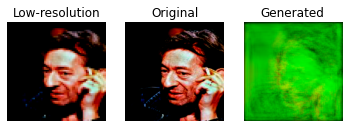

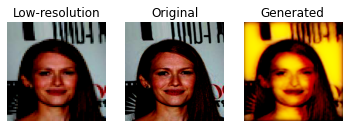

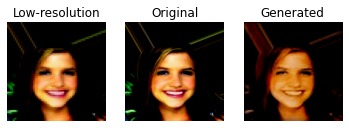

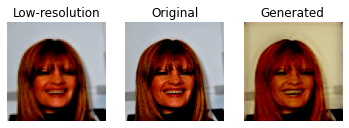

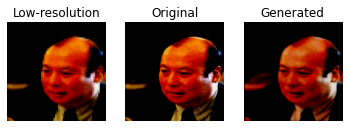

...

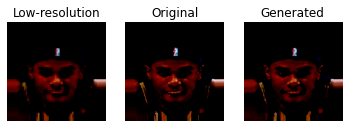

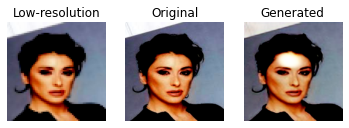

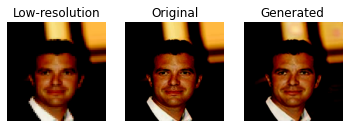

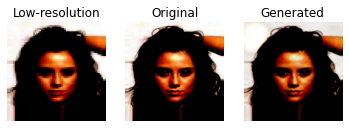

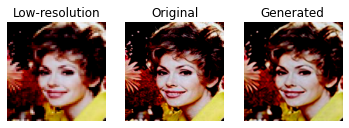

In [35]:
gan = SRGAN()
gan.train()

# Оценка результатов
На некоторых изображениях наблюдаются артефакты(цветные пятна). Тональность генерируемых картинок отличается от исходного изображения.

# Посмотрим на работу генератора
Загружаем модель генератора(ниже это модель после 18 000 эпох обучения)

In [46]:
from keras.models import load_model
model = load_model('/content/models/generator.h5')

/usr/local/lib/python3.6/dist-packages/keras/models.py:245: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Выбрав одно изображение, сжав его, подаём модели генератора.

In [105]:
from scipy.misc import imsave, imread
import numpy as np
from skimage.transform import resize
img = imread('/content/img_align_celeba/000089.jpg')
img = img.astype(np.float32)
img = img / 127.5 - 1.
img = resize(img, (64, 64, 3))
img_to_gen = np.expand_dims(img, axis=0)
img_res = model.predict(img_to_gen)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
  after removing the cwd from sys.path.


Выведем для сравнения сжатое изображение(низкое разрешение) и результат работы генератора.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'From generator')

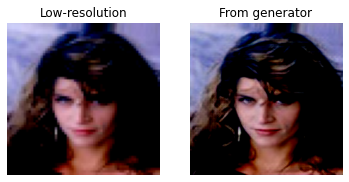

In [106]:
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(1, 2, 1)
ax.imshow(img_to_gen[0])
ax.axis("off")
ax.set_title("Low-resolution")

ax = fig.add_subplot(1, 2, 2)
ax.imshow(img_res[0])
ax.axis("off")
ax.set_title("From generator")

## Использованные ресурсы:




https://hub.packtpub.com/using-srgans-to-generate-photo-realistic-images-tutorial/

https://github.com/apachecn/apachecn-dl-zh/blob/master/docs/gan-proj/5.md